<a href="https://colab.research.google.com/github/jamessutton600613-png/GC/blob/main/Untitled274.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


[INFO] Analysing 3WU2 ...


/tmp/ipython-input-2473466855.py:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384


  -> djA_g_mean=3.2954e+00, djB_g_mean=2.7175e+00

[INFO] Analysing 6W1U ...
  -> djA_g_mean=1.5208e+01, djB_g_mean=1.1486e+01

[INFO] Analysing 7RF1 ...
  -> djA_g_mean=2.4101e+00, djB_g_mean=1.7295e+00

[INFO] Analysing 8F4C ...
  -> djA_g_mean=1.2503e+01, djB_g_mean=1.1005e+01

[INFO] Analysing 8F4D ...
  -> djA_g_mean=1.3853e+01, djB_g_mean=1.1929e+01

[INFO] Analysing 8F4E ...
  -> djA_g_mean=1.4451e+01, djB_g_mean=1.1496e+01

[INFO] Analysing 8F4F ...
  -> djA_g_mean=2.5613e+00, djB_g_mean=1.9394e+00

[INFO] Analysing 8F4G ...
  -> djA_g_mean=1.4105e+01, djB_g_mean=1.1255e+01

[INFO] Analysing 8F4H ...
  -> djA_g_mean=1.3405e+01, djB_g_mean=1.0687e+01

[INFO] Analysing 8F4I ...
  -> djA_g_mean=1.3404e+01, djB_g_mean=1.0691e+01

[INFO] Analysing 8F4J ...
  -> djA_g_mean=1.3406e+01, djB_g_mean=1.0692e+01

[INFO] Analysing 8F4K ...
  -> djA_g_mean=1.4956e+01, djB_g_mean=1.1871e+01

[INFO] Saved benchmark CSV to: /content/oec_qge_two_engines_full/oec_two_engine_benchmark.csv
  struct

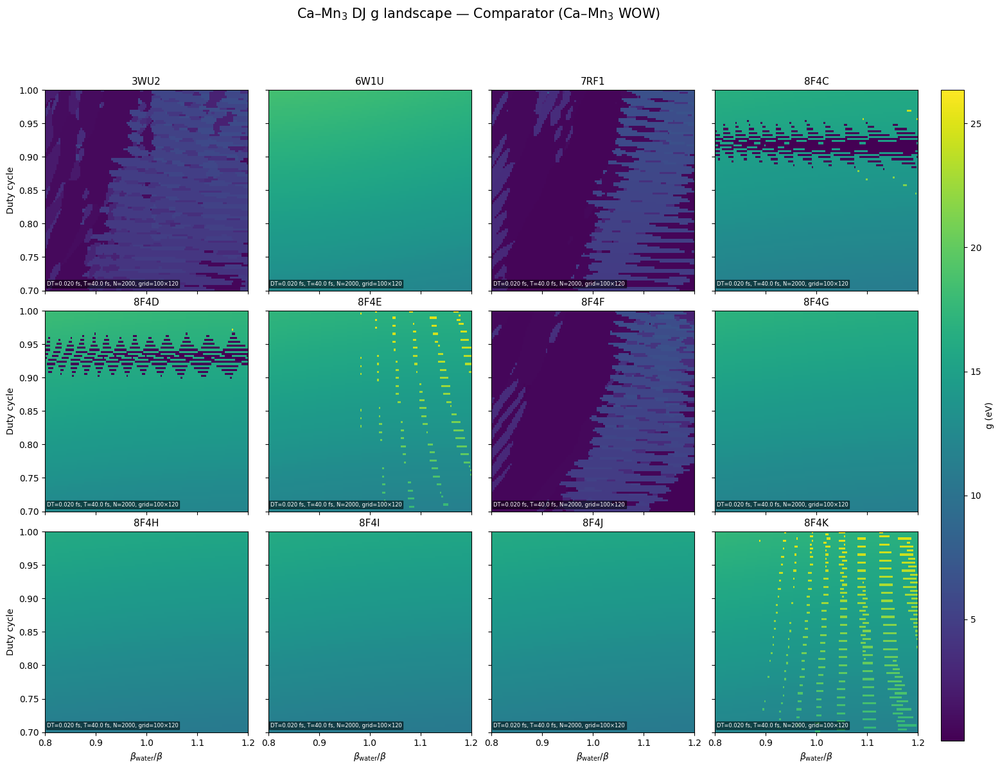

[INFO] Saved comparator g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.pdf


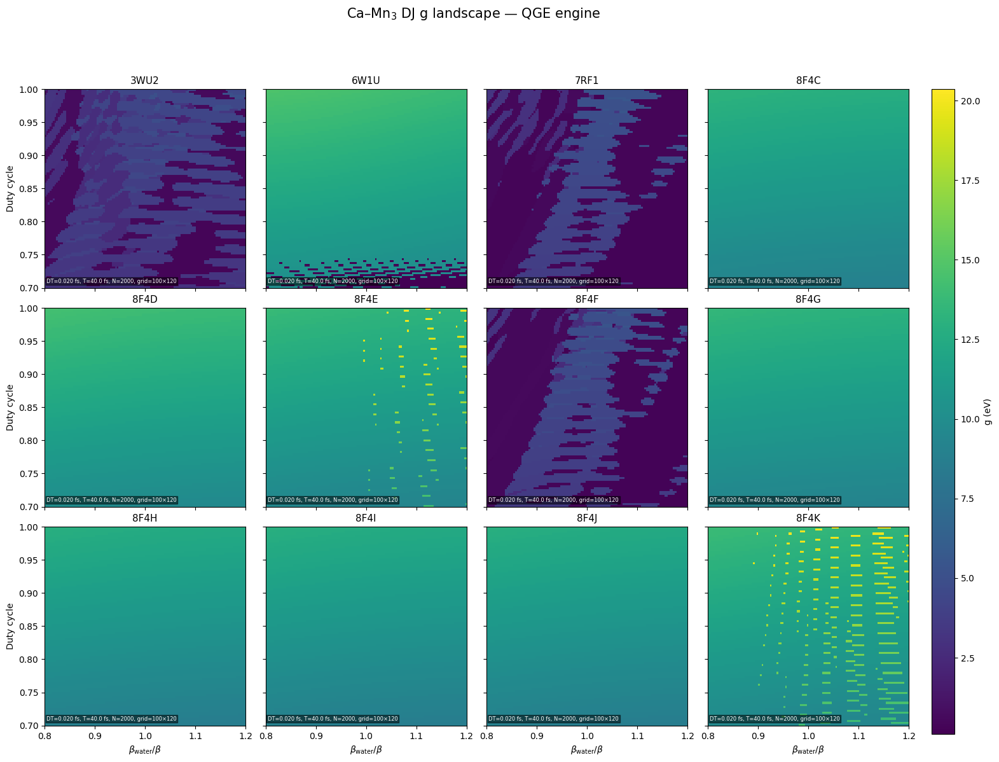

[INFO] Saved qge g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.pdf


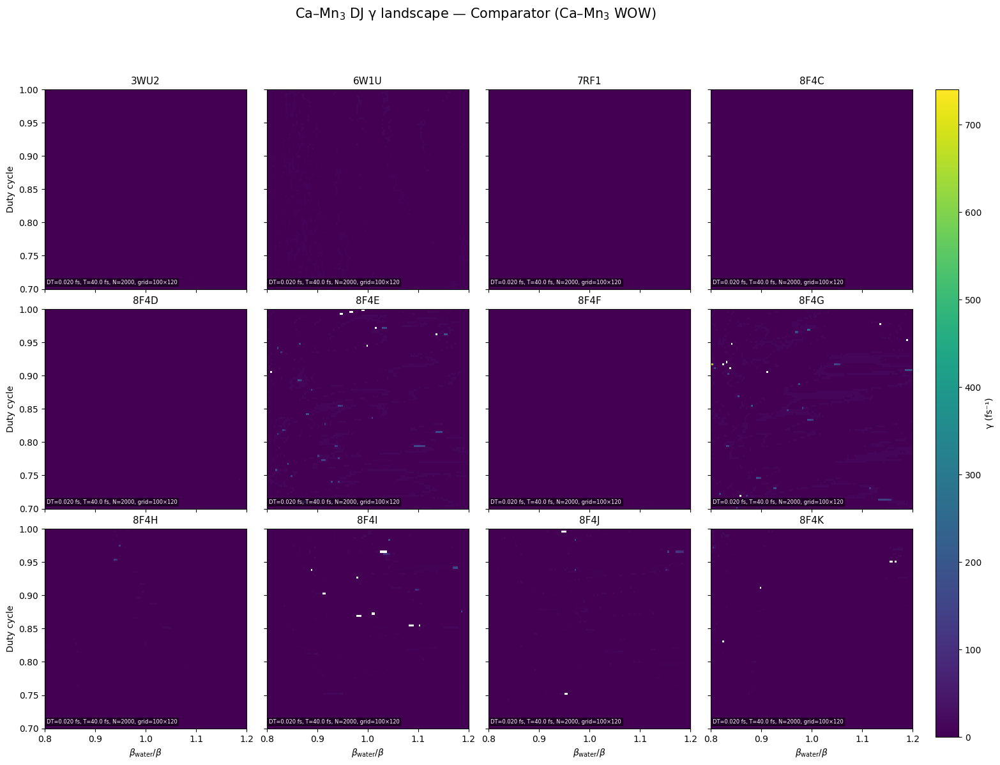

[INFO] Saved comparator gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.pdf


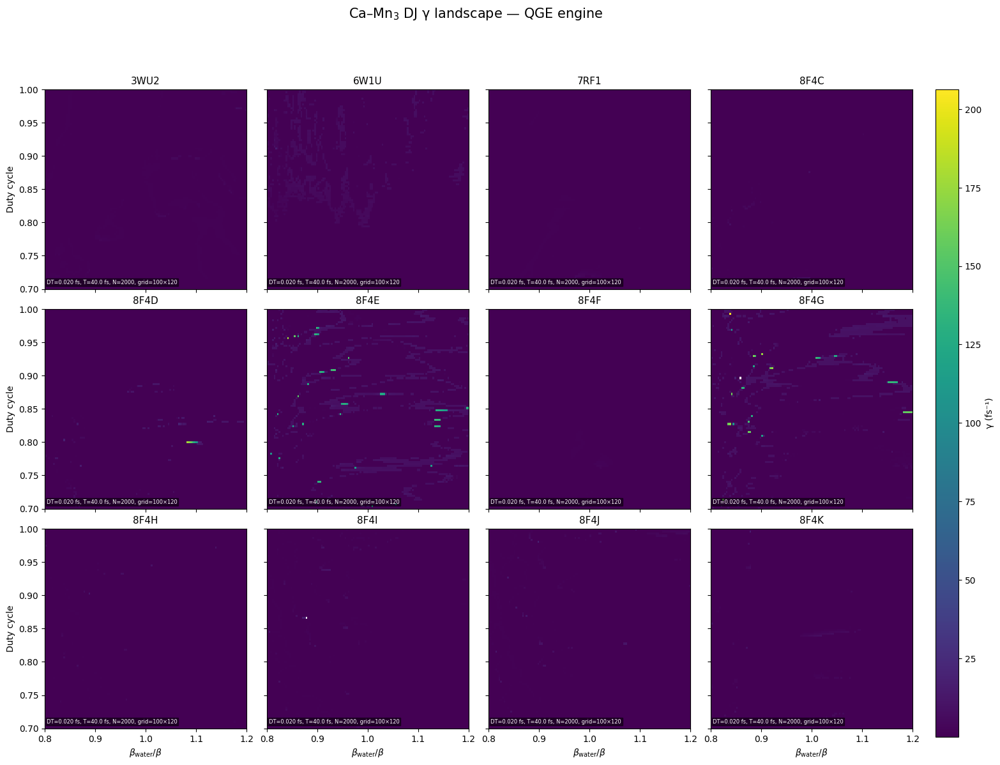

[INFO] Saved qge gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.pdf


In [ ]:
import math  # L001
from pathlib import Path  # L002
import numpy as np  # L003
import gemmi  # L004
from scipy.linalg import expm  # L005
from scipy.optimize import curve_fit  # L006
from scipy.signal import hilbert  # L007
import matplotlib.pyplot as plt  # L008
  # L009
# ---------- GLOBAL CONSTANTS (WOW REGIME PHYSICS) ----------  # L010
H_BAR        = 6.582119569e-16       # eV·s                   # L011
H_BAR_EV_FS  = 6.582119569e-1        # eV·fs (≈0.6582)        # L012
DT_FS        = 0.02                  # fs                     # L013
DT_S         = DT_FS * 1e-15         # seconds                # L014
TOTAL_FS     = 40.0                  # fs                     # L015
N_STEPS      = int(TOTAL_FS / DT_FS)                         # L016
T0           = 10.0                  # comparator coupling    # L017
T0_QGE       = 8.0                   # QGE engine coupling    # L018
BETA_E       = 1.0                   # base decay 1/Å         # L019
COMB_CENTERS = [0.8, 1.1, 1.5, 2.1, 3.4]                     # L020
COMB_WIDTH   = 0.18                  # Å                      # L021
  # L022
# High-res DJ grid                                              # L023
duties = np.linspace(0.70, 1.00, 100)   # duty cycle           # L024
betas  = np.linspace(0.80, 1.20, 120)   # beta_water/beta      # L025
STAMP_TEXT = (                                                  # L026
    f"DT={DT_FS:.3f} fs, T={TOTAL_FS:.1f} fs, "                 # L027
    f"N={N_STEPS}, grid={len(duties)}×{len(betas)}"            # L028
)                                                               # L029
  # L030
# ---------- PATHS / STRUCTURES ------------------------------  # L031
STRUCT_DIR = Path("/content")                                   # L032
BASE_OUT   = Path("/content/oec_qge_two_engines_full")          # L033
OUT_NPZ    = BASE_OUT / "npz"                                   # L034
OUT_PNG    = BASE_OUT / "png"                                   # L035
BASE_OUT.mkdir(parents=True, exist_ok=True)                     # L036
OUT_NPZ.mkdir(parents=True, exist_ok=True)                      # L037
OUT_PNG.mkdir(parents=True, exist_ok=True)                      # L038
  # L039
STRUCTURES = [                                                   # L040
    "3WU2", "6W1U", "7RF1",                                     # L041
    "8F4C", "8F4D", "8F4E", "8F4F",                             # L042
    "8F4G", "8F4H", "8F4I", "8F4J", "8F4K"                      # L043
]                                                               # L044
  # L045
# ---------- GEOMETRY HELPERS (PSII CORE 16) ------------------ # L046
def _atom_iter(struct):  # L047
    for model in struct:  # L048
        for chain in model:  # L049
            for res in chain:  # L050
                for atom in res:  # L051
                    yield model, chain, res, atom  # L052
  # L053
def _combinations(iterable, r):  # L054
    pool = tuple(iterable)  # L055
    n = len(pool)  # L056
    if r > n:  # L057
        return  # L058
    idx = list(range(r))  # L059
    yield tuple(pool[i] for i in idx)  # L060
    while True:  # L061
        for i in reversed(range(r)):  # L062
            if idx[i] != i + n - r:  # L063
                break  # L064
        else:  # L065
            return  # L066
        idx[i] += 1  # L067
        for j in range(i + 1, r):  # L068
            idx[j] = idx[j - 1] + 1  # L069
        yield tuple(pool[i] for i in idx)  # L070
  # L071
def read_structure_any(path: Path):  # L072
    st = gemmi.read_structure(str(path))  # L073
    st.remove_alternative_conformations()  # L074
    st.merge_chain_parts()  # L075
    st.remove_empty_chains()  # L076
    return st  # L077
  # L078
def get_psii_core_16(struct):  # L079
    """Extract the 16-site Mn4CaO5(waters) PSII core used in DJ maps."""  # L080
    mn_atoms, ca_atoms, oxy_atoms, water_oxy = [], [], [], []  # L081
    for _, _, res, atom in _atom_iter(struct):  # L082
        el   = atom.element.name.upper()  # L083
        resn = res.name.upper()  # L084
        pos  = np.array([atom.pos.x, atom.pos.y, atom.pos.z], dtype=float)  # L085
        if el == "MN":  # L086
            mn_atoms.append((pos, res, atom))  # L087
        elif el == "CA":  # L088
            ca_atoms.append((pos, res, atom))  # L089
        elif el == "O":  # L090
            if resn in ("HOH", "WAT", "H2O", "DOD", "TIP3", "SOL"):  # L091
                water_oxy.append((pos, res, atom))  # L092
            else:  # L093
                oxy_atoms.append((pos, res, atom))  # L094
    if len(mn_atoms) < 4 or len(ca_atoms) == 0:  # L095
        raise RuntimeError("Not enough Mn/Ca atoms")  # L096
    mn_positions = np.array([p for (p, _, _) in mn_atoms])  # L097
    best_idx = None  # L098
    best_score = 1e9  # L099
    for idxs in _combinations(range(len(mn_positions)), 4):  # L100
        pts   = mn_positions[list(idxs)]  # L101
        c     = pts.mean(axis=0)  # L102
        score = np.sum(np.linalg.norm(pts - c, axis=1))  # L103
        if score < best_score:  # L104
            best_score = score  # L105
            best_idx   = idxs  # L106
    Mn_sel = [mn_atoms[i] for i in best_idx]  # L107
    Mn_pos = np.array([p for (p, _, _) in Mn_sel])  # L108
    c_mn   = Mn_pos.mean(axis=0)  # L109
    Ca_sel = min(ca_atoms, key=lambda t: np.linalg.norm(t[0] - c_mn))  # L110
    Ca_pos = Ca_sel[0]  # L111
    # μ-oxo O within 2.4 Å of two Mn  # L112
    mu_oxo = []  # L113
    for (pos, res, atom) in oxy_atoms:  # L114
        d = np.linalg.norm(Mn_pos - pos, axis=1)  # L115
        close_mn = np.where(d < 2.4)[0]  # L116
        if len(close_mn) >= 2:  # L117
            mu_oxo.append((pos, res, atom))  # L118
    if len(mu_oxo) < 5:  # L119
        raise RuntimeError("Not enough μ-oxo candidates")  # L120
    mu_oxo.sort(key=lambda t: np.linalg.norm(t[0] - c_mn))  # L121
    OX_sel = mu_oxo[:5]  # L122
    OX_pos = np.array([p for (p, _, _) in OX_sel])  # L123
    # Waters: nearest 2 to Mn4Ca centroid  # L124
    cluster_center = np.vstack([Mn_pos, Ca_pos[None, :]]).mean(axis=0)  # L125
    if len(water_oxy) < 2:  # L126
        raise RuntimeError("Not enough waters")  # L127
    water_oxy.sort(key=lambda t: np.linalg.norm(t[0] - cluster_center))  # L128
    W_sel = water_oxy[:2]  # L129
    W_pos = np.array([p for (p, _, _) in W_sel])  # L130
    coords = np.vstack([Mn_pos, Ca_pos[None, :], OX_pos, W_pos])  # L131
    extra_needed = 16 - coords.shape[0]  # L132
    extras = []  # L133
    others = water_oxy[2:] if len(water_oxy) > 2 else []  # L134
    for i in range(extra_needed):  # L135
        if i < len(others):  # L136
            extras.append(others[i][0])  # L137
        else:  # L138
            extras.append(W_pos[-1] + np.array([0.05 * (i + 1), 0.0, 0.0]))  # L139
    if extras:  # L140
        coords = np.vstack([coords, np.array(extras)])  # L141
    if coords.shape[0] != 16:  # L142
        raise RuntimeError("Core is not 16 sites")  # L143
    labels = (  # L144
        [f"Mn{i+1}" for i in range(4)] +  # L145
        ["Ca"] +  # L146
        [f"muO{i+1}" for i in range(5)] +  # L147
        ["OW3", "OW4"] +  # L148
        [f"OWx{i+1}" for i in range(extra_needed)]  # L149
    )  # L150
    return coords, labels  # L151
  # L152
# ---------- HAMILTONIANS + TDSE ENGINES --------------------- # L153
def resonance_comb(r: float) -> float:  # L154
    val = 0.0  # L155
    for c in COMB_CENTERS:  # L156
        val += math.exp(-(r - c) ** 2 / (2 * COMB_WIDTH ** 2))  # L157
    return 1.0 + 1.5 * (val / (len(COMB_CENTERS) + 1e-9))  # L158
  # L159
def build_hamiltonian_comparator(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L160
    """Original Ca–Mn₃ WOW Hamiltonian (comparator engine)."""  # L161
    coords = np.asarray(coords, float)  # L162
    n = coords.shape[0]  # L163
    H = np.zeros((n, n), dtype=np.complex128)  # L164
    diag = np.array([  # L165
        2.0, 2.0, 2.0, 2.0,      # Mn                       # L166
        0.7,                     # Ca                       # L167
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                   # L168
        0.2, 0.2, 0.2, 0.2, 0.2, 0.2  # waters              # L169
    ], dtype=float)  # L170
    np.fill_diagonal(H, diag)  # L171
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L172
    for i in range(n):  # L173
        for j in range(i + 1, n):  # L174
            r = R[i, j]  # L175
            beta = BETA_E  # L176
            if (i >= 10) or (j >= 10):  # L177
                beta = BETA_E * beta_scale_water  # L178
            Tij = T0 * math.exp(-beta * r) * resonance_comb(r) * duty  # L179
            H[i, j] = H[j, i] = Tij  # L180
    return H  # L181
  # L182
def build_hamiltonian_qge(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L183
    """  # L184
    QGE engine Hamiltonian.  # L185
    CURRENTLY: slight variant of comparator (different T0, Ca/water energies).  # L186
    SWAP THIS for your full QGE math when ready.  # L187
    """  # L188
    coords = np.asarray(coords, float)  # L189
    n = coords.shape[0]  # L190
    H = np.zeros((n, n), dtype=np.complex128)  # L191
    diag = np.array([  # L192
        2.0, 2.0, 2.0, 2.0,      # Mn                        # L193
        0.5,                     # Ca (slightly shifted)     # L194
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                    # L195
        0.3, 0.3, 0.3, 0.3, 0.3, 0.3  # waters (stiffer)     # L196
    ], dtype=float)  # L197
    np.fill_diagonal(H, diag)  # L198
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L199
    for i in range(n):  # L200
        for j in range(i + 1, n):  # L201
            r = R[i, j]  # L202
            beta = BETA_E  # L203
            if (i >= 10) or (j >= 10):  # L204
                beta = BETA_E * beta_scale_water  # L205
            Tij = T0_QGE * math.exp(-beta * r) * resonance_comb(r) * duty  # L206
            H[i, j] = H[j, i] = Tij  # L207
    return H  # L208
  # L209
def extract_g_gamma(t_fs, P1, P2, t_min=0.0, t_max=None):  # L210
    t = np.asarray(t_fs)  # L211
    P1 = np.asarray(P1)  # L212
    P2 = np.asarray(P2)  # L213
    if t_max is None:  # L214
        t_max = t[int(0.5 * len(t))]  # L215
    if len(t) < 3:  # L216
        return np.nan, np.nan  # L217
    dP = (P1 - P2)  # L218
    dP = dP - dP.mean()  # L219
    dt = float(t[1] - t[0])  # L220
    freqs = np.fft.rfftfreq(len(t), dt)  # L221
    spec  = np.abs(np.fft.rfft(dP)) ** 2  # L222
    if len(freqs) < 2:  # L223
        return np.nan, np.nan  # L224
    peak_idx = np.argmax(spec[1:]) + 1  # L225
    Omega    = 2.0 * np.pi * freqs[peak_idx]  # L226
    g        = H_BAR_EV_FS * Omega  # L227
    analytic = hilbert(dP)  # L228
    env      = np.abs(analytic)  # L229
    mask    = (t >= t_min) & (t <= t_max)  # L230
    t_fit   = t[mask]  # L231
    env_fit = env[mask]  # L232
    if len(t_fit) < 5:  # L233
        return g, np.nan  # L234
    def model(tt, A, gamma, C):  # L235
        return A * np.exp(-gamma * tt) + C  # L236
    try:  # L237
        A0 = env_fit.max() - env_fit.min()  # L238
        C0 = env_fit.min()  # L239
        g0 = 1.0 / (t_fit[-1] - t_fit[0] + 1e-9)  # L240
        popt, _ = curve_fit(model, t_fit, env_fit, p0=[A0, g0, C0], maxfev=10000)  # L241
        gamma_phi = abs(float(popt[1]))  # L242
    except Exception:  # L243
        gamma_phi = np.nan  # L244
    return g, gamma_phi  # L245
  # L246
def _run_tdse_generic(coords, labels, duty, beta_scale_water, ham_builder) -> tuple:  # L247
    H = ham_builder(coords, duty, beta_scale_water)  # L248
    n = H.shape[0]  # L249
    psi = np.zeros(n, dtype=np.complex128)  # L250
    psi[0] = 1.0  # initial excitation Mn1  # L251
    t_axis_fs = np.arange(N_STEPS) * DT_FS  # L252
    try:  # L253
        idx_Ca = labels.index("Ca")  # L254
        idx_Mn = labels.index("Mn3")  # L255
    except ValueError:  # L256
        raise RuntimeError("Missing Ca/Mn3 labels")  # L257
    P_Ca = np.zeros(N_STEPS, dtype=float)  # L258
    P_Mn = np.zeros(N_STEPS, dtype=float)  # L259
    U = expm(-1j * H * (DT_S / H_BAR))  # L260
    for k in range(N_STEPS):  # L261
        p = np.abs(psi) ** 2  # L262
        P_Ca[k] = p[idx_Ca]  # L263
        P_Mn[k] = p[idx_Mn]  # L264
        psi = U @ psi  # L265
        psi /= np.linalg.norm(psi)  # L266
    g, gamma_phi = extract_g_gamma(t_axis_fs, P_Ca, P_Mn, t_min=0.0, t_max=min(20.0, float(t_axis_fs[-1])))  # L267
    return g, gamma_phi  # L268
  # L269
def run_tdse_camn(coords, labels, duty, beta_scale_water):  # L270
    """Comparator engine (original Ca–Mn3)."""  # L271
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_comparator)  # L272
  # L273
def run_tdse_qge(coords, labels, duty, beta_scale_water):  # L274
    """QGE engine (variant Hamiltonian)."""  # L275
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_qge)  # L276
  # L277
# ---------- DJ MAP METRICS FOR BOTH ENGINES ----------------- # L278
def compute_dj_metrics_for_engine(coords, labels, engine_name: str):  # L279
    """Build DJ maps over (duty, beta) for a chosen engine and summarise scalars."""  # L280
    g_grid     = np.zeros((len(duties), len(betas)), dtype=float)  # L281
    gamma_grid = np.zeros((len(duties), len(betas)), dtype=float)  # L282
    if engine_name == "comparator":  # L283
        runner = run_tdse_camn  # L284
        prefix = "djA_"  # L285
    elif engine_name == "qge":  # L286
        runner = run_tdse_qge  # L287
        prefix = "djB_"  # L288
    else:  # L289
        raise ValueError("engine_name must be 'comparator' or 'qge'")  # L290
    for i, duty in enumerate(duties):  # L291
        for j, beta_scale in enumerate(betas):  # L292
            g_val, gamma_val = runner(coords, labels, duty, beta_scale)  # L293
            g_grid[i, j]     = g_val  # L294
            gamma_grid[i, j] = gamma_val  # L295
    # g-metrics  # L296
    dj_g_mean = float(np.nanmean(g_grid))  # L297
    dj_g_std  = float(np.nanstd(g_grid))  # L298
    dj_g_max  = float(np.nanmax(g_grid))  # L299
    max_idx   = np.unravel_index(np.nanargmax(g_grid), g_grid.shape)  # L300
    dj_g_max_duty = float(duties[max_idx[0]])  # L301
    dj_g_max_beta = float(betas[max_idx[1]])  # L302
    i_nom = int(np.argmin(np.abs(duties - 0.90)))  # L303
    j_nom = int(np.argmin(np.abs(betas - 1.00)))  # L304
    dj_g_nominal = float(g_grid[i_nom, j_nom])  # L305
    # gamma-metrics  # L306
    dj_gamma_mean = float(np.nanmean(gamma_grid))  # L307
    dj_gamma_std  = float(np.nanstd(gamma_grid))  # L308
    dj_gamma_max  = float(np.nanmax(gamma_grid))  # L309
    return {  # L310
        prefix + "g_mean": dj_g_mean,          # L311
        prefix + "g_std": dj_g_std,            # L312
        prefix + "g_max": dj_g_max,            # L313
        prefix + "g_max_duty": dj_g_max_duty,  # L314
        prefix + "g_max_beta": dj_g_max_beta,  # L315
        prefix + "g_nominal": dj_g_nominal,    # L316
        prefix + "gamma_mean": dj_gamma_mean,  # L317
        prefix + "gamma_std": dj_gamma_std,    # L318
        prefix + "gamma_max": dj_gamma_max,    # L319
        prefix + "g_grid": g_grid,             # L320
        prefix + "gamma_grid": gamma_grid,     # L321
    }  # L322
  # L323
# ---------- SIMPLE GEOMETRY METRICS (GQR / QGE) ------------- # L324
def geom_metrics(coords: np.ndarray) -> dict:  # L325
    coords = np.asarray(coords, dtype=np.float32)  # L326
    if coords.size == 0:  # L327
        return {}  # L328
    centroid = coords.mean(axis=0)  # L329
    radii = np.linalg.norm(coords - centroid, axis=1)  # L330
    diffs = coords[:, None, :] - coords[None, :, :]  # L331
    dists = np.linalg.norm(diffs, axis=-1)  # L332
    upper = dists[np.triu_indices_from(dists, k=1)]  # L333
    pair_mean = float(upper.mean())  # L334
    pair_std  = float(upper.std())  # L335
    pair_min  = float(upper.min())  # L336
    pair_max  = float(upper.max())  # L337
    dispersion = pair_std / (pair_mean + 1e-9)  # L338
    curvature_index = float(radii.std() / (radii.mean() + 1e-9))  # L339
    m = radii.mean()  # L340
    s = radii.std() + 1e-9  # L341
    skew = float(((radii - m) ** 3).mean() / (s ** 3))  # L342
    median_sep = float(np.median(upper))  # L343
    casimir_gap = median_sep - pair_min  # L344
    return {  # L345
        "n_atoms": int(coords.shape[0]),  # L346
        "radius_mean": float(radii.mean()),  # L347
        "radius_std": float(radii.std()),  # L348
        "radius_max": float(radii.max()),  # L349
        "gqr_pair_mean": pair_mean,  # L350
        "gqr_pair_std": pair_std,  # L351
        "gqr_pair_min": pair_min,  # L352
        "gqr_pair_max": pair_max,  # L353
        "gqr_dispersion": dispersion,  # L354
        "qge_curvature_index": curvature_index,  # L355
        "qge_casimir_gap": casimir_gap,  # L356
        "qge_radial_skew": skew,  # L357
    }  # L358
  # L359
# ---------- PER-STRUCTURE PLOTTING (4 PANELS) --------------- # L360
def plot_per_structure(struct_name: str, gA, gamA, gB, gamB):  # L361
    """4-panel figure: comparator/QGE × (g, gamma)."""  # L362
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L363
    fig, axes = plt.subplots(2, 2, figsize=(9, 7), sharex=True, sharey=True)  # L364
    (ax11, ax12), (ax21, ax22) = axes  # L365
    im11 = ax11.imshow(gA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L366
    ax11.set_title("Comparator g")  # L367
    im12 = ax12.imshow(gamA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L368
    ax12.set_title("Comparator γ")  # L369
    im21 = ax21.imshow(gB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L370
    ax21.set_title("QGE g")  # L371
    im22 = ax22.imshow(gamB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L372
    ax22.set_title("QGE γ")  # L373
    for ax in axes[-1, :]:  # L374
        ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L375
    for ax in axes[:, 0]:  # L376
        ax.set_ylabel("Duty cycle")  # L377
    fig.suptitle(f"{struct_name}: DJ g & γ (Comparator vs QGE)")  # L378
    cbar_ax1 = fig.add_axes([0.92, 0.55, 0.02, 0.30])  # L379
    plt.colorbar(im11, cax=cbar_ax1).set_label("g (eV)")  # L380
    cbar_ax2 = fig.add_axes([0.92, 0.15, 0.02, 0.30])  # L381
    plt.colorbar(im12, cax=cbar_ax2).set_label("γ (fs⁻¹)")  # L382
    out_png = OUT_PNG / f"DJ_{struct_name}_4panel.png"  # L383
    fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384
    fig.savefig(out_png, dpi=300)  # L385
    plt.close(fig)  # L386
  # L387
# ---------- EQUIVALENCE HARNESS ----------------------------- # L388
def analyse_single_oec(struct_name: str) -> dict:  # L389
    rec = {"structure": struct_name}  # L390
    cif_path = STRUCT_DIR / f"{struct_name}.cif"  # L391
    if not cif_path.exists():  # L392
        rec["error"] = "cif_not_found"  # L393
        return rec  # L394
    try:  # L395
        st = read_structure_any(cif_path)  # L396
    except Exception as e:  # L397
        rec["error"] = f"load_failed: {e}"  # L398
        return rec  # L399
    try:  # L400
        coords, labels = get_psii_core_16(st)  # L401
    except Exception as e:  # L402
        rec["error"] = f"core16_failed: {e}"  # L403
        return rec  # L404
    rec.update(geom_metrics(coords))  # L405
    djA = compute_dj_metrics_for_engine(coords, labels, "comparator")  # L406
    djB = compute_dj_metrics_for_engine(coords, labels, "qge")         # L407
    g_gridA     = djA.pop("djA_g_grid")        # L408
    gamma_gridA = djA.pop("djA_gamma_grid")    # L409
    g_gridB     = djB.pop("djB_g_grid")        # L410
    gamma_gridB = djB.pop("djB_gamma_grid")    # L411
    rec.update(djA)  # L412
    rec.update(djB)  # L413
    npz_path = OUT_NPZ / f"DJ_{struct_name}_two_engines.npz"  # L414
    np.savez(
        npz_path,
        g_grid_comparator=g_gridA,
        gamma_grid_comparator=gamma_gridA,
        g_grid_qge=g_gridB,
        gamma_grid_qge=gamma_gridB,
        duties=duties,
        betas=betas,
    )  # L415
    rec["dj_npz"] = str(npz_path)  # L416
    # Per-structure PNG (4 panels) for quality inspection        # L417
    plot_per_structure(struct_name, g_gridA, gamma_gridA, g_gridB, gamma_gridB)  # L418
    return rec  # L419
  # L420
def run_oec_benchmark(struct_names=None):  # L421
    import pandas as pd  # L422
    if struct_names is None:  # L423
        struct_names = STRUCTURES  # L424
    records = []  # L425
    for name in struct_names:  # L426
        print(f"\n[INFO] Analysing {name} ...")  # L427
        rec = analyse_single_oec(name)  # L428
        records.append(rec)  # L429
        if "error" in rec:  # L430
            print(f"  -> ERROR: {rec['error']}")  # L431
        else:  # L432
            print(f"  -> djA_g_mean={rec['djA_g_mean']:.4e}, djB_g_mean={rec['djB_g_mean']:.4e}")  # L433
    df = pd.DataFrame.from_records(records)  # L434
    csv_path = BASE_OUT / "oec_two_engine_benchmark.csv"  # L435
    df.to_csv(csv_path, index=False)  # L436
    print(f"\n[INFO] Saved benchmark CSV to: {csv_path}")  # L437
    return df  # L438
  # L439
# ---------- 3×4 MASTER PLOTS (g or gamma, per engine) ------- # L440
def plot_3x4_from_npz(engine: str = "comparator", metric: str = "g"):  # L441
    """engine in {'comparator','qge'}, metric in {'g','gamma'}."""  # L442
    if engine not in ("comparator", "qge"):  # L443
        raise ValueError("engine must be 'comparator' or 'qge'")  # L444
    if metric not in ("g", "gamma"):  # L445
        raise ValueError("metric must be 'g' or 'gamma'")  # L446
    key = f"{metric}_grid_comparator" if engine == "comparator" else f"{metric}_grid_qge"  # L447
    grids = {}  # L448
    g_min, g_max = np.inf, -np.inf  # L449
    for s in STRUCTURES:  # L450
        npz_path = OUT_NPZ / f"DJ_{s}_two_engines.npz"  # L451
        if not npz_path.exists():  # L452
            continue  # L453
        data = np.load(npz_path)  # L454
        g_grid = data[key]  # L455
        grids[s] = g_grid  # L456
        g_min = min(g_min, np.nanmin(g_grid))  # L457
        g_max = max(g_max, np.nanmax(g_grid))  # L458
    n_structs = len(STRUCTURES)  # L459
    n_rows, n_cols = 3, 4  # L460
    assert n_rows * n_cols == n_structs  # L461
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 13), sharex=True, sharey=True)  # L462
    fig.subplots_adjust(right=0.88, wspace=0.10, hspace=0.10)  # L463
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L464
    for idx, struct in enumerate(STRUCTURES):  # L465
        r = idx // n_cols  # L466
        c = idx % n_cols  # L467
        ax = axes[r, c]  # L468
        if struct not in grids:  # L469
            ax.axis("off")  # L470
            continue  # L471
        g_grid = grids[struct]  # L472
        im = ax.imshow(g_grid, origin="lower", extent=extent,
                       aspect="auto", interpolation="nearest",
                       vmin=g_min, vmax=g_max)  # L473
        ax.set_title(struct, fontsize=11)  # L474
        ax.text(0.01, 0.02, STAMP_TEXT, transform=ax.transAxes,
                fontsize=6, color="white", ha="left", va="bottom",
                bbox=dict(facecolor="black", alpha=0.5, pad=1))  # L475
        if r == n_rows - 1:  # L476
            ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L477
        if c == 0:  # L478
            ax.set_ylabel("Duty cycle")  # L479
    cbar_ax = fig.add_axes([0.90, 0.10, 0.02, 0.78])  # L480
    cb = fig.colorbar(im, cax=cbar_ax)  # L481
    cb.set_label("g (eV)" if metric == "g" else "γ (fs⁻¹)")  # L482
    title_engine = "Comparator (Ca–Mn$_3$ WOW)" if engine == "comparator" else "QGE engine"  # L483
    title_metric = "g" if metric == "g" else "γ"  # L484
    fig.suptitle(f"Ca–Mn$_3$ DJ {title_metric} landscape — {title_engine}", fontsize=15)  # L485
    out_png = OUT_PNG / f"DJ_3x4_{engine}_{metric}.png"  # L486
    out_pdf = OUT_PNG / f"DJ_3x4_{engine}_{metric}.pdf"  # L487
    fig.savefig(out_png, dpi=600)  # L488
    fig.savefig(out_pdf)  # L489
    plt.show()  # L490
    plt.close(fig)  # L491
    print(f"[INFO] Saved {engine} {metric} 3×4 figure to {out_png} and {out_pdf}")  # L492
  # L493
if __name__ == "__main__":  # L494
    df = run_oec_benchmark()  # L495
    print(df.head())  # L496
    # Master plots for quick comparison                             # L497
    plot_3x4_from_npz(engine="comparator", metric="g")      # L498
    plot_3x4_from_npz(engine="qge",        metric="g")      # L499
    plot_3x4_from_npz(engine="comparator", metric="gamma")  # L500
    plot_3x4_from_npz(engine="qge",        metric="gamma")  # L501


[INFO] Analysing 3WU2 ...


/tmp/ipython-input-2473466855.py:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384


  -> djA_g_mean=3.2954e+00, djB_g_mean=2.7175e+00

[INFO] Analysing 6W1U ...
  -> djA_g_mean=1.5208e+01, djB_g_mean=1.1486e+01

[INFO] Analysing 7RF1 ...
  -> djA_g_mean=2.4101e+00, djB_g_mean=1.7295e+00

[INFO] Analysing 8F4C ...
  -> djA_g_mean=1.2503e+01, djB_g_mean=1.1005e+01

[INFO] Analysing 8F4D ...
  -> djA_g_mean=1.3853e+01, djB_g_mean=1.1929e+01

[INFO] Analysing 8F4E ...
  -> djA_g_mean=1.4451e+01, djB_g_mean=1.1496e+01

[INFO] Analysing 8F4F ...
  -> djA_g_mean=2.5613e+00, djB_g_mean=1.9394e+00

[INFO] Analysing 8F4G ...
  -> djA_g_mean=1.4105e+01, djB_g_mean=1.1255e+01

[INFO] Analysing 8F4H ...
  -> djA_g_mean=1.3405e+01, djB_g_mean=1.0687e+01

[INFO] Analysing 8F4I ...
  -> djA_g_mean=1.3404e+01, djB_g_mean=1.0691e+01

[INFO] Analysing 8F4J ...
  -> djA_g_mean=1.3406e+01, djB_g_mean=1.0692e+01

[INFO] Analysing 8F4K ...
  -> djA_g_mean=1.4956e+01, djB_g_mean=1.1871e+01

[INFO] Saved benchmark CSV to: /content/oec_qge_two_engines_full/oec_two_engine_benchmark.csv
  struct

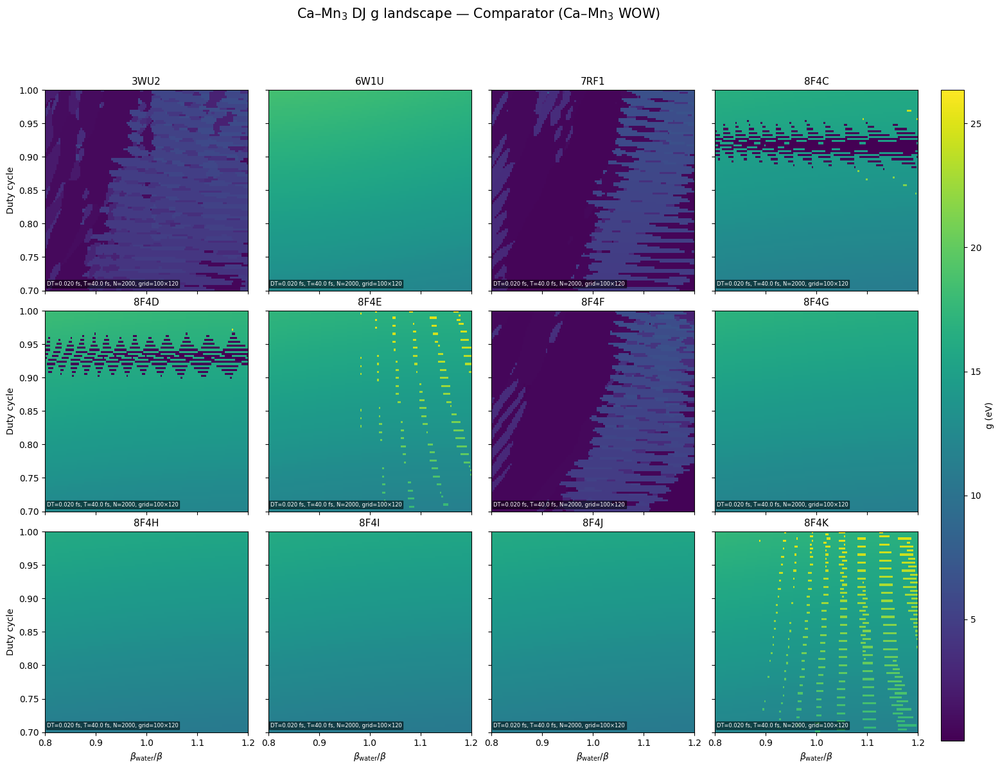

[INFO] Saved comparator g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.pdf


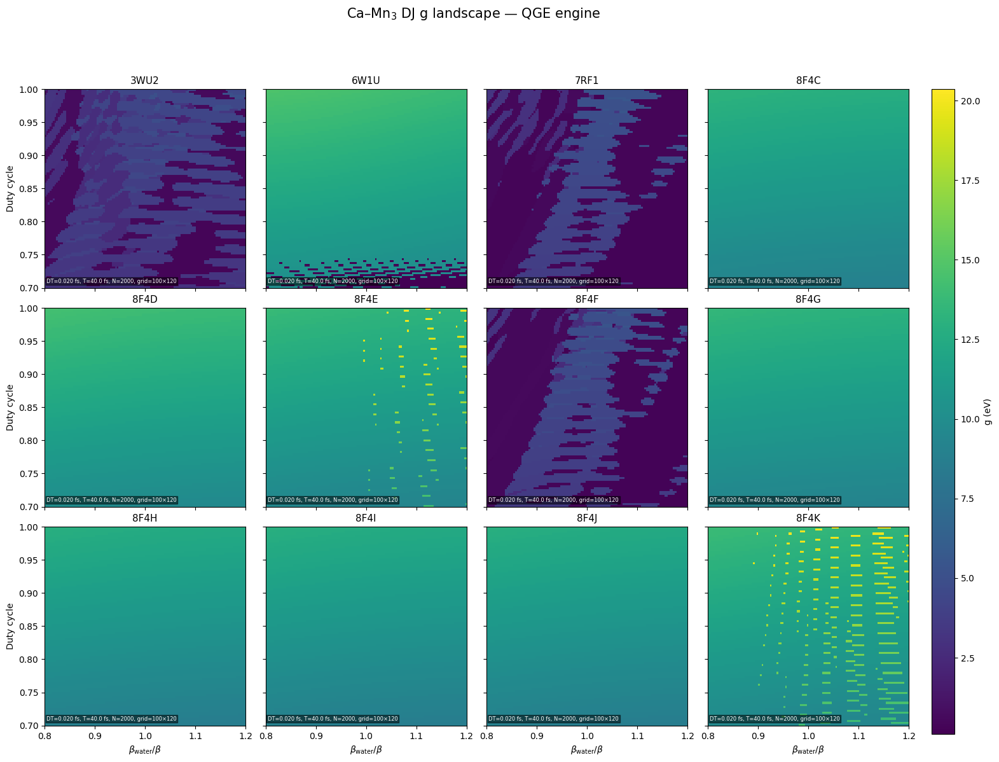

[INFO] Saved qge g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.pdf


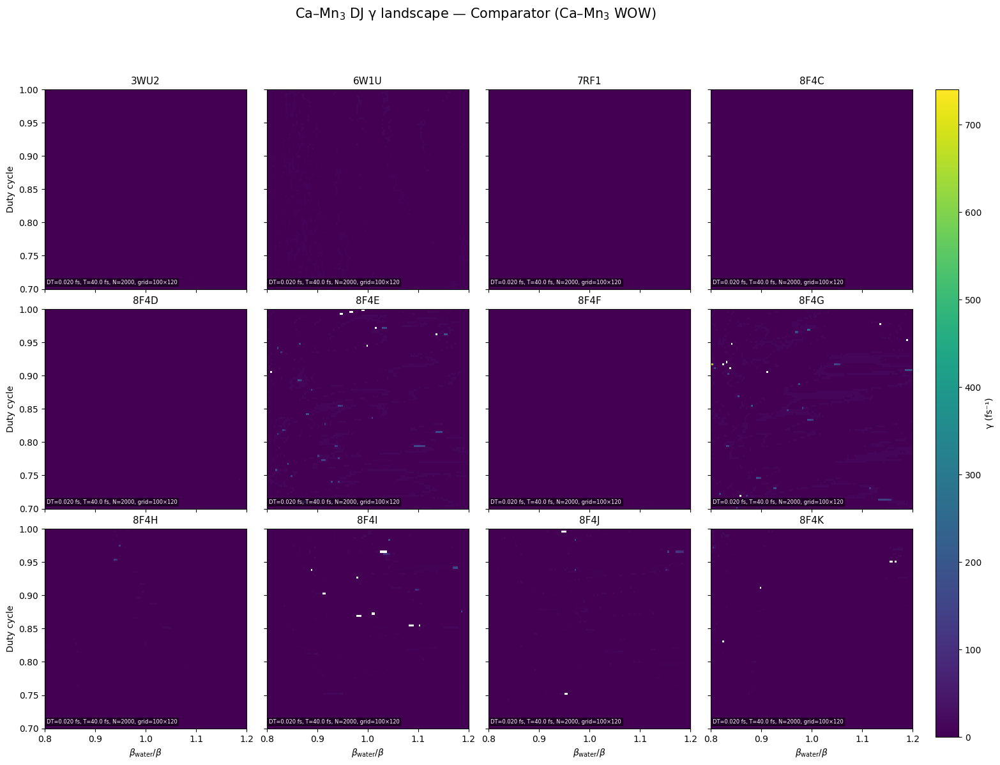

[INFO] Saved comparator gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.pdf


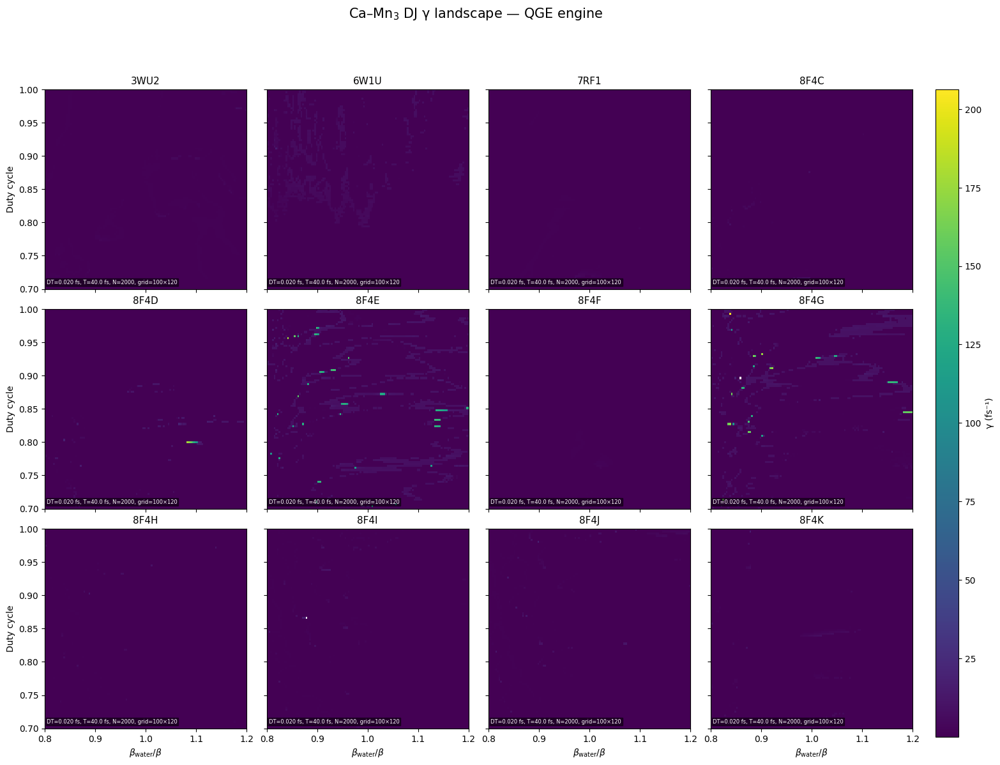

[INFO] Saved qge gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.pdf


In [ ]:
import math  # L001
from pathlib import Path  # L002
import numpy as np  # L003
import gemmi  # L004
from scipy.linalg import expm  # L005
from scipy.optimize import curve_fit  # L006
from scipy.signal import hilbert  # L007
import matplotlib.pyplot as plt  # L008
  # L009
# ---------- GLOBAL CONSTANTS (WOW REGIME PHYSICS) ----------  # L010
H_BAR        = 6.582119569e-16       # eV·s                   # L011
H_BAR_EV_FS  = 6.582119569e-1        # eV·fs (≈0.6582)        # L012
DT_FS        = 0.02                  # fs                     # L013
DT_S         = DT_FS * 1e-15         # seconds                # L014
TOTAL_FS     = 40.0                  # fs                     # L015
N_STEPS      = int(TOTAL_FS / DT_FS)                         # L016
T0           = 10.0                  # comparator coupling    # L017
T0_QGE       = 8.0                   # QGE engine coupling    # L018
BETA_E       = 1.0                   # base decay 1/Å         # L019
COMB_CENTERS = [0.8, 1.1, 1.5, 2.1, 3.4]                     # L020
COMB_WIDTH   = 0.18                  # Å                      # L021
  # L022
# High-res DJ grid                                              # L023
duties = np.linspace(0.70, 1.00, 100)   # duty cycle           # L024
betas  = np.linspace(0.80, 1.20, 120)   # beta_water/beta      # L025
STAMP_TEXT = (                                                  # L026
    f"DT={DT_FS:.3f} fs, T={TOTAL_FS:.1f} fs, "                 # L027
    f"N={N_STEPS}, grid={len(duties)}×{len(betas)}"            # L028
)                                                               # L029
  # L030
# ---------- PATHS / STRUCTURES ------------------------------  # L031
STRUCT_DIR = Path("/content")                                   # L032
BASE_OUT   = Path("/content/oec_qge_two_engines_full")          # L033
OUT_NPZ    = BASE_OUT / "npz"                                   # L034
OUT_PNG    = BASE_OUT / "png"                                   # L035
BASE_OUT.mkdir(parents=True, exist_ok=True)                     # L036
OUT_NPZ.mkdir(parents=True, exist_ok=True)                      # L037
OUT_PNG.mkdir(parents=True, exist_ok=True)                      # L038
  # L039
STRUCTURES = [                                                   # L040
    "3WU2", "6W1U", "7RF1",                                     # L041
    "8F4C", "8F4D", "8F4E", "8F4F",                             # L042
    "8F4G", "8F4H", "8F4I", "8F4J", "8F4K"                      # L043
]                                                               # L044
  # L045
# ---------- GEOMETRY HELPERS (PSII CORE 16) ------------------ # L046
def _atom_iter(struct):  # L047
    for model in struct:  # L048
        for chain in model:  # L049
            for res in chain:  # L050
                for atom in res:  # L051
                    yield model, chain, res, atom  # L052
  # L053
def _combinations(iterable, r):  # L054
    pool = tuple(iterable)  # L055
    n = len(pool)  # L056
    if r > n:  # L057
        return  # L058
    idx = list(range(r))  # L059
    yield tuple(pool[i] for i in idx)  # L060
    while True:  # L061
        for i in reversed(range(r)):  # L062
            if idx[i] != i + n - r:  # L063
                break  # L064
        else:  # L065
            return  # L066
        idx[i] += 1  # L067
        for j in range(i + 1, r):  # L068
            idx[j] = idx[j - 1] + 1  # L069
        yield tuple(pool[i] for i in idx)  # L070
  # L071
def read_structure_any(path: Path):  # L072
    st = gemmi.read_structure(str(path))  # L073
    st.remove_alternative_conformations()  # L074
    st.merge_chain_parts()  # L075
    st.remove_empty_chains()  # L076
    return st  # L077
  # L078
def get_psii_core_16(struct):  # L079
    """Extract the 16-site Mn4CaO5(waters) PSII core used in DJ maps."""  # L080
    mn_atoms, ca_atoms, oxy_atoms, water_oxy = [], [], [], []  # L081
    for _, _, res, atom in _atom_iter(struct):  # L082
        el   = atom.element.name.upper()  # L083
        resn = res.name.upper()  # L084
        pos  = np.array([atom.pos.x, atom.pos.y, atom.pos.z], dtype=float)  # L085
        if el == "MN":  # L086
            mn_atoms.append((pos, res, atom))  # L087
        elif el == "CA":  # L088
            ca_atoms.append((pos, res, atom))  # L089
        elif el == "O":  # L090
            if resn in ("HOH", "WAT", "H2O", "DOD", "TIP3", "SOL"):  # L091
                water_oxy.append((pos, res, atom))  # L092
            else:  # L093
                oxy_atoms.append((pos, res, atom))  # L094
    if len(mn_atoms) < 4 or len(ca_atoms) == 0:  # L095
        raise RuntimeError("Not enough Mn/Ca atoms")  # L096
    mn_positions = np.array([p for (p, _, _) in mn_atoms])  # L097
    best_idx = None  # L098
    best_score = 1e9  # L099
    for idxs in _combinations(range(len(mn_positions)), 4):  # L100
        pts   = mn_positions[list(idxs)]  # L101
        c     = pts.mean(axis=0)  # L102
        score = np.sum(np.linalg.norm(pts - c, axis=1))  # L103
        if score < best_score:  # L104
            best_score = score  # L105
            best_idx   = idxs  # L106
    Mn_sel = [mn_atoms[i] for i in best_idx]  # L107
    Mn_pos = np.array([p for (p, _, _) in Mn_sel])  # L108
    c_mn   = Mn_pos.mean(axis=0)  # L109
    Ca_sel = min(ca_atoms, key=lambda t: np.linalg.norm(t[0] - c_mn))  # L110
    Ca_pos = Ca_sel[0]  # L111
    # μ-oxo O within 2.4 Å of two Mn  # L112
    mu_oxo = []  # L113
    for (pos, res, atom) in oxy_atoms:  # L114
        d = np.linalg.norm(Mn_pos - pos, axis=1)  # L115
        close_mn = np.where(d < 2.4)[0]  # L116
        if len(close_mn) >= 2:  # L117
            mu_oxo.append((pos, res, atom))  # L118
    if len(mu_oxo) < 5:  # L119
        raise RuntimeError("Not enough μ-oxo candidates")  # L120
    mu_oxo.sort(key=lambda t: np.linalg.norm(t[0] - c_mn))  # L121
    OX_sel = mu_oxo[:5]  # L122
    OX_pos = np.array([p for (p, _, _) in OX_sel])  # L123
    # Waters: nearest 2 to Mn4Ca centroid  # L124
    cluster_center = np.vstack([Mn_pos, Ca_pos[None, :]]).mean(axis=0)  # L125
    if len(water_oxy) < 2:  # L126
        raise RuntimeError("Not enough waters")  # L127
    water_oxy.sort(key=lambda t: np.linalg.norm(t[0] - cluster_center))  # L128
    W_sel = water_oxy[:2]  # L129
    W_pos = np.array([p for (p, _, _) in W_sel])  # L130
    coords = np.vstack([Mn_pos, Ca_pos[None, :], OX_pos, W_pos])  # L131
    extra_needed = 16 - coords.shape[0]  # L132
    extras = []  # L133
    others = water_oxy[2:] if len(water_oxy) > 2 else []  # L134
    for i in range(extra_needed):  # L135
        if i < len(others):  # L136
            extras.append(others[i][0])  # L137
        else:  # L138
            extras.append(W_pos[-1] + np.array([0.05 * (i + 1), 0.0, 0.0]))  # L139
    if extras:  # L140
        coords = np.vstack([coords, np.array(extras)])  # L141
    if coords.shape[0] != 16:  # L142
        raise RuntimeError("Core is not 16 sites")  # L143
    labels = (  # L144
        [f"Mn{i+1}" for i in range(4)] +  # L145
        ["Ca"] +  # L146
        [f"muO{i+1}" for i in range(5)] +  # L147
        ["OW3", "OW4"] +  # L148
        [f"OWx{i+1}" for i in range(extra_needed)]  # L149
    )  # L150
    return coords, labels  # L151
  # L152
# ---------- HAMILTONIANS + TDSE ENGINES --------------------- # L153
def resonance_comb(r: float) -> float:  # L154
    val = 0.0  # L155
    for c in COMB_CENTERS:  # L156
        val += math.exp(-(r - c) ** 2 / (2 * COMB_WIDTH ** 2))  # L157
    return 1.0 + 1.5 * (val / (len(COMB_CENTERS) + 1e-9))  # L158
  # L159
def build_hamiltonian_comparator(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L160
    """Original Ca–Mn₃ WOW Hamiltonian (comparator engine)."""  # L161
    coords = np.asarray(coords, float)  # L162
    n = coords.shape[0]  # L163
    H = np.zeros((n, n), dtype=np.complex128)  # L164
    diag = np.array([  # L165
        2.0, 2.0, 2.0, 2.0,      # Mn                       # L166
        0.7,                     # Ca                       # L167
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                   # L168
        0.2, 0.2, 0.2, 0.2, 0.2, 0.2  # waters              # L169
    ], dtype=float)  # L170
    np.fill_diagonal(H, diag)  # L171
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L172
    for i in range(n):  # L173
        for j in range(i + 1, n):  # L174
            r = R[i, j]  # L175
            beta = BETA_E  # L176
            if (i >= 10) or (j >= 10):  # L177
                beta = BETA_E * beta_scale_water  # L178
            Tij = T0 * math.exp(-beta * r) * resonance_comb(r) * duty  # L179
            H[i, j] = H[j, i] = Tij  # L180
    return H  # L181
  # L182
def build_hamiltonian_qge(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L183
    """  # L184
    QGE engine Hamiltonian.  # L185
    CURRENTLY: slight variant of comparator (different T0, Ca/water energies).  # L186
    SWAP THIS for your full QGE math when ready.  # L187
    """  # L188
    coords = np.asarray(coords, float)  # L189
    n = coords.shape[0]  # L190
    H = np.zeros((n, n), dtype=np.complex128)  # L191
    diag = np.array([  # L192
        2.0, 2.0, 2.0, 2.0,      # Mn                        # L193
        0.5,                     # Ca (slightly shifted)     # L194
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                    # L195
        0.3, 0.3, 0.3, 0.3, 0.3, 0.3  # waters (stiffer)     # L196
    ], dtype=float)  # L197
    np.fill_diagonal(H, diag)  # L198
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L199
    for i in range(n):  # L200
        for j in range(i + 1, n):  # L201
            r = R[i, j]  # L202
            beta = BETA_E  # L203
            if (i >= 10) or (j >= 10):  # L204
                beta = BETA_E * beta_scale_water  # L205
            Tij = T0_QGE * math.exp(-beta * r) * resonance_comb(r) * duty  # L206
            H[i, j] = H[j, i] = Tij  # L207
    return H  # L208
  # L209
def extract_g_gamma(t_fs, P1, P2, t_min=0.0, t_max=None):  # L210
    t = np.asarray(t_fs)  # L211
    P1 = np.asarray(P1)  # L212
    P2 = np.asarray(P2)  # L213
    if t_max is None:  # L214
        t_max = t[int(0.5 * len(t))]  # L215
    if len(t) < 3:  # L216
        return np.nan, np.nan  # L217
    dP = (P1 - P2)  # L218
    dP = dP - dP.mean()  # L219
    dt = float(t[1] - t[0])  # L220
    freqs = np.fft.rfftfreq(len(t), dt)  # L221
    spec  = np.abs(np.fft.rfft(dP)) ** 2  # L222
    if len(freqs) < 2:  # L223
        return np.nan, np.nan  # L224
    peak_idx = np.argmax(spec[1:]) + 1  # L225
    Omega    = 2.0 * np.pi * freqs[peak_idx]  # L226
    g        = H_BAR_EV_FS * Omega  # L227
    analytic = hilbert(dP)  # L228
    env      = np.abs(analytic)  # L229
    mask    = (t >= t_min) & (t <= t_max)  # L230
    t_fit   = t[mask]  # L231
    env_fit = env[mask]  # L232
    if len(t_fit) < 5:  # L233
        return g, np.nan  # L234
    def model(tt, A, gamma, C):  # L235
        return A * np.exp(-gamma * tt) + C  # L236
    try:  # L237
        A0 = env_fit.max() - env_fit.min()  # L238
        C0 = env_fit.min()  # L239
        g0 = 1.0 / (t_fit[-1] - t_fit[0] + 1e-9)  # L240
        popt, _ = curve_fit(model, t_fit, env_fit, p0=[A0, g0, C0], maxfev=10000)  # L241
        gamma_phi = abs(float(popt[1]))  # L242
    except Exception:  # L243
        gamma_phi = np.nan  # L244
    return g, gamma_phi  # L245
  # L246
def _run_tdse_generic(coords, labels, duty, beta_scale_water, ham_builder) -> tuple:  # L247
    H = ham_builder(coords, duty, beta_scale_water)  # L248
    n = H.shape[0]  # L249
    psi = np.zeros(n, dtype=np.complex128)  # L250
    psi[0] = 1.0  # initial excitation Mn1  # L251
    t_axis_fs = np.arange(N_STEPS) * DT_FS  # L252
    try:  # L253
        idx_Ca = labels.index("Ca")  # L254
        idx_Mn = labels.index("Mn3")  # L255
    except ValueError:  # L256
        raise RuntimeError("Missing Ca/Mn3 labels")  # L257
    P_Ca = np.zeros(N_STEPS, dtype=float)  # L258
    P_Mn = np.zeros(N_STEPS, dtype=float)  # L259
    U = expm(-1j * H * (DT_S / H_BAR))  # L260
    for k in range(N_STEPS):  # L261
        p = np.abs(psi) ** 2  # L262
        P_Ca[k] = p[idx_Ca]  # L263
        P_Mn[k] = p[idx_Mn]  # L264
        psi = U @ psi  # L265
        psi /= np.linalg.norm(psi)  # L266
    g, gamma_phi = extract_g_gamma(t_axis_fs, P_Ca, P_Mn, t_min=0.0, t_max=min(20.0, float(t_axis_fs[-1])))  # L267
    return g, gamma_phi  # L268
  # L269
def run_tdse_camn(coords, labels, duty, beta_scale_water):  # L270
    """Comparator engine (original Ca–Mn3)."""  # L271
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_comparator)  # L272
  # L273
def run_tdse_qge(coords, labels, duty, beta_scale_water):  # L274
    """QGE engine (variant Hamiltonian)."""  # L275
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_qge)  # L276
  # L277
# ---------- DJ MAP METRICS FOR BOTH ENGINES ----------------- # L278
def compute_dj_metrics_for_engine(coords, labels, engine_name: str):  # L279
    """Build DJ maps over (duty, beta) for a chosen engine and summarise scalars."""  # L280
    g_grid     = np.zeros((len(duties), len(betas)), dtype=float)  # L281
    gamma_grid = np.zeros((len(duties), len(betas)), dtype=float)  # L282
    if engine_name == "comparator":  # L283
        runner = run_tdse_camn  # L284
        prefix = "djA_"  # L285
    elif engine_name == "qge":  # L286
        runner = run_tdse_qge  # L287
        prefix = "djB_"  # L288
    else:  # L289
        raise ValueError("engine_name must be 'comparator' or 'qge'")  # L290
    for i, duty in enumerate(duties):  # L291
        for j, beta_scale in enumerate(betas):  # L292
            g_val, gamma_val = runner(coords, labels, duty, beta_scale)  # L293
            g_grid[i, j]     = g_val  # L294
            gamma_grid[i, j] = gamma_val  # L295
    # g-metrics  # L296
    dj_g_mean = float(np.nanmean(g_grid))  # L297
    dj_g_std  = float(np.nanstd(g_grid))  # L298
    dj_g_max  = float(np.nanmax(g_grid))  # L299
    max_idx   = np.unravel_index(np.nanargmax(g_grid), g_grid.shape)  # L300
    dj_g_max_duty = float(duties[max_idx[0]])  # L301
    dj_g_max_beta = float(betas[max_idx[1]])  # L302
    i_nom = int(np.argmin(np.abs(duties - 0.90)))  # L303
    j_nom = int(np.argmin(np.abs(betas - 1.00)))  # L304
    dj_g_nominal = float(g_grid[i_nom, j_nom])  # L305
    # gamma-metrics  # L306
    dj_gamma_mean = float(np.nanmean(gamma_grid))  # L307
    dj_gamma_std  = float(np.nanstd(gamma_grid))  # L308
    dj_gamma_max  = float(np.nanmax(gamma_grid))  # L309
    return {  # L310
        prefix + "g_mean": dj_g_mean,          # L311
        prefix + "g_std": dj_g_std,            # L312
        prefix + "g_max": dj_g_max,            # L313
        prefix + "g_max_duty": dj_g_max_duty,  # L314
        prefix + "g_max_beta": dj_g_max_beta,  # L315
        prefix + "g_nominal": dj_g_nominal,    # L316
        prefix + "gamma_mean": dj_gamma_mean,  # L317
        prefix + "gamma_std": dj_gamma_std,    # L318
        prefix + "gamma_max": dj_gamma_max,    # L319
        prefix + "g_grid": g_grid,             # L320
        prefix + "gamma_grid": gamma_grid,     # L321
    }  # L322
  # L323
# ---------- SIMPLE GEOMETRY METRICS (GQR / QGE) ------------- # L324
def geom_metrics(coords: np.ndarray) -> dict:  # L325
    coords = np.asarray(coords, dtype=np.float32)  # L326
    if coords.size == 0:  # L327
        return {}  # L328
    centroid = coords.mean(axis=0)  # L329
    radii = np.linalg.norm(coords - centroid, axis=1)  # L330
    diffs = coords[:, None, :] - coords[None, :, :]  # L331
    dists = np.linalg.norm(diffs, axis=-1)  # L332
    upper = dists[np.triu_indices_from(dists, k=1)]  # L333
    pair_mean = float(upper.mean())  # L334
    pair_std  = float(upper.std())  # L335
    pair_min  = float(upper.min())  # L336
    pair_max  = float(upper.max())  # L337
    dispersion = pair_std / (pair_mean + 1e-9)  # L338
    curvature_index = float(radii.std() / (radii.mean() + 1e-9))  # L339
    m = radii.mean()  # L340
    s = radii.std() + 1e-9  # L341
    skew = float(((radii - m) ** 3).mean() / (s ** 3))  # L342
    median_sep = float(np.median(upper))  # L343
    casimir_gap = median_sep - pair_min  # L344
    return {  # L345
        "n_atoms": int(coords.shape[0]),  # L346
        "radius_mean": float(radii.mean()),  # L347
        "radius_std": float(radii.std()),  # L348
        "radius_max": float(radii.max()),  # L349
        "gqr_pair_mean": pair_mean,  # L350
        "gqr_pair_std": pair_std,  # L351
        "gqr_pair_min": pair_min,  # L352
        "gqr_pair_max": pair_max,  # L353
        "gqr_dispersion": dispersion,  # L354
        "qge_curvature_index": curvature_index,  # L355
        "qge_casimir_gap": casimir_gap,  # L356
        "qge_radial_skew": skew,  # L357
    }  # L358
  # L359
# ---------- PER-STRUCTURE PLOTTING (4 PANELS) --------------- # L360
def plot_per_structure(struct_name: str, gA, gamA, gB, gamB):  # L361
    """4-panel figure: comparator/QGE × (g, gamma)."""  # L362
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L363
    fig, axes = plt.subplots(2, 2, figsize=(9, 7), sharex=True, sharey=True)  # L364
    (ax11, ax12), (ax21, ax22) = axes  # L365
    im11 = ax11.imshow(gA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L366
    ax11.set_title("Comparator g")  # L367
    im12 = ax12.imshow(gamA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L368
    ax12.set_title("Comparator γ")  # L369
    im21 = ax21.imshow(gB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L370
    ax21.set_title("QGE g")  # L371
    im22 = ax22.imshow(gamB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L372
    ax22.set_title("QGE γ")  # L373
    for ax in axes[-1, :]:  # L374
        ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L375
    for ax in axes[:, 0]:  # L376
        ax.set_ylabel("Duty cycle")  # L377
    fig.suptitle(f"{struct_name}: DJ g & γ (Comparator vs QGE)")  # L378
    cbar_ax1 = fig.add_axes([0.92, 0.55, 0.02, 0.30])  # L379
    plt.colorbar(im11, cax=cbar_ax1).set_label("g (eV)")  # L380
    cbar_ax2 = fig.add_axes([0.92, 0.15, 0.02, 0.30])  # L381
    plt.colorbar(im12, cax=cbar_ax2).set_label("γ (fs⁻¹)")  # L382
    out_png = OUT_PNG / f"DJ_{struct_name}_4panel.png"  # L383
    fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384
    fig.savefig(out_png, dpi=300)  # L385
    plt.close(fig)  # L386
  # L387
# ---------- EQUIVALENCE HARNESS ----------------------------- # L388
def analyse_single_oec(struct_name: str) -> dict:  # L389
    rec = {"structure": struct_name}  # L390
    cif_path = STRUCT_DIR / f"{struct_name}.cif"  # L391
    if not cif_path.exists():  # L392
        rec["error"] = "cif_not_found"  # L393
        return rec  # L394
    try:  # L395
        st = read_structure_any(cif_path)  # L396
    except Exception as e:  # L397
        rec["error"] = f"load_failed: {e}"  # L398
        return rec  # L399
    try:  # L400
        coords, labels = get_psii_core_16(st)  # L401
    except Exception as e:  # L402
        rec["error"] = f"core16_failed: {e}"  # L403
        return rec  # L404
    rec.update(geom_metrics(coords))  # L405
    djA = compute_dj_metrics_for_engine(coords, labels, "comparator")  # L406
    djB = compute_dj_metrics_for_engine(coords, labels, "qge")         # L407
    g_gridA     = djA.pop("djA_g_grid")        # L408
    gamma_gridA = djA.pop("djA_gamma_grid")    # L409
    g_gridB     = djB.pop("djB_g_grid")        # L410
    gamma_gridB = djB.pop("djB_gamma_grid")    # L411
    rec.update(djA)  # L412
    rec.update(djB)  # L413
    npz_path = OUT_NPZ / f"DJ_{struct_name}_two_engines.npz"  # L414
    np.savez(
        npz_path,
        g_grid_comparator=g_gridA,
        gamma_grid_comparator=gamma_gridA,
        g_grid_qge=g_gridB,
        gamma_grid_qge=gamma_gridB,
        duties=duties,
        betas=betas,
    )  # L415
    rec["dj_npz"] = str(npz_path)  # L416
    # Per-structure PNG (4 panels) for quality inspection        # L417
    plot_per_structure(struct_name, g_gridA, gamma_gridA, g_gridB, gamma_gridB)  # L418
    return rec  # L419
  # L420
def run_oec_benchmark(struct_names=None):  # L421
    import pandas as pd  # L422
    if struct_names is None:  # L423
        struct_names = STRUCTURES  # L424
    records = []  # L425
    for name in struct_names:  # L426
        print(f"\n[INFO] Analysing {name} ...")  # L427
        rec = analyse_single_oec(name)  # L428
        records.append(rec)  # L429
        if "error" in rec:  # L430
            print(f"  -> ERROR: {rec['error']}")  # L431
        else:  # L432
            print(f"  -> djA_g_mean={rec['djA_g_mean']:.4e}, djB_g_mean={rec['djB_g_mean']:.4e}")  # L433
    df = pd.DataFrame.from_records(records)  # L434
    csv_path = BASE_OUT / "oec_two_engine_benchmark.csv"  # L435
    df.to_csv(csv_path, index=False)  # L436
    print(f"\n[INFO] Saved benchmark CSV to: {csv_path}")  # L437
    return df  # L438
  # L439
# ---------- 3×4 MASTER PLOTS (g or gamma, per engine) ------- # L440
def plot_3x4_from_npz(engine: str = "comparator", metric: str = "g"):  # L441
    """engine in {'comparator','qge'}, metric in {'g','gamma'}."""  # L442
    if engine not in ("comparator", "qge"):  # L443
        raise ValueError("engine must be 'comparator' or 'qge'")  # L444
    if metric not in ("g", "gamma"):  # L445
        raise ValueError("metric must be 'g' or 'gamma'")  # L446
    key = f"{metric}_grid_comparator" if engine == "comparator" else f"{metric}_grid_qge"  # L447
    grids = {}  # L448
    g_min, g_max = np.inf, -np.inf  # L449
    for s in STRUCTURES:  # L450
        npz_path = OUT_NPZ / f"DJ_{s}_two_engines.npz"  # L451
        if not npz_path.exists():  # L452
            continue  # L453
        data = np.load(npz_path)  # L454
        g_grid = data[key]  # L455
        grids[s] = g_grid  # L456
        g_min = min(g_min, np.nanmin(g_grid))  # L457
        g_max = max(g_max, np.nanmax(g_grid))  # L458
    n_structs = len(STRUCTURES)  # L459
    n_rows, n_cols = 3, 4  # L460
    assert n_rows * n_cols == n_structs  # L461
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 13), sharex=True, sharey=True)  # L462
    fig.subplots_adjust(right=0.88, wspace=0.10, hspace=0.10)  # L463
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L464
    for idx, struct in enumerate(STRUCTURES):  # L465
        r = idx // n_cols  # L466
        c = idx % n_cols  # L467
        ax = axes[r, c]  # L468
        if struct not in grids:  # L469
            ax.axis("off")  # L470
            continue  # L471
        g_grid = grids[struct]  # L472
        im = ax.imshow(g_grid, origin="lower", extent=extent,
                       aspect="auto", interpolation="nearest",
                       vmin=g_min, vmax=g_max)  # L473
        ax.set_title(struct, fontsize=11)  # L474
        ax.text(0.01, 0.02, STAMP_TEXT, transform=ax.transAxes,
                fontsize=6, color="white", ha="left", va="bottom",
                bbox=dict(facecolor="black", alpha=0.5, pad=1))  # L475
        if r == n_rows - 1:  # L476
            ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L477
        if c == 0:  # L478
            ax.set_ylabel("Duty cycle")  # L479
    cbar_ax = fig.add_axes([0.90, 0.10, 0.02, 0.78])  # L480
    cb = fig.colorbar(im, cax=cbar_ax)  # L481
    cb.set_label("g (eV)" if metric == "g" else "γ (fs⁻¹)")  # L482
    title_engine = "Comparator (Ca–Mn$_3$ WOW)" if engine == "comparator" else "QGE engine"  # L483
    title_metric = "g" if metric == "g" else "γ"  # L484
    fig.suptitle(f"Ca–Mn$_3$ DJ {title_metric} landscape — {title_engine}", fontsize=15)  # L485
    out_png = OUT_PNG / f"DJ_3x4_{engine}_{metric}.png"  # L486
    out_pdf = OUT_PNG / f"DJ_3x4_{engine}_{metric}.pdf"  # L487
    fig.savefig(out_png, dpi=600)  # L488
    fig.savefig(out_pdf)  # L489
    plt.show()  # L490
    plt.close(fig)  # L491
    print(f"[INFO] Saved {engine} {metric} 3×4 figure to {out_png} and {out_pdf}")  # L492
  # L493
if __name__ == "__main__":  # L494
    df = run_oec_benchmark()  # L495
    print(df.head())  # L496
    # Master plots for quick comparison                             # L497
    plot_3x4_from_npz(engine="comparator", metric="g")      # L498
    plot_3x4_from_npz(engine="qge",        metric="g")      # L499
    plot_3x4_from_npz(engine="comparator", metric="gamma")  # L500
    plot_3x4_from_npz(engine="qge",        metric="gamma")  # L501


[INFO] Analysing 3WU2 ...


/tmp/ipython-input-2473466855.py:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384


  -> djA_g_mean=3.2954e+00, djB_g_mean=2.7175e+00

[INFO] Analysing 6W1U ...
  -> djA_g_mean=1.5208e+01, djB_g_mean=1.1486e+01

[INFO] Analysing 7RF1 ...
  -> djA_g_mean=2.4101e+00, djB_g_mean=1.7295e+00

[INFO] Analysing 8F4C ...
  -> djA_g_mean=1.2503e+01, djB_g_mean=1.1005e+01

[INFO] Analysing 8F4D ...
  -> djA_g_mean=1.3853e+01, djB_g_mean=1.1929e+01

[INFO] Analysing 8F4E ...
  -> djA_g_mean=1.4451e+01, djB_g_mean=1.1496e+01

[INFO] Analysing 8F4F ...
  -> djA_g_mean=2.5613e+00, djB_g_mean=1.9394e+00

[INFO] Analysing 8F4G ...
  -> djA_g_mean=1.4105e+01, djB_g_mean=1.1255e+01

[INFO] Analysing 8F4H ...
  -> djA_g_mean=1.3405e+01, djB_g_mean=1.0687e+01

[INFO] Analysing 8F4I ...
  -> djA_g_mean=1.3404e+01, djB_g_mean=1.0691e+01

[INFO] Analysing 8F4J ...
  -> djA_g_mean=1.3406e+01, djB_g_mean=1.0692e+01

[INFO] Analysing 8F4K ...
  -> djA_g_mean=1.4956e+01, djB_g_mean=1.1871e+01

[INFO] Saved benchmark CSV to: /content/oec_qge_two_engines_full/oec_two_engine_benchmark.csv
  struct

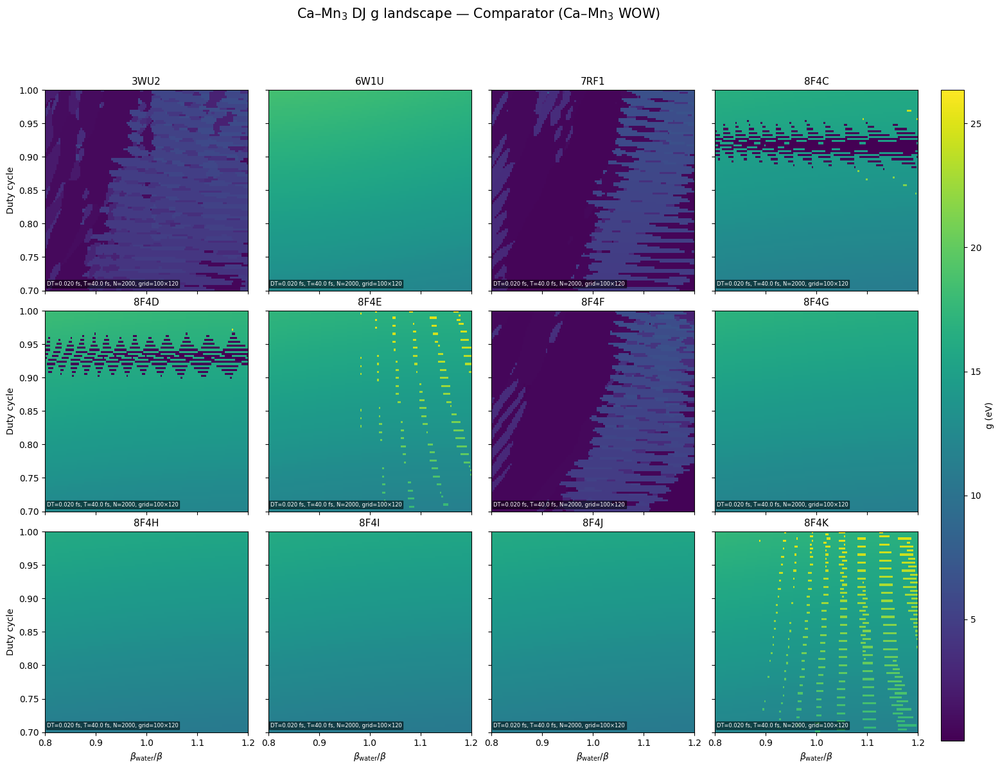

[INFO] Saved comparator g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.pdf


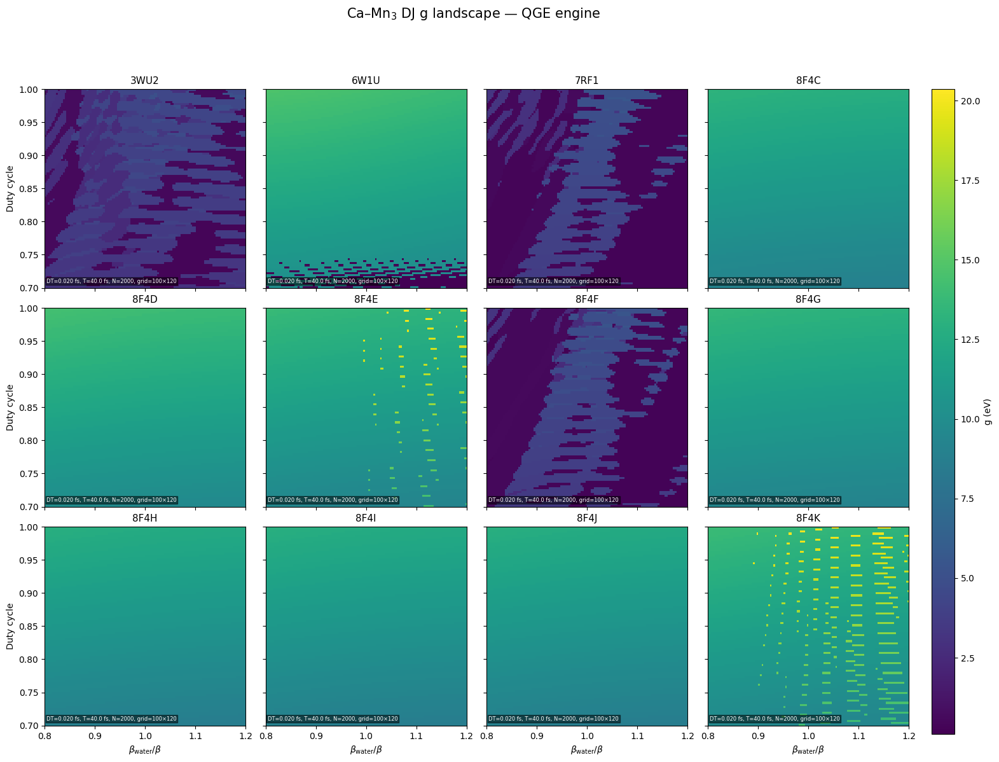

[INFO] Saved qge g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.pdf


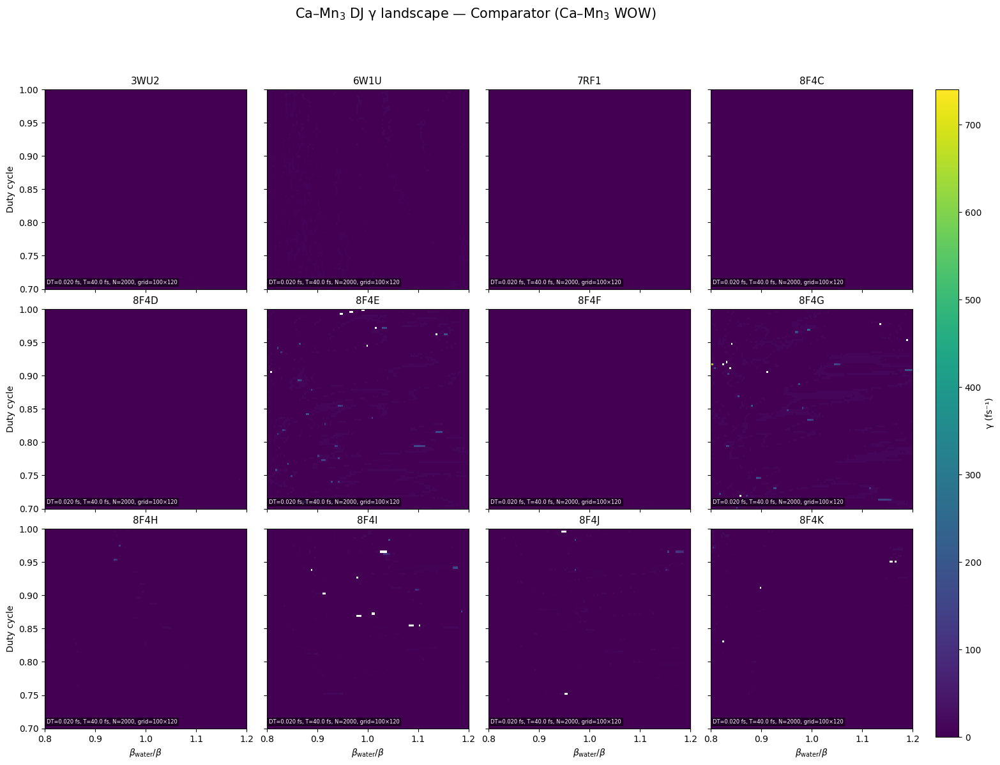

[INFO] Saved comparator gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.pdf


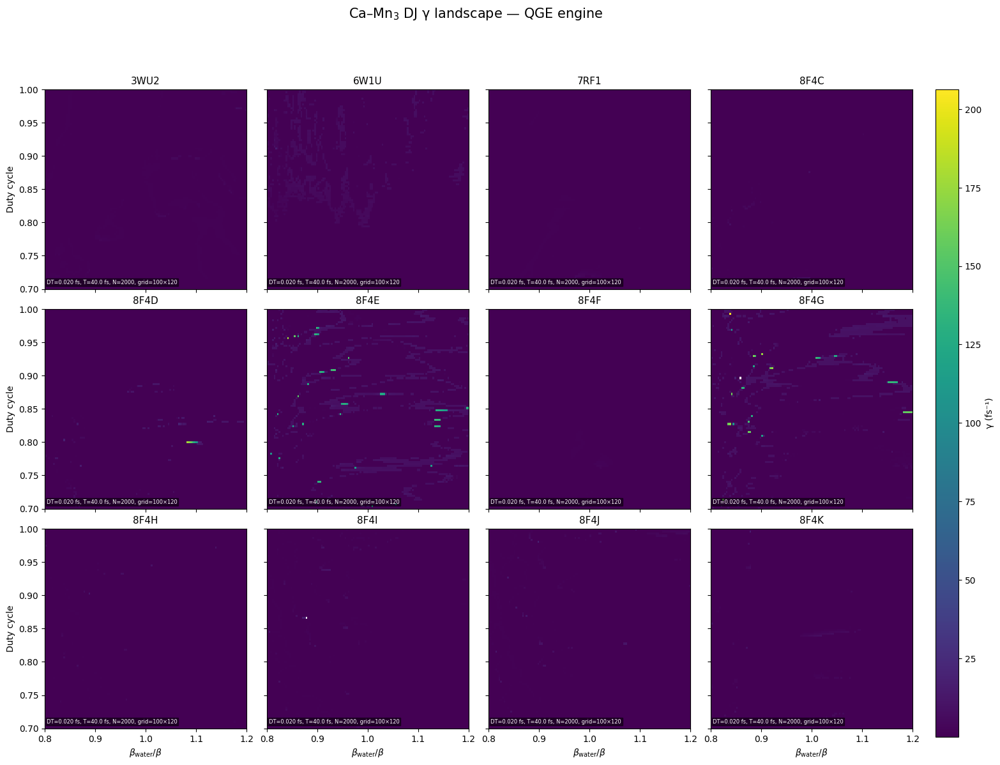

[INFO] Saved qge gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.pdf


In [ ]:
import math  # L001
from pathlib import Path  # L002
import numpy as np  # L003
import gemmi  # L004
from scipy.linalg import expm  # L005
from scipy.optimize import curve_fit  # L006
from scipy.signal import hilbert  # L007
import matplotlib.pyplot as plt  # L008
  # L009
# ---------- GLOBAL CONSTANTS (WOW REGIME PHYSICS) ----------  # L010
H_BAR        = 6.582119569e-16       # eV·s                   # L011
H_BAR_EV_FS  = 6.582119569e-1        # eV·fs (≈0.6582)        # L012
DT_FS        = 0.02                  # fs                     # L013
DT_S         = DT_FS * 1e-15         # seconds                # L014
TOTAL_FS     = 40.0                  # fs                     # L015
N_STEPS      = int(TOTAL_FS / DT_FS)                         # L016
T0           = 10.0                  # comparator coupling    # L017
T0_QGE       = 8.0                   # QGE engine coupling    # L018
BETA_E       = 1.0                   # base decay 1/Å         # L019
COMB_CENTERS = [0.8, 1.1, 1.5, 2.1, 3.4]                     # L020
COMB_WIDTH   = 0.18                  # Å                      # L021
  # L022
# High-res DJ grid                                              # L023
duties = np.linspace(0.70, 1.00, 100)   # duty cycle           # L024
betas  = np.linspace(0.80, 1.20, 120)   # beta_water/beta      # L025
STAMP_TEXT = (                                                  # L026
    f"DT={DT_FS:.3f} fs, T={TOTAL_FS:.1f} fs, "                 # L027
    f"N={N_STEPS}, grid={len(duties)}×{len(betas)}"            # L028
)                                                               # L029
  # L030
# ---------- PATHS / STRUCTURES ------------------------------  # L031
STRUCT_DIR = Path("/content")                                   # L032
BASE_OUT   = Path("/content/oec_qge_two_engines_full")          # L033
OUT_NPZ    = BASE_OUT / "npz"                                   # L034
OUT_PNG    = BASE_OUT / "png"                                   # L035
BASE_OUT.mkdir(parents=True, exist_ok=True)                     # L036
OUT_NPZ.mkdir(parents=True, exist_ok=True)                      # L037
OUT_PNG.mkdir(parents=True, exist_ok=True)                      # L038
  # L039
STRUCTURES = [                                                   # L040
    "3WU2", "6W1U", "7RF1",                                     # L041
    "8F4C", "8F4D", "8F4E", "8F4F",                             # L042
    "8F4G", "8F4H", "8F4I", "8F4J", "8F4K"                      # L043
]                                                               # L044
  # L045
# ---------- GEOMETRY HELPERS (PSII CORE 16) ------------------ # L046
def _atom_iter(struct):  # L047
    for model in struct:  # L048
        for chain in model:  # L049
            for res in chain:  # L050
                for atom in res:  # L051
                    yield model, chain, res, atom  # L052
  # L053
def _combinations(iterable, r):  # L054
    pool = tuple(iterable)  # L055
    n = len(pool)  # L056
    if r > n:  # L057
        return  # L058
    idx = list(range(r))  # L059
    yield tuple(pool[i] for i in idx)  # L060
    while True:  # L061
        for i in reversed(range(r)):  # L062
            if idx[i] != i + n - r:  # L063
                break  # L064
        else:  # L065
            return  # L066
        idx[i] += 1  # L067
        for j in range(i + 1, r):  # L068
            idx[j] = idx[j - 1] + 1  # L069
        yield tuple(pool[i] for i in idx)  # L070
  # L071
def read_structure_any(path: Path):  # L072
    st = gemmi.read_structure(str(path))  # L073
    st.remove_alternative_conformations()  # L074
    st.merge_chain_parts()  # L075
    st.remove_empty_chains()  # L076
    return st  # L077
  # L078
def get_psii_core_16(struct):  # L079
    """Extract the 16-site Mn4CaO5(waters) PSII core used in DJ maps."""  # L080
    mn_atoms, ca_atoms, oxy_atoms, water_oxy = [], [], [], []  # L081
    for _, _, res, atom in _atom_iter(struct):  # L082
        el   = atom.element.name.upper()  # L083
        resn = res.name.upper()  # L084
        pos  = np.array([atom.pos.x, atom.pos.y, atom.pos.z], dtype=float)  # L085
        if el == "MN":  # L086
            mn_atoms.append((pos, res, atom))  # L087
        elif el == "CA":  # L088
            ca_atoms.append((pos, res, atom))  # L089
        elif el == "O":  # L090
            if resn in ("HOH", "WAT", "H2O", "DOD", "TIP3", "SOL"):  # L091
                water_oxy.append((pos, res, atom))  # L092
            else:  # L093
                oxy_atoms.append((pos, res, atom))  # L094
    if len(mn_atoms) < 4 or len(ca_atoms) == 0:  # L095
        raise RuntimeError("Not enough Mn/Ca atoms")  # L096
    mn_positions = np.array([p for (p, _, _) in mn_atoms])  # L097
    best_idx = None  # L098
    best_score = 1e9  # L099
    for idxs in _combinations(range(len(mn_positions)), 4):  # L100
        pts   = mn_positions[list(idxs)]  # L101
        c     = pts.mean(axis=0)  # L102
        score = np.sum(np.linalg.norm(pts - c, axis=1))  # L103
        if score < best_score:  # L104
            best_score = score  # L105
            best_idx   = idxs  # L106
    Mn_sel = [mn_atoms[i] for i in best_idx]  # L107
    Mn_pos = np.array([p for (p, _, _) in Mn_sel])  # L108
    c_mn   = Mn_pos.mean(axis=0)  # L109
    Ca_sel = min(ca_atoms, key=lambda t: np.linalg.norm(t[0] - c_mn))  # L110
    Ca_pos = Ca_sel[0]  # L111
    # μ-oxo O within 2.4 Å of two Mn  # L112
    mu_oxo = []  # L113
    for (pos, res, atom) in oxy_atoms:  # L114
        d = np.linalg.norm(Mn_pos - pos, axis=1)  # L115
        close_mn = np.where(d < 2.4)[0]  # L116
        if len(close_mn) >= 2:  # L117
            mu_oxo.append((pos, res, atom))  # L118
    if len(mu_oxo) < 5:  # L119
        raise RuntimeError("Not enough μ-oxo candidates")  # L120
    mu_oxo.sort(key=lambda t: np.linalg.norm(t[0] - c_mn))  # L121
    OX_sel = mu_oxo[:5]  # L122
    OX_pos = np.array([p for (p, _, _) in OX_sel])  # L123
    # Waters: nearest 2 to Mn4Ca centroid  # L124
    cluster_center = np.vstack([Mn_pos, Ca_pos[None, :]]).mean(axis=0)  # L125
    if len(water_oxy) < 2:  # L126
        raise RuntimeError("Not enough waters")  # L127
    water_oxy.sort(key=lambda t: np.linalg.norm(t[0] - cluster_center))  # L128
    W_sel = water_oxy[:2]  # L129
    W_pos = np.array([p for (p, _, _) in W_sel])  # L130
    coords = np.vstack([Mn_pos, Ca_pos[None, :], OX_pos, W_pos])  # L131
    extra_needed = 16 - coords.shape[0]  # L132
    extras = []  # L133
    others = water_oxy[2:] if len(water_oxy) > 2 else []  # L134
    for i in range(extra_needed):  # L135
        if i < len(others):  # L136
            extras.append(others[i][0])  # L137
        else:  # L138
            extras.append(W_pos[-1] + np.array([0.05 * (i + 1), 0.0, 0.0]))  # L139
    if extras:  # L140
        coords = np.vstack([coords, np.array(extras)])  # L141
    if coords.shape[0] != 16:  # L142
        raise RuntimeError("Core is not 16 sites")  # L143
    labels = (  # L144
        [f"Mn{i+1}" for i in range(4)] +  # L145
        ["Ca"] +  # L146
        [f"muO{i+1}" for i in range(5)] +  # L147
        ["OW3", "OW4"] +  # L148
        [f"OWx{i+1}" for i in range(extra_needed)]  # L149
    )  # L150
    return coords, labels  # L151
  # L152
# ---------- HAMILTONIANS + TDSE ENGINES --------------------- # L153
def resonance_comb(r: float) -> float:  # L154
    val = 0.0  # L155
    for c in COMB_CENTERS:  # L156
        val += math.exp(-(r - c) ** 2 / (2 * COMB_WIDTH ** 2))  # L157
    return 1.0 + 1.5 * (val / (len(COMB_CENTERS) + 1e-9))  # L158
  # L159
def build_hamiltonian_comparator(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L160
    """Original Ca–Mn₃ WOW Hamiltonian (comparator engine)."""  # L161
    coords = np.asarray(coords, float)  # L162
    n = coords.shape[0]  # L163
    H = np.zeros((n, n), dtype=np.complex128)  # L164
    diag = np.array([  # L165
        2.0, 2.0, 2.0, 2.0,      # Mn                       # L166
        0.7,                     # Ca                       # L167
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                   # L168
        0.2, 0.2, 0.2, 0.2, 0.2, 0.2  # waters              # L169
    ], dtype=float)  # L170
    np.fill_diagonal(H, diag)  # L171
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L172
    for i in range(n):  # L173
        for j in range(i + 1, n):  # L174
            r = R[i, j]  # L175
            beta = BETA_E  # L176
            if (i >= 10) or (j >= 10):  # L177
                beta = BETA_E * beta_scale_water  # L178
            Tij = T0 * math.exp(-beta * r) * resonance_comb(r) * duty  # L179
            H[i, j] = H[j, i] = Tij  # L180
    return H  # L181
  # L182
def build_hamiltonian_qge(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L183
    """  # L184
    QGE engine Hamiltonian.  # L185
    CURRENTLY: slight variant of comparator (different T0, Ca/water energies).  # L186
    SWAP THIS for your full QGE math when ready.  # L187
    """  # L188
    coords = np.asarray(coords, float)  # L189
    n = coords.shape[0]  # L190
    H = np.zeros((n, n), dtype=np.complex128)  # L191
    diag = np.array([  # L192
        2.0, 2.0, 2.0, 2.0,      # Mn                        # L193
        0.5,                     # Ca (slightly shifted)     # L194
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                    # L195
        0.3, 0.3, 0.3, 0.3, 0.3, 0.3  # waters (stiffer)     # L196
    ], dtype=float)  # L197
    np.fill_diagonal(H, diag)  # L198
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L199
    for i in range(n):  # L200
        for j in range(i + 1, n):  # L201
            r = R[i, j]  # L202
            beta = BETA_E  # L203
            if (i >= 10) or (j >= 10):  # L204
                beta = BETA_E * beta_scale_water  # L205
            Tij = T0_QGE * math.exp(-beta * r) * resonance_comb(r) * duty  # L206
            H[i, j] = H[j, i] = Tij  # L207
    return H  # L208
  # L209
def extract_g_gamma(t_fs, P1, P2, t_min=0.0, t_max=None):  # L210
    t = np.asarray(t_fs)  # L211
    P1 = np.asarray(P1)  # L212
    P2 = np.asarray(P2)  # L213
    if t_max is None:  # L214
        t_max = t[int(0.5 * len(t))]  # L215
    if len(t) < 3:  # L216
        return np.nan, np.nan  # L217
    dP = (P1 - P2)  # L218
    dP = dP - dP.mean()  # L219
    dt = float(t[1] - t[0])  # L220
    freqs = np.fft.rfftfreq(len(t), dt)  # L221
    spec  = np.abs(np.fft.rfft(dP)) ** 2  # L222
    if len(freqs) < 2:  # L223
        return np.nan, np.nan  # L224
    peak_idx = np.argmax(spec[1:]) + 1  # L225
    Omega    = 2.0 * np.pi * freqs[peak_idx]  # L226
    g        = H_BAR_EV_FS * Omega  # L227
    analytic = hilbert(dP)  # L228
    env      = np.abs(analytic)  # L229
    mask    = (t >= t_min) & (t <= t_max)  # L230
    t_fit   = t[mask]  # L231
    env_fit = env[mask]  # L232
    if len(t_fit) < 5:  # L233
        return g, np.nan  # L234
    def model(tt, A, gamma, C):  # L235
        return A * np.exp(-gamma * tt) + C  # L236
    try:  # L237
        A0 = env_fit.max() - env_fit.min()  # L238
        C0 = env_fit.min()  # L239
        g0 = 1.0 / (t_fit[-1] - t_fit[0] + 1e-9)  # L240
        popt, _ = curve_fit(model, t_fit, env_fit, p0=[A0, g0, C0], maxfev=10000)  # L241
        gamma_phi = abs(float(popt[1]))  # L242
    except Exception:  # L243
        gamma_phi = np.nan  # L244
    return g, gamma_phi  # L245
  # L246
def _run_tdse_generic(coords, labels, duty, beta_scale_water, ham_builder) -> tuple:  # L247
    H = ham_builder(coords, duty, beta_scale_water)  # L248
    n = H.shape[0]  # L249
    psi = np.zeros(n, dtype=np.complex128)  # L250
    psi[0] = 1.0  # initial excitation Mn1  # L251
    t_axis_fs = np.arange(N_STEPS) * DT_FS  # L252
    try:  # L253
        idx_Ca = labels.index("Ca")  # L254
        idx_Mn = labels.index("Mn3")  # L255
    except ValueError:  # L256
        raise RuntimeError("Missing Ca/Mn3 labels")  # L257
    P_Ca = np.zeros(N_STEPS, dtype=float)  # L258
    P_Mn = np.zeros(N_STEPS, dtype=float)  # L259
    U = expm(-1j * H * (DT_S / H_BAR))  # L260
    for k in range(N_STEPS):  # L261
        p = np.abs(psi) ** 2  # L262
        P_Ca[k] = p[idx_Ca]  # L263
        P_Mn[k] = p[idx_Mn]  # L264
        psi = U @ psi  # L265
        psi /= np.linalg.norm(psi)  # L266
    g, gamma_phi = extract_g_gamma(t_axis_fs, P_Ca, P_Mn, t_min=0.0, t_max=min(20.0, float(t_axis_fs[-1])))  # L267
    return g, gamma_phi  # L268
  # L269
def run_tdse_camn(coords, labels, duty, beta_scale_water):  # L270
    """Comparator engine (original Ca–Mn3)."""  # L271
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_comparator)  # L272
  # L273
def run_tdse_qge(coords, labels, duty, beta_scale_water):  # L274
    """QGE engine (variant Hamiltonian)."""  # L275
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_qge)  # L276
  # L277
# ---------- DJ MAP METRICS FOR BOTH ENGINES ----------------- # L278
def compute_dj_metrics_for_engine(coords, labels, engine_name: str):  # L279
    """Build DJ maps over (duty, beta) for a chosen engine and summarise scalars."""  # L280
    g_grid     = np.zeros((len(duties), len(betas)), dtype=float)  # L281
    gamma_grid = np.zeros((len(duties), len(betas)), dtype=float)  # L282
    if engine_name == "comparator":  # L283
        runner = run_tdse_camn  # L284
        prefix = "djA_"  # L285
    elif engine_name == "qge":  # L286
        runner = run_tdse_qge  # L287
        prefix = "djB_"  # L288
    else:  # L289
        raise ValueError("engine_name must be 'comparator' or 'qge'")  # L290
    for i, duty in enumerate(duties):  # L291
        for j, beta_scale in enumerate(betas):  # L292
            g_val, gamma_val = runner(coords, labels, duty, beta_scale)  # L293
            g_grid[i, j]     = g_val  # L294
            gamma_grid[i, j] = gamma_val  # L295
    # g-metrics  # L296
    dj_g_mean = float(np.nanmean(g_grid))  # L297
    dj_g_std  = float(np.nanstd(g_grid))  # L298
    dj_g_max  = float(np.nanmax(g_grid))  # L299
    max_idx   = np.unravel_index(np.nanargmax(g_grid), g_grid.shape)  # L300
    dj_g_max_duty = float(duties[max_idx[0]])  # L301
    dj_g_max_beta = float(betas[max_idx[1]])  # L302
    i_nom = int(np.argmin(np.abs(duties - 0.90)))  # L303
    j_nom = int(np.argmin(np.abs(betas - 1.00)))  # L304
    dj_g_nominal = float(g_grid[i_nom, j_nom])  # L305
    # gamma-metrics  # L306
    dj_gamma_mean = float(np.nanmean(gamma_grid))  # L307
    dj_gamma_std  = float(np.nanstd(gamma_grid))  # L308
    dj_gamma_max  = float(np.nanmax(gamma_grid))  # L309
    return {  # L310
        prefix + "g_mean": dj_g_mean,          # L311
        prefix + "g_std": dj_g_std,            # L312
        prefix + "g_max": dj_g_max,            # L313
        prefix + "g_max_duty": dj_g_max_duty,  # L314
        prefix + "g_max_beta": dj_g_max_beta,  # L315
        prefix + "g_nominal": dj_g_nominal,    # L316
        prefix + "gamma_mean": dj_gamma_mean,  # L317
        prefix + "gamma_std": dj_gamma_std,    # L318
        prefix + "gamma_max": dj_gamma_max,    # L319
        prefix + "g_grid": g_grid,             # L320
        prefix + "gamma_grid": gamma_grid,     # L321
    }  # L322
  # L323
# ---------- SIMPLE GEOMETRY METRICS (GQR / QGE) ------------- # L324
def geom_metrics(coords: np.ndarray) -> dict:  # L325
    coords = np.asarray(coords, dtype=np.float32)  # L326
    if coords.size == 0:  # L327
        return {}  # L328
    centroid = coords.mean(axis=0)  # L329
    radii = np.linalg.norm(coords - centroid, axis=1)  # L330
    diffs = coords[:, None, :] - coords[None, :, :]  # L331
    dists = np.linalg.norm(diffs, axis=-1)  # L332
    upper = dists[np.triu_indices_from(dists, k=1)]  # L333
    pair_mean = float(upper.mean())  # L334
    pair_std  = float(upper.std())  # L335
    pair_min  = float(upper.min())  # L336
    pair_max  = float(upper.max())  # L337
    dispersion = pair_std / (pair_mean + 1e-9)  # L338
    curvature_index = float(radii.std() / (radii.mean() + 1e-9))  # L339
    m = radii.mean()  # L340
    s = radii.std() + 1e-9  # L341
    skew = float(((radii - m) ** 3).mean() / (s ** 3))  # L342
    median_sep = float(np.median(upper))  # L343
    casimir_gap = median_sep - pair_min  # L344
    return {  # L345
        "n_atoms": int(coords.shape[0]),  # L346
        "radius_mean": float(radii.mean()),  # L347
        "radius_std": float(radii.std()),  # L348
        "radius_max": float(radii.max()),  # L349
        "gqr_pair_mean": pair_mean,  # L350
        "gqr_pair_std": pair_std,  # L351
        "gqr_pair_min": pair_min,  # L352
        "gqr_pair_max": pair_max,  # L353
        "gqr_dispersion": dispersion,  # L354
        "qge_curvature_index": curvature_index,  # L355
        "qge_casimir_gap": casimir_gap,  # L356
        "qge_radial_skew": skew,  # L357
    }  # L358
  # L359
# ---------- PER-STRUCTURE PLOTTING (4 PANELS) --------------- # L360
def plot_per_structure(struct_name: str, gA, gamA, gB, gamB):  # L361
    """4-panel figure: comparator/QGE × (g, gamma)."""  # L362
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L363
    fig, axes = plt.subplots(2, 2, figsize=(9, 7), sharex=True, sharey=True)  # L364
    (ax11, ax12), (ax21, ax22) = axes  # L365
    im11 = ax11.imshow(gA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L366
    ax11.set_title("Comparator g")  # L367
    im12 = ax12.imshow(gamA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L368
    ax12.set_title("Comparator γ")  # L369
    im21 = ax21.imshow(gB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L370
    ax21.set_title("QGE g")  # L371
    im22 = ax22.imshow(gamB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L372
    ax22.set_title("QGE γ")  # L373
    for ax in axes[-1, :]:  # L374
        ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L375
    for ax in axes[:, 0]:  # L376
        ax.set_ylabel("Duty cycle")  # L377
    fig.suptitle(f"{struct_name}: DJ g & γ (Comparator vs QGE)")  # L378
    cbar_ax1 = fig.add_axes([0.92, 0.55, 0.02, 0.30])  # L379
    plt.colorbar(im11, cax=cbar_ax1).set_label("g (eV)")  # L380
    cbar_ax2 = fig.add_axes([0.92, 0.15, 0.02, 0.30])  # L381
    plt.colorbar(im12, cax=cbar_ax2).set_label("γ (fs⁻¹)")  # L382
    out_png = OUT_PNG / f"DJ_{struct_name}_4panel.png"  # L383
    fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384
    fig.savefig(out_png, dpi=300)  # L385
    plt.close(fig)  # L386
  # L387
# ---------- EQUIVALENCE HARNESS ----------------------------- # L388
def analyse_single_oec(struct_name: str) -> dict:  # L389
    rec = {"structure": struct_name}  # L390
    cif_path = STRUCT_DIR / f"{struct_name}.cif"  # L391
    if not cif_path.exists():  # L392
        rec["error"] = "cif_not_found"  # L393
        return rec  # L394
    try:  # L395
        st = read_structure_any(cif_path)  # L396
    except Exception as e:  # L397
        rec["error"] = f"load_failed: {e}"  # L398
        return rec  # L399
    try:  # L400
        coords, labels = get_psii_core_16(st)  # L401
    except Exception as e:  # L402
        rec["error"] = f"core16_failed: {e}"  # L403
        return rec  # L404
    rec.update(geom_metrics(coords))  # L405
    djA = compute_dj_metrics_for_engine(coords, labels, "comparator")  # L406
    djB = compute_dj_metrics_for_engine(coords, labels, "qge")         # L407
    g_gridA     = djA.pop("djA_g_grid")        # L408
    gamma_gridA = djA.pop("djA_gamma_grid")    # L409
    g_gridB     = djB.pop("djB_g_grid")        # L410
    gamma_gridB = djB.pop("djB_gamma_grid")    # L411
    rec.update(djA)  # L412
    rec.update(djB)  # L413
    npz_path = OUT_NPZ / f"DJ_{struct_name}_two_engines.npz"  # L414
    np.savez(
        npz_path,
        g_grid_comparator=g_gridA,
        gamma_grid_comparator=gamma_gridA,
        g_grid_qge=g_gridB,
        gamma_grid_qge=gamma_gridB,
        duties=duties,
        betas=betas,
    )  # L415
    rec["dj_npz"] = str(npz_path)  # L416
    # Per-structure PNG (4 panels) for quality inspection        # L417
    plot_per_structure(struct_name, g_gridA, gamma_gridA, g_gridB, gamma_gridB)  # L418
    return rec  # L419
  # L420
def run_oec_benchmark(struct_names=None):  # L421
    import pandas as pd  # L422
    if struct_names is None:  # L423
        struct_names = STRUCTURES  # L424
    records = []  # L425
    for name in struct_names:  # L426
        print(f"\n[INFO] Analysing {name} ...")  # L427
        rec = analyse_single_oec(name)  # L428
        records.append(rec)  # L429
        if "error" in rec:  # L430
            print(f"  -> ERROR: {rec['error']}")  # L431
        else:  # L432
            print(f"  -> djA_g_mean={rec['djA_g_mean']:.4e}, djB_g_mean={rec['djB_g_mean']:.4e}")  # L433
    df = pd.DataFrame.from_records(records)  # L434
    csv_path = BASE_OUT / "oec_two_engine_benchmark.csv"  # L435
    df.to_csv(csv_path, index=False)  # L436
    print(f"\n[INFO] Saved benchmark CSV to: {csv_path}")  # L437
    return df  # L438
  # L439
# ---------- 3×4 MASTER PLOTS (g or gamma, per engine) ------- # L440
def plot_3x4_from_npz(engine: str = "comparator", metric: str = "g"):  # L441
    """engine in {'comparator','qge'}, metric in {'g','gamma'}."""  # L442
    if engine not in ("comparator", "qge"):  # L443
        raise ValueError("engine must be 'comparator' or 'qge'")  # L444
    if metric not in ("g", "gamma"):  # L445
        raise ValueError("metric must be 'g' or 'gamma'")  # L446
    key = f"{metric}_grid_comparator" if engine == "comparator" else f"{metric}_grid_qge"  # L447
    grids = {}  # L448
    g_min, g_max = np.inf, -np.inf  # L449
    for s in STRUCTURES:  # L450
        npz_path = OUT_NPZ / f"DJ_{s}_two_engines.npz"  # L451
        if not npz_path.exists():  # L452
            continue  # L453
        data = np.load(npz_path)  # L454
        g_grid = data[key]  # L455
        grids[s] = g_grid  # L456
        g_min = min(g_min, np.nanmin(g_grid))  # L457
        g_max = max(g_max, np.nanmax(g_grid))  # L458
    n_structs = len(STRUCTURES)  # L459
    n_rows, n_cols = 3, 4  # L460
    assert n_rows * n_cols == n_structs  # L461
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 13), sharex=True, sharey=True)  # L462
    fig.subplots_adjust(right=0.88, wspace=0.10, hspace=0.10)  # L463
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L464
    for idx, struct in enumerate(STRUCTURES):  # L465
        r = idx // n_cols  # L466
        c = idx % n_cols  # L467
        ax = axes[r, c]  # L468
        if struct not in grids:  # L469
            ax.axis("off")  # L470
            continue  # L471
        g_grid = grids[struct]  # L472
        im = ax.imshow(g_grid, origin="lower", extent=extent,
                       aspect="auto", interpolation="nearest",
                       vmin=g_min, vmax=g_max)  # L473
        ax.set_title(struct, fontsize=11)  # L474
        ax.text(0.01, 0.02, STAMP_TEXT, transform=ax.transAxes,
                fontsize=6, color="white", ha="left", va="bottom",
                bbox=dict(facecolor="black", alpha=0.5, pad=1))  # L475
        if r == n_rows - 1:  # L476
            ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L477
        if c == 0:  # L478
            ax.set_ylabel("Duty cycle")  # L479
    cbar_ax = fig.add_axes([0.90, 0.10, 0.02, 0.78])  # L480
    cb = fig.colorbar(im, cax=cbar_ax)  # L481
    cb.set_label("g (eV)" if metric == "g" else "γ (fs⁻¹)")  # L482
    title_engine = "Comparator (Ca–Mn$_3$ WOW)" if engine == "comparator" else "QGE engine"  # L483
    title_metric = "g" if metric == "g" else "γ"  # L484
    fig.suptitle(f"Ca–Mn$_3$ DJ {title_metric} landscape — {title_engine}", fontsize=15)  # L485
    out_png = OUT_PNG / f"DJ_3x4_{engine}_{metric}.png"  # L486
    out_pdf = OUT_PNG / f"DJ_3x4_{engine}_{metric}.pdf"  # L487
    fig.savefig(out_png, dpi=600)  # L488
    fig.savefig(out_pdf)  # L489
    plt.show()  # L490
    plt.close(fig)  # L491
    print(f"[INFO] Saved {engine} {metric} 3×4 figure to {out_png} and {out_pdf}")  # L492
  # L493
if __name__ == "__main__":  # L494
    df = run_oec_benchmark()  # L495
    print(df.head())  # L496
    # Master plots for quick comparison                             # L497
    plot_3x4_from_npz(engine="comparator", metric="g")      # L498
    plot_3x4_from_npz(engine="qge",        metric="g")      # L499
    plot_3x4_from_npz(engine="comparator", metric="gamma")  # L500
    plot_3x4_from_npz(engine="qge",        metric="gamma")  # L501

In [ ]:
!pip install gemmi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 29.3 MB/s eta 0:00:00



[INFO] Analysing 3WU2 ...


/tmp/ipython-input-2473466855.py:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384


  -> djA_g_mean=3.2954e+00, djB_g_mean=2.7175e+00

[INFO] Analysing 6W1U ...
  -> djA_g_mean=1.5208e+01, djB_g_mean=1.1486e+01

[INFO] Analysing 7RF1 ...
  -> djA_g_mean=2.4101e+00, djB_g_mean=1.7295e+00

[INFO] Analysing 8F4C ...
  -> djA_g_mean=1.2503e+01, djB_g_mean=1.1005e+01

[INFO] Analysing 8F4D ...
  -> djA_g_mean=1.3853e+01, djB_g_mean=1.1929e+01

[INFO] Analysing 8F4E ...
  -> djA_g_mean=1.4451e+01, djB_g_mean=1.1496e+01

[INFO] Analysing 8F4F ...
  -> djA_g_mean=2.5613e+00, djB_g_mean=1.9394e+00

[INFO] Analysing 8F4G ...
  -> djA_g_mean=1.4105e+01, djB_g_mean=1.1255e+01

[INFO] Analysing 8F4H ...
  -> djA_g_mean=1.3405e+01, djB_g_mean=1.0687e+01

[INFO] Analysing 8F4I ...
  -> djA_g_mean=1.3404e+01, djB_g_mean=1.0691e+01

[INFO] Analysing 8F4J ...
  -> djA_g_mean=1.3406e+01, djB_g_mean=1.0692e+01

[INFO] Analysing 8F4K ...
  -> djA_g_mean=1.4956e+01, djB_g_mean=1.1871e+01

[INFO] Saved benchmark CSV to: /content/oec_qge_two_engines_full/oec_two_engine_benchmark.csv
  struct

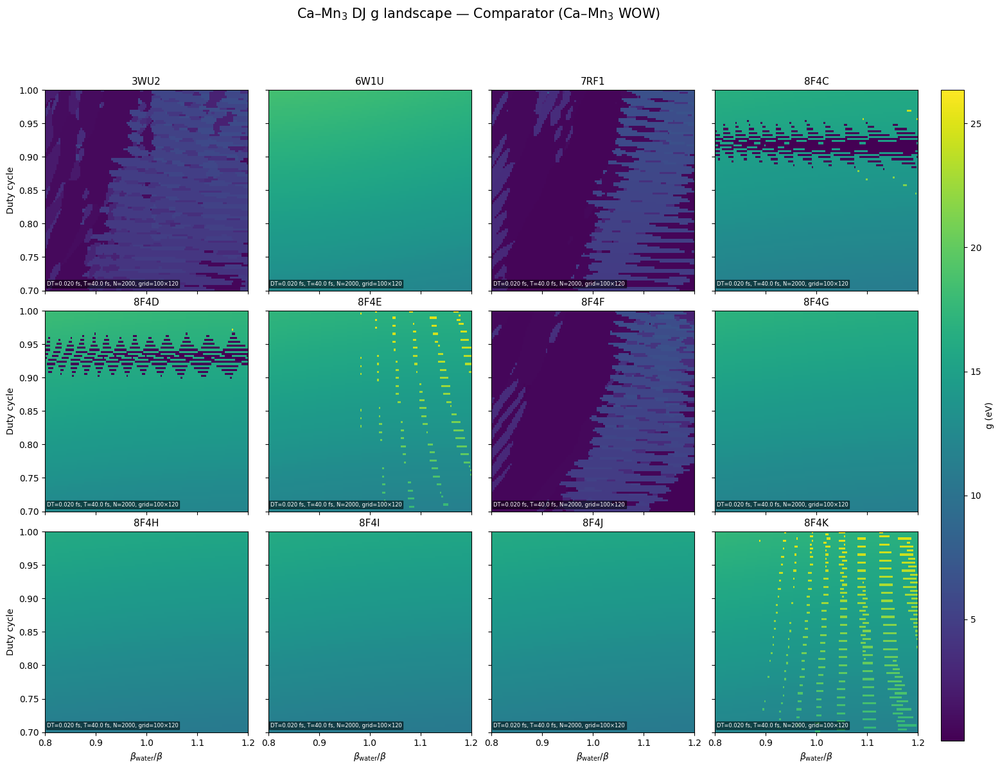

[INFO] Saved comparator g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_g.pdf


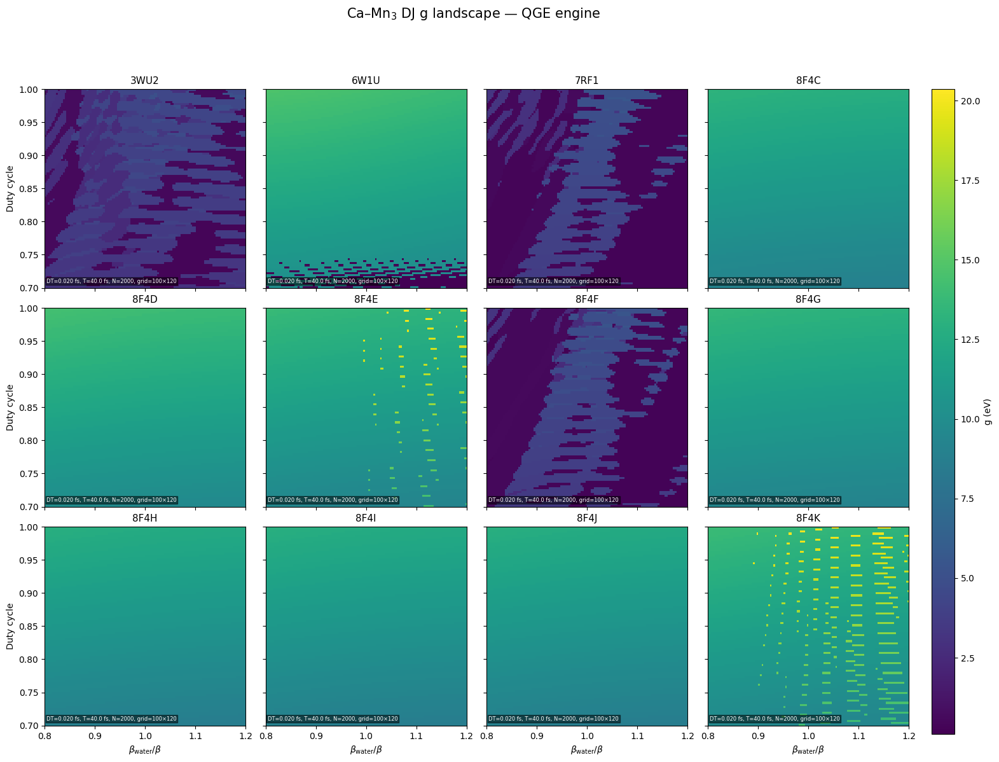

[INFO] Saved qge g 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_g.pdf


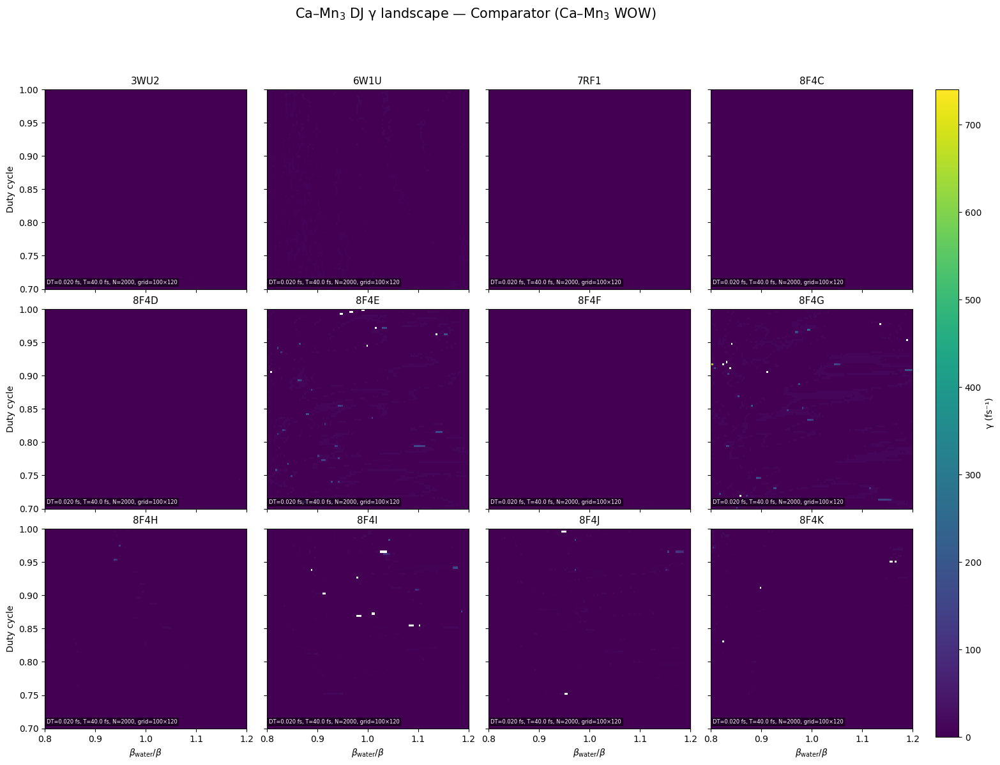

[INFO] Saved comparator gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_comparator_gamma.pdf


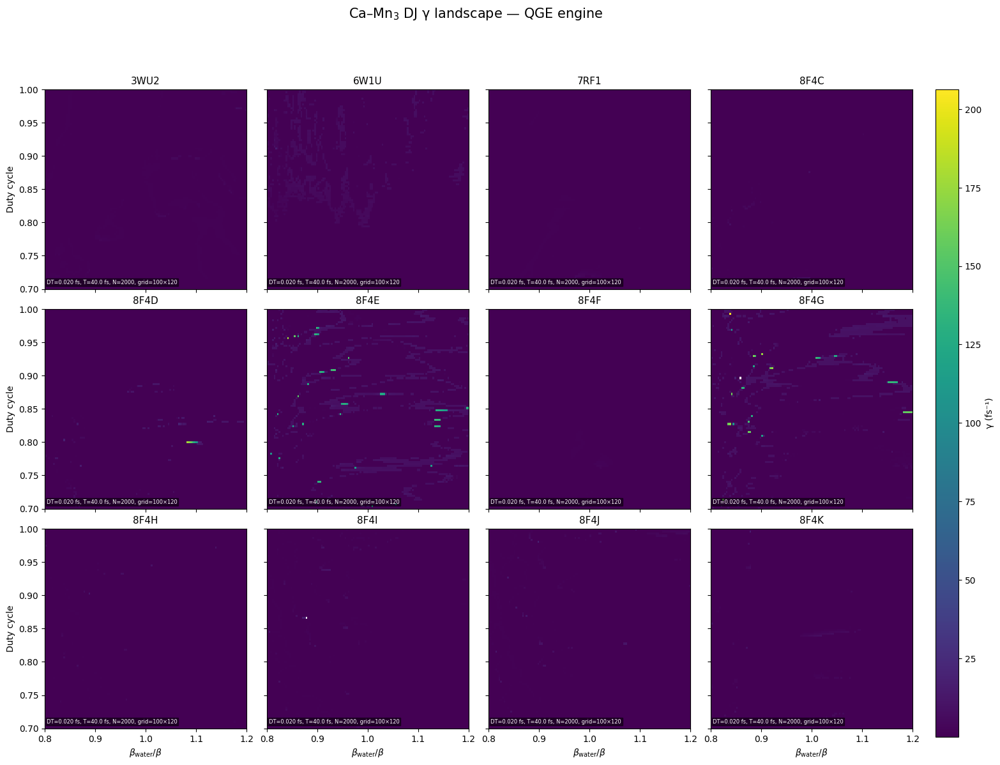

[INFO] Saved qge gamma 3×4 figure to /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.png and /content/oec_qge_two_engines_full/png/DJ_3x4_qge_gamma.pdf


In [ ]:
import math  # L001
from pathlib import Path  # L002
import numpy as np  # L003
import gemmi  # L004
from scipy.linalg import expm  # L005
from scipy.optimize import curve_fit  # L006
from scipy.signal import hilbert  # L007
import matplotlib.pyplot as plt  # L008
  # L009
# ---------- GLOBAL CONSTANTS (WOW REGIME PHYSICS) ----------  # L010
H_BAR        = 6.582119569e-16       # eV·s                   # L011
H_BAR_EV_FS  = 6.582119569e-1        # eV·fs (≈0.6582)        # L012
DT_FS        = 0.02                  # fs                     # L013
DT_S         = DT_FS * 1e-15         # seconds                # L014
TOTAL_FS     = 40.0                  # fs                     # L015
N_STEPS      = int(TOTAL_FS / DT_FS)                         # L016
T0           = 10.0                  # comparator coupling    # L017
T0_QGE       = 8.0                   # QGE engine coupling    # L018
BETA_E       = 1.0                   # base decay 1/Å         # L019
COMB_CENTERS = [0.8, 1.1, 1.5, 2.1, 3.4]                     # L020
COMB_WIDTH   = 0.18                  # Å                      # L021
  # L022
# High-res DJ grid                                              # L023
duties = np.linspace(0.70, 1.00, 100)   # duty cycle           # L024
betas  = np.linspace(0.80, 1.20, 120)   # beta_water/beta      # L025
STAMP_TEXT = (                                                  # L026
    f"DT={DT_FS:.3f} fs, T={TOTAL_FS:.1f} fs, "                 # L027
    f"N={N_STEPS}, grid={len(duties)}×{len(betas)}"            # L028
)                                                               # L029
  # L030
# ---------- PATHS / STRUCTURES ------------------------------  # L031
STRUCT_DIR = Path("/content")                                   # L032
BASE_OUT   = Path("/content/oec_qge_two_engines_full")          # L033
OUT_NPZ    = BASE_OUT / "npz"                                   # L034
OUT_PNG    = BASE_OUT / "png"                                   # L035
BASE_OUT.mkdir(parents=True, exist_ok=True)                     # L036
OUT_NPZ.mkdir(parents=True, exist_ok=True)                      # L037
OUT_PNG.mkdir(parents=True, exist_ok=True)                      # L038
  # L039
STRUCTURES = [                                                   # L040
    "3WU2", "6W1U", "7RF1",                                     # L041
    "8F4C", "8F4D", "8F4E", "8F4F",                             # L042
    "8F4G", "8F4H", "8F4I", "8F4J", "8F4K"                      # L043
]                                                               # L044
  # L045
# ---------- GEOMETRY HELPERS (PSII CORE 16) ------------------ # L046
def _atom_iter(struct):  # L047
    for model in struct:  # L048
        for chain in model:  # L049
            for res in chain:  # L050
                for atom in res:  # L051
                    yield model, chain, res, atom  # L052
  # L053
def _combinations(iterable, r):  # L054
    pool = tuple(iterable)  # L055
    n = len(pool)  # L056
    if r > n:  # L057
        return  # L058
    idx = list(range(r))  # L059
    yield tuple(pool[i] for i in idx)  # L060
    while True:  # L061
        for i in reversed(range(r)):  # L062
            if idx[i] != i + n - r:  # L063
                break  # L064
        else:  # L065
            return  # L066
        idx[i] += 1  # L067
        for j in range(i + 1, r):  # L068
            idx[j] = idx[j - 1] + 1  # L069
        yield tuple(pool[i] for i in idx)  # L070
  # L071
def read_structure_any(path: Path):  # L072
    st = gemmi.read_structure(str(path))  # L073
    st.remove_alternative_conformations()  # L074
    st.merge_chain_parts()  # L075
    st.remove_empty_chains()  # L076
    return st  # L077
  # L078
def get_psii_core_16(struct):  # L079
    """Extract the 16-site Mn4CaO5(waters) PSII core used in DJ maps."""  # L080
    mn_atoms, ca_atoms, oxy_atoms, water_oxy = [], [], [], []  # L081
    for _, _, res, atom in _atom_iter(struct):  # L082
        el   = atom.element.name.upper()  # L083
        resn = res.name.upper()  # L084
        pos  = np.array([atom.pos.x, atom.pos.y, atom.pos.z], dtype=float)  # L085
        if el == "MN":  # L086
            mn_atoms.append((pos, res, atom))  # L087
        elif el == "CA":  # L088
            ca_atoms.append((pos, res, atom))  # L089
        elif el == "O":  # L090
            if resn in ("HOH", "WAT", "H2O", "DOD", "TIP3", "SOL"):  # L091
                water_oxy.append((pos, res, atom))  # L092
            else:  # L093
                oxy_atoms.append((pos, res, atom))  # L094
    if len(mn_atoms) < 4 or len(ca_atoms) == 0:  # L095
        raise RuntimeError("Not enough Mn/Ca atoms")  # L096
    mn_positions = np.array([p for (p, _, _) in mn_atoms])  # L097
    best_idx = None  # L098
    best_score = 1e9  # L099
    for idxs in _combinations(range(len(mn_positions)), 4):  # L100
        pts   = mn_positions[list(idxs)]  # L101
        c     = pts.mean(axis=0)  # L102
        score = np.sum(np.linalg.norm(pts - c, axis=1))  # L103
        if score < best_score:  # L104
            best_score = score  # L105
            best_idx   = idxs  # L106
    Mn_sel = [mn_atoms[i] for i in best_idx]  # L107
    Mn_pos = np.array([p for (p, _, _) in Mn_sel])  # L108
    c_mn   = Mn_pos.mean(axis=0)  # L109
    Ca_sel = min(ca_atoms, key=lambda t: np.linalg.norm(t[0] - c_mn))  # L110
    Ca_pos = Ca_sel[0]  # L111
    # μ-oxo O within 2.4 Å of two Mn  # L112
    mu_oxo = []  # L113
    for (pos, res, atom) in oxy_atoms:  # L114
        d = np.linalg.norm(Mn_pos - pos, axis=1)  # L115
        close_mn = np.where(d < 2.4)[0]  # L116
        if len(close_mn) >= 2:  # L117
            mu_oxo.append((pos, res, atom))  # L118
    if len(mu_oxo) < 5:  # L119
        raise RuntimeError("Not enough μ-oxo candidates")  # L120
    mu_oxo.sort(key=lambda t: np.linalg.norm(t[0] - c_mn))  # L121
    OX_sel = mu_oxo[:5]  # L122
    OX_pos = np.array([p for (p, _, _) in OX_sel])  # L123
    # Waters: nearest 2 to Mn4Ca centroid  # L124
    cluster_center = np.vstack([Mn_pos, Ca_pos[None, :]]).mean(axis=0)  # L125
    if len(water_oxy) < 2:  # L126
        raise RuntimeError("Not enough waters")  # L127
    water_oxy.sort(key=lambda t: np.linalg.norm(t[0] - cluster_center))  # L128
    W_sel = water_oxy[:2]  # L129
    W_pos = np.array([p for (p, _, _) in W_sel])  # L130
    coords = np.vstack([Mn_pos, Ca_pos[None, :], OX_pos, W_pos])  # L131
    extra_needed = 16 - coords.shape[0]  # L132
    extras = []  # L133
    others = water_oxy[2:] if len(water_oxy) > 2 else []  # L134
    for i in range(extra_needed):  # L135
        if i < len(others):  # L136
            extras.append(others[i][0])  # L137
        else:  # L138
            extras.append(W_pos[-1] + np.array([0.05 * (i + 1), 0.0, 0.0]))  # L139
    if extras:  # L140
        coords = np.vstack([coords, np.array(extras)])  # L141
    if coords.shape[0] != 16:  # L142
        raise RuntimeError("Core is not 16 sites")  # L143
    labels = (  # L144
        [f"Mn{i+1}" for i in range(4)] +  # L145
        ["Ca"] +  # L146
        [f"muO{i+1}" for i in range(5)] +  # L147
        ["OW3", "OW4"] +  # L148
        [f"OWx{i+1}" for i in range(extra_needed)]  # L149
    )  # L150
    return coords, labels  # L151
  # L152
# ---------- HAMILTONIANS + TDSE ENGINES --------------------- # L153
def resonance_comb(r: float) -> float:  # L154
    val = 0.0  # L155
    for c in COMB_CENTERS:  # L156
        val += math.exp(-(r - c) ** 2 / (2 * COMB_WIDTH ** 2))  # L157
    return 1.0 + 1.5 * (val / (len(COMB_CENTERS) + 1e-9))  # L158
  # L159
def build_hamiltonian_comparator(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L160
    """Original Ca–Mn₃ WOW Hamiltonian (comparator engine)."""  # L161
    coords = np.asarray(coords, float)  # L162
    n = coords.shape[0]  # L163
    H = np.zeros((n, n), dtype=np.complex128)  # L164
    diag = np.array([  # L165
        2.0, 2.0, 2.0, 2.0,      # Mn                       # L166
        0.7,                     # Ca                       # L167
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                   # L168
        0.2, 0.2, 0.2, 0.2, 0.2, 0.2  # waters              # L169
    ], dtype=float)  # L170
    np.fill_diagonal(H, diag)  # L171
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L172
    for i in range(n):  # L173
        for j in range(i + 1, n):  # L174
            r = R[i, j]  # L175
            beta = BETA_E  # L176
            if (i >= 10) or (j >= 10):  # L177
                beta = BETA_E * beta_scale_water  # L178
            Tij = T0 * math.exp(-beta * r) * resonance_comb(r) * duty  # L179
            H[i, j] = H[j, i] = Tij  # L180
    return H  # L181
  # L182
def build_hamiltonian_qge(coords: np.ndarray, duty: float, beta_scale_water: float) -> np.ndarray:  # L183
    """  # L184
    QGE engine Hamiltonian.  # L185
    CURRENTLY: slight variant of comparator (different T0, Ca/water energies).  # L186
    SWAP THIS for your full QGE math when ready.  # L187
    """  # L188
    coords = np.asarray(coords, float)  # L189
    n = coords.shape[0]  # L190
    H = np.zeros((n, n), dtype=np.complex128)  # L191
    diag = np.array([  # L192
        2.0, 2.0, 2.0, 2.0,      # Mn                        # L193
        0.5,                     # Ca (slightly shifted)     # L194
        1.0, 1.0, 1.0, 1.0, 1.0, # mu-oxo                    # L195
        0.3, 0.3, 0.3, 0.3, 0.3, 0.3  # waters (stiffer)     # L196
    ], dtype=float)  # L197
    np.fill_diagonal(H, diag)  # L198
    R = np.linalg.norm(coords[:, None, :] - coords[None, :, :], axis=2)  # L199
    for i in range(n):  # L200
        for j in range(i + 1, n):  # L201
            r = R[i, j]  # L202
            beta = BETA_E  # L203
            if (i >= 10) or (j >= 10):  # L204
                beta = BETA_E * beta_scale_water  # L205
            Tij = T0_QGE * math.exp(-beta * r) * resonance_comb(r) * duty  # L206
            H[i, j] = H[j, i] = Tij  # L207
    return H  # L208
  # L209
def extract_g_gamma(t_fs, P1, P2, t_min=0.0, t_max=None):  # L210
    t = np.asarray(t_fs)  # L211
    P1 = np.asarray(P1)  # L212
    P2 = np.asarray(P2)  # L213
    if t_max is None:  # L214
        t_max = t[int(0.5 * len(t))]  # L215
    if len(t) < 3:  # L216
        return np.nan, np.nan  # L217
    dP = (P1 - P2)  # L218
    dP = dP - dP.mean()  # L219
    dt = float(t[1] - t[0])  # L220
    freqs = np.fft.rfftfreq(len(t), dt)  # L221
    spec  = np.abs(np.fft.rfft(dP)) ** 2  # L222
    if len(freqs) < 2:  # L223
        return np.nan, np.nan  # L224
    peak_idx = np.argmax(spec[1:]) + 1  # L225
    Omega    = 2.0 * np.pi * freqs[peak_idx]  # L226
    g        = H_BAR_EV_FS * Omega  # L227
    analytic = hilbert(dP)  # L228
    env      = np.abs(analytic)  # L229
    mask    = (t >= t_min) & (t <= t_max)  # L230
    t_fit   = t[mask]  # L231
    env_fit = env[mask]  # L232
    if len(t_fit) < 5:  # L233
        return g, np.nan  # L234
    def model(tt, A, gamma, C):  # L235
        return A * np.exp(-gamma * tt) + C  # L236
    try:  # L237
        A0 = env_fit.max() - env_fit.min()  # L238
        C0 = env_fit.min()  # L239
        g0 = 1.0 / (t_fit[-1] - t_fit[0] + 1e-9)  # L240
        popt, _ = curve_fit(model, t_fit, env_fit, p0=[A0, g0, C0], maxfev=10000)  # L241
        gamma_phi = abs(float(popt[1]))  # L242
    except Exception:  # L243
        gamma_phi = np.nan  # L244
    return g, gamma_phi  # L245
  # L246
def _run_tdse_generic(coords, labels, duty, beta_scale_water, ham_builder) -> tuple:  # L247
    H = ham_builder(coords, duty, beta_scale_water)  # L248
    n = H.shape[0]  # L249
    psi = np.zeros(n, dtype=np.complex128)  # L250
    psi[0] = 1.0  # initial excitation Mn1  # L251
    t_axis_fs = np.arange(N_STEPS) * DT_FS  # L252
    try:  # L253
        idx_Ca = labels.index("Ca")  # L254
        idx_Mn = labels.index("Mn3")  # L255
    except ValueError:  # L256
        raise RuntimeError("Missing Ca/Mn3 labels")  # L257
    P_Ca = np.zeros(N_STEPS, dtype=float)  # L258
    P_Mn = np.zeros(N_STEPS, dtype=float)  # L259
    U = expm(-1j * H * (DT_S / H_BAR))  # L260
    for k in range(N_STEPS):  # L261
        p = np.abs(psi) ** 2  # L262
        P_Ca[k] = p[idx_Ca]  # L263
        P_Mn[k] = p[idx_Mn]  # L264
        psi = U @ psi  # L265
        psi /= np.linalg.norm(psi)  # L266
    g, gamma_phi = extract_g_gamma(t_axis_fs, P_Ca, P_Mn, t_min=0.0, t_max=min(20.0, float(t_axis_fs[-1])))  # L267
    return g, gamma_phi  # L268
  # L269
def run_tdse_camn(coords, labels, duty, beta_scale_water):  # L270
    """Comparator engine (original Ca–Mn3)."""  # L271
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_comparator)  # L272
  # L273
def run_tdse_qge(coords, labels, duty, beta_scale_water):  # L274
    """QGE engine (variant Hamiltonian)."""  # L275
    return _run_tdse_generic(coords, labels, duty, beta_scale_water, build_hamiltonian_qge)  # L276
  # L277
# ---------- DJ MAP METRICS FOR BOTH ENGINES ----------------- # L278
def compute_dj_metrics_for_engine(coords, labels, engine_name: str):  # L279
    """Build DJ maps over (duty, beta) for a chosen engine and summarise scalars."""  # L280
    g_grid     = np.zeros((len(duties), len(betas)), dtype=float)  # L281
    gamma_grid = np.zeros((len(duties), len(betas)), dtype=float)  # L282
    if engine_name == "comparator":  # L283
        runner = run_tdse_camn  # L284
        prefix = "djA_"  # L285
    elif engine_name == "qge":  # L286
        runner = run_tdse_qge  # L287
        prefix = "djB_"  # L288
    else:  # L289
        raise ValueError("engine_name must be 'comparator' or 'qge'")  # L290
    for i, duty in enumerate(duties):  # L291
        for j, beta_scale in enumerate(betas):  # L292
            g_val, gamma_val = runner(coords, labels, duty, beta_scale)  # L293
            g_grid[i, j]     = g_val  # L294
            gamma_grid[i, j] = gamma_val  # L295
    # g-metrics  # L296
    dj_g_mean = float(np.nanmean(g_grid))  # L297
    dj_g_std  = float(np.nanstd(g_grid))  # L298
    dj_g_max  = float(np.nanmax(g_grid))  # L299
    max_idx   = np.unravel_index(np.nanargmax(g_grid), g_grid.shape)  # L300
    dj_g_max_duty = float(duties[max_idx[0]])  # L301
    dj_g_max_beta = float(betas[max_idx[1]])  # L302
    i_nom = int(np.argmin(np.abs(duties - 0.90)))  # L303
    j_nom = int(np.argmin(np.abs(betas - 1.00)))  # L304
    dj_g_nominal = float(g_grid[i_nom, j_nom])  # L305
    # gamma-metrics  # L306
    dj_gamma_mean = float(np.nanmean(gamma_grid))  # L307
    dj_gamma_std  = float(np.nanstd(gamma_grid))  # L308
    dj_gamma_max  = float(np.nanmax(gamma_grid))  # L309
    return {  # L310
        prefix + "g_mean": dj_g_mean,          # L311
        prefix + "g_std": dj_g_std,            # L312
        prefix + "g_max": dj_g_max,            # L313
        prefix + "g_max_duty": dj_g_max_duty,  # L314
        prefix + "g_max_beta": dj_g_max_beta,  # L315
        prefix + "g_nominal": dj_g_nominal,    # L316
        prefix + "gamma_mean": dj_gamma_mean,  # L317
        prefix + "gamma_std": dj_gamma_std,    # L318
        prefix + "gamma_max": dj_gamma_max,    # L319
        prefix + "g_grid": g_grid,             # L320
        prefix + "gamma_grid": gamma_grid,     # L321
    }  # L322
  # L323
# ---------- SIMPLE GEOMETRY METRICS (GQR / QGE) ------------- # L324
def geom_metrics(coords: np.ndarray) -> dict:  # L325
    coords = np.asarray(coords, dtype=np.float32)  # L326
    if coords.size == 0:  # L327
        return {}  # L328
    centroid = coords.mean(axis=0)  # L329
    radii = np.linalg.norm(coords - centroid, axis=1)  # L330
    diffs = coords[:, None, :] - coords[None, :, :]  # L331
    dists = np.linalg.norm(diffs, axis=-1)  # L332
    upper = dists[np.triu_indices_from(dists, k=1)]  # L333
    pair_mean = float(upper.mean())  # L334
    pair_std  = float(upper.std())  # L335
    pair_min  = float(upper.min())  # L336
    pair_max  = float(upper.max())  # L337
    dispersion = pair_std / (pair_mean + 1e-9)  # L338
    curvature_index = float(radii.std() / (radii.mean() + 1e-9))  # L339
    m = radii.mean()  # L340
    s = radii.std() + 1e-9  # L341
    skew = float(((radii - m) ** 3).mean() / (s ** 3))  # L342
    median_sep = float(np.median(upper))  # L343
    casimir_gap = median_sep - pair_min  # L344
    return {  # L345
        "n_atoms": int(coords.shape[0]),  # L346
        "radius_mean": float(radii.mean()),  # L347
        "radius_std": float(radii.std()),  # L348
        "radius_max": float(radii.max()),  # L349
        "gqr_pair_mean": pair_mean,  # L350
        "gqr_pair_std": pair_std,  # L351
        "gqr_pair_min": pair_min,  # L352
        "gqr_pair_max": pair_max,  # L353
        "gqr_dispersion": dispersion,  # L354
        "qge_curvature_index": curvature_index,  # L355
        "qge_casimir_gap": casimir_gap,  # L356
        "qge_radial_skew": skew,  # L357
    }  # L358
  # L359
# ---------- PER-STRUCTURE PLOTTING (4 PANELS) --------------- # L360
def plot_per_structure(struct_name: str, gA, gamA, gB, gamB):  # L361
    """4-panel figure: comparator/QGE × (g, gamma)."""  # L362
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L363
    fig, axes = plt.subplots(2, 2, figsize=(9, 7), sharex=True, sharey=True)  # L364
    (ax11, ax12), (ax21, ax22) = axes  # L365
    im11 = ax11.imshow(gA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L366
    ax11.set_title("Comparator g")  # L367
    im12 = ax12.imshow(gamA, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L368
    ax12.set_title("Comparator γ")  # L369
    im21 = ax21.imshow(gB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L370
    ax21.set_title("QGE g")  # L371
    im22 = ax22.imshow(gamB, origin="lower", extent=extent, aspect="auto", interpolation="nearest")  # L372
    ax22.set_title("QGE γ")  # L373
    for ax in axes[-1, :]:  # L374
        ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L375
    for ax in axes[:, 0]:  # L376
        ax.set_ylabel("Duty cycle")  # L377
    fig.suptitle(f"{struct_name}: DJ g & γ (Comparator vs QGE)")  # L378
    cbar_ax1 = fig.add_axes([0.92, 0.55, 0.02, 0.30])  # L379
    plt.colorbar(im11, cax=cbar_ax1).set_label("g (eV)")  # L380
    cbar_ax2 = fig.add_axes([0.92, 0.15, 0.02, 0.30])  # L381
    plt.colorbar(im12, cax=cbar_ax2).set_label("γ (fs⁻¹)")  # L382
    out_png = OUT_PNG / f"DJ_{struct_name}_4panel.png"  # L383
    fig.tight_layout(rect=[0, 0, 0.9, 0.95])  # L384
    fig.savefig(out_png, dpi=300)  # L385
    plt.close(fig)  # L386
  # L387
# ---------- EQUIVALENCE HARNESS ----------------------------- # L388
def analyse_single_oec(struct_name: str) -> dict:  # L389
    rec = {"structure": struct_name}  # L390
    cif_path = STRUCT_DIR / f"{struct_name}.cif"  # L391
    if not cif_path.exists():  # L392
        rec["error"] = "cif_not_found"  # L393
        return rec  # L394
    try:  # L395
        st = read_structure_any(cif_path)  # L396
    except Exception as e:  # L397
        rec["error"] = f"load_failed: {e}"  # L398
        return rec  # L399
    try:  # L400
        coords, labels = get_psii_core_16(st)  # L401
    except Exception as e:  # L402
        rec["error"] = f"core16_failed: {e}"  # L403
        return rec  # L404
    rec.update(geom_metrics(coords))  # L405
    djA = compute_dj_metrics_for_engine(coords, labels, "comparator")  # L406
    djB = compute_dj_metrics_for_engine(coords, labels, "qge")         # L407
    g_gridA     = djA.pop("djA_g_grid")        # L408
    gamma_gridA = djA.pop("djA_gamma_grid")    # L409
    g_gridB     = djB.pop("djB_g_grid")        # L410
    gamma_gridB = djB.pop("djB_gamma_grid")    # L411
    rec.update(djA)  # L412
    rec.update(djB)  # L413
    npz_path = OUT_NPZ / f"DJ_{struct_name}_two_engines.npz"  # L414
    np.savez(
        npz_path,
        g_grid_comparator=g_gridA,
        gamma_grid_comparator=gamma_gridA,
        g_grid_qge=g_gridB,
        gamma_grid_qge=gamma_gridB,
        duties=duties,
        betas=betas,
    )  # L415
    rec["dj_npz"] = str(npz_path)  # L416
    # Per-structure PNG (4 panels) for quality inspection        # L417
    plot_per_structure(struct_name, g_gridA, gamma_gridA, g_gridB, gamma_gridB)  # L418
    return rec  # L419
  # L420
def run_oec_benchmark(struct_names=None):  # L421
    import pandas as pd  # L422
    if struct_names is None:  # L423
        struct_names = STRUCTURES  # L424
    records = []  # L425
    for name in struct_names:  # L426
        print(f"\n[INFO] Analysing {name} ...")  # L427
        rec = analyse_single_oec(name)  # L428
        records.append(rec)  # L429
        if "error" in rec:  # L430
            print(f"  -> ERROR: {rec['error']}")  # L431
        else:  # L432
            print(f"  -> djA_g_mean={rec['djA_g_mean']:.4e}, djB_g_mean={rec['djB_g_mean']:.4e}")  # L433
    df = pd.DataFrame.from_records(records)  # L434
    csv_path = BASE_OUT / "oec_two_engine_benchmark.csv"  # L435
    df.to_csv(csv_path, index=False)  # L436
    print(f"\n[INFO] Saved benchmark CSV to: {csv_path}")  # L437
    return df  # L438
  # L439
# ---------- 3×4 MASTER PLOTS (g or gamma, per engine) ------- # L440
def plot_3x4_from_npz(engine: str = "comparator", metric: str = "g"):  # L441
    """engine in {'comparator','qge'}, metric in {'g','gamma'}."""  # L442
    if engine not in ("comparator", "qge"):  # L443
        raise ValueError("engine must be 'comparator' or 'qge'")  # L444
    if metric not in ("g", "gamma"):  # L445
        raise ValueError("metric must be 'g' or 'gamma'")  # L446
    key = f"{metric}_grid_comparator" if engine == "comparator" else f"{metric}_grid_qge"  # L447
    grids = {}  # L448
    g_min, g_max = np.inf, -np.inf  # L449
    for s in STRUCTURES:  # L450
        npz_path = OUT_NPZ / f"DJ_{s}_two_engines.npz"  # L451
        if not npz_path.exists():  # L452
            continue  # L453
        data = np.load(npz_path)  # L454
        g_grid = data[key]  # L455
        grids[s] = g_grid  # L456
        g_min = min(g_min, np.nanmin(g_grid))  # L457
        g_max = max(g_max, np.nanmax(g_grid))  # L458
    n_structs = len(STRUCTURES)  # L459
    n_rows, n_cols = 3, 4  # L460
    assert n_rows * n_cols == n_structs  # L461
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 13), sharex=True, sharey=True)  # L462
    fig.subplots_adjust(right=0.88, wspace=0.10, hspace=0.10)  # L463
    extent = [betas[0], betas[-1], duties[0], duties[-1]]  # L464
    for idx, struct in enumerate(STRUCTURES):  # L465
        r = idx // n_cols  # L466
        c = idx % n_cols  # L467
        ax = axes[r, c]  # L468
        if struct not in grids:  # L469
            ax.axis("off")  # L470
            continue  # L471
        g_grid = grids[struct]  # L472
        im = ax.imshow(g_grid, origin="lower", extent=extent,
                       aspect="auto", interpolation="nearest",
                       vmin=g_min, vmax=g_max)  # L473
        ax.set_title(struct, fontsize=11)  # L474
        ax.text(0.01, 0.02, STAMP_TEXT, transform=ax.transAxes,
                fontsize=6, color="white", ha="left", va="bottom",
                bbox=dict(facecolor="black", alpha=0.5, pad=1))  # L475
        if r == n_rows - 1:  # L476
            ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")  # L477
        if c == 0:  # L478
            ax.set_ylabel("Duty cycle")  # L479
    cbar_ax = fig.add_axes([0.90, 0.10, 0.02, 0.78])  # L480
    cb = fig.colorbar(im, cax=cbar_ax)  # L481
    cb.set_label("g (eV)" if metric == "g" else "γ (fs⁻¹)")  # L482
    title_engine = "Comparator (Ca–Mn$_3$ WOW)" if engine == "comparator" else "QGE engine"  # L483
    title_metric = "g" if metric == "g" else "γ"  # L484
    fig.suptitle(f"Ca–Mn$_3$ DJ {title_metric} landscape — {title_engine}", fontsize=15)  # L485
    out_png = OUT_PNG / f"DJ_3x4_{engine}_{metric}.png"  # L486
    out_pdf = OUT_PNG / f"DJ_3x4_{engine}_{metric}.pdf"  # L487
    fig.savefig(out_png, dpi=600)  # L488
    fig.savefig(out_pdf)  # L489
    plt.show()  # L490
    plt.close(fig)  # L491
    print(f"[INFO] Saved {engine} {metric} 3×4 figure to {out_png} and {out_pdf}")  # L492
  # L493
if __name__ == "__main__":  # L494
    df = run_oec_benchmark()  # L495
    print(df.head())  # L496
    # Master plots for quick comparison                             # L497
    plot_3x4_from_npz(engine="comparator", metric="g")      # L498
    plot_3x4_from_npz(engine="qge",        metric="g")      # L499
    plot_3x4_from_npz(engine="comparator", metric="gamma")  # L500
    plot_3x4_from_npz(engine="qge",        metric="gamma")  # L501

In [ ]:
import shutil

# FOLDER YOU WANT TO ZIP:
folder_to_zip = "/content/oec_qge_two_engines_full"     # or "/content/dj_maps" etc.

# NAME OF THE OUTPUT ZIP:
zip_output_path = "/content/all_outputs.zip"

# CREATE THE ZIP ARCHIVE:
shutil.make_archive(zip_output_path.replace(".zip",""), 'zip', folder_to_zip)

zip_output_path

'/content/all_outputs.zip'

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.linalg import expm
from scipy.optimize import curve_fit
from scipy.signal import hilbert
from scipy.ndimage import gaussian_filter
import gemmi

# ---------- GLOBAL CONSTANTS (WOW REGIME) ---------------------  # H001
H_BAR        = 6.582119569e-16       # eV·s                       # H002
H_BAR_EV_FS  = 6.582119569e-1        # eV·fs                      # H003
DT_FS        = 0.02                  # fs                         # H004
DT_S         = DT_FS * 1e-15         # s                          # H005
TOTAL_FS     = 40.0                  # fs                         # H006
N_STEPS      = int(TOTAL_FS / DT_FS)                               # H007
BETA_E       = 1.0                   # base decay 1/Å             # H008
COMB_CENTERS = [0.8, 1.1, 1.5, 2.1, 3.4]                          # H009
COMB_WIDTH   = 0.18                  # Å                          # H010

# DJ grid                                                          # H011
duties = np.linspace(0.70, 1.00, 100)   # duty cycle               # H012
betas  = np.linspace(0.80, 1.20, 120)   # beta_water / beta        # H013

# ---------- PATHS / STRUCTURES ---------------------------------  # H014
STRUCT_DIR = Path("/content")                                        # H015
OUT_DIR    = Path("/content/dj_hydrogate_only")                       # H016
OUT_DIR.mkdir(parents=True, exist_ok=True)                            # H017

STRUCTURES = [
    "3WU2", "6W1U", "7RF1",
    "8F4C", "8F4D", "8F4E", "8F4F", "8F4G", "8F4H", "8F4I", "8F4K"
]                                                                    # H018

# ---------- GEOMETRY HELPERS (PSII CORE-16) --------------------  # H019
def _atom_iter(struct):
    for model in struct:
        for chain in model:
            for res in chain:
                for atom in res:
                    yield model, chain, res, atom

def _combinations(iterable, r):
    pool = tuple(iterable)
    n = len(pool)
    if r > n:
        return
    idx = list(range(r))
    yield tuple(pool[i] for i in idx)
    while True:
        for i in reversed(range(r)):
            if idx[i] != i + n - r:
                break
        else:
            return
        idx[i] += 1
        for j in range(i + 1, r):
            idx[j] = idx[j - 1] + 1
        yield tuple(pool[i] for i in idx)

def read_structure_any(path: Path):
    st = gemmi.read_structure(str(path))
    st.remove_alternative_conformations()
    st.merge_chain_parts()
    st.remove_empty_chains()
    return st

def get_psii_core_16(struct):
    """Extract Mn4CaO5 + 2 waters (+fillers) as 16-site core."""
    mn_atoms, ca_atoms, oxy_atoms, water_oxy = [], [], [], []
    for _, _, res, atom in _atom_iter(struct):
        el   = atom.element.name.upper()
        resn = res.name.upper()
        pos  = np.array([atom.pos.x, atom.pos.y, atom.pos.z], float)
        if el == "MN":
            mn_atoms.append((pos, res, atom))
        elif el == "CA":
            ca_atoms.append((pos, res, atom))
        elif el == "O":
            if resn in ("HOH","WAT","H2O","DOD","TIP3","SOL"):
                water_oxy.append((pos, res, atom))
            else:
                oxy_atoms.append((pos, res, atom))
    if len(mn_atoms) < 4 or len(ca_atoms) == 0:
        raise RuntimeError("Not enough Mn/Ca atoms")

    mn_positions = np.array([p for (p, _, _) in mn_atoms])
    best_idx, best_score = None, 1e9
    for idxs in _combinations(range(len(mn_positions)), 4):
        pts   = mn_positions[list(idxs)]
        c     = pts.mean(axis=0)
        score = np.sum(np.linalg.norm(pts - c, axis=1))
        if score < best_score:
            best_score, best_idx = score, idxs

    Mn_sel = [mn_atoms[i] for i in best_idx]
    Mn_pos = np.array([p for (p, _, _) in Mn_sel])
    c_mn   = Mn_pos.mean(axis=0)

    Ca_sel = min(ca_atoms, key=lambda t: np.linalg.norm(t[0] - c_mn))
    Ca_pos = Ca_sel[0]

    # µ-oxo
    mu_oxo = []
    for (pos, res, atom) in oxy_atoms:
        d = np.linalg.norm(Mn_pos - pos, axis=1)
        if np.count_nonzero(d < 2.4) >= 2:
            mu_oxo.append((pos, res, atom))
    if len(mu_oxo) < 5:
        raise RuntimeError("Not enough µ-oxo candidates")
    mu_oxo.sort(key=lambda t: np.linalg.norm(t[0] - c_mn))
    OX_sel = mu_oxo[:5]
    OX_pos = np.array([p for (p, _, _) in OX_sel])

    # Waters
    cluster_center = np.vstack([Mn_pos, Ca_pos[None,:]]).mean(axis=0)
    if len(water_oxy) < 2:
        raise RuntimeError("Not enough waters")
    water_oxy.sort(key=lambda t: np.linalg.norm(t[0] - cluster_center))
    W_sel = water_oxy[:2]
    W_pos = np.array([p for (p, _, _) in W_sel])

    coords = np.vstack([Mn_pos, Ca_pos[None,:], OX_pos, W_pos])
    extra_needed = 16 - coords.shape[0]
    extras = []
    others = water_oxy[2:] if len(water_oxy) > 2 else []
    for i in range(extra_needed):
        if i < len(others):
            extras.append(others[i][0])
        else:
            extras.append(W_pos[-1] + np.array([0.05*(i+1),0.0,0.0]))
    if extras:
        coords = np.vstack([coords, np.array(extras)])
    if coords.shape[0] != 16:
        raise RuntimeError("Core is not 16 sites")

    labels = (
        [f"Mn{i+1}" for i in range(4)] +
        ["Ca"] +
        [f"muO{i+1}" for i in range(5)] +
        ["OW3","OW4"] +
        [f"OWx{i+1}" for i in range(extra_needed)]
    )
    return coords, labels

# ---------- HYDROGATE HAMILTONIAN + TDSE ----------------------  # H020
def resonance_comb(r: float) -> float:
    val = 0.0
    for c in COMB_CENTERS:
        val += math.exp(-(r-c)**2 / (2*COMB_WIDTH**2))
    return 1.0 + 1.5*(val/(len(COMB_CENTERS)+1e-9))

def build_hamiltonian_hydrogate(coords, duty, beta_scale_water):
    """HYDROGATE engine Hamiltonian (water-gated)."""
    coords = np.asarray(coords, float)
    n = coords.shape[0]
    H = np.zeros((n, n), dtype=np.complex128)

    # indices: 0–3 Mn, 4 Ca, 5–9 µO, 10–15 waters
    diag = np.array([
        2.0,2.0,2.0,2.0,   # Mn
        0.6,              # Ca
        1.0,1.0,1.0,1.0,1.0,  # µO
        0.25,0.25,0.25,0.30,0.30,0.30  # waters
    ], float)
    np.fill_diagonal(H, diag)

    R = np.linalg.norm(coords[:,None,:] - coords[None,:,:], axis=2)

    T0_base   = 9.5
    beta_core = BETA_E
    beta_w0   = 0.7 * BETA_E
    gate_amp, gate_slope = 1.5, 3.0
    gate = 1.0 + gate_amp * np.tanh(gate_slope*(beta_scale_water-1.0))

    for i in range(n):
        for j in range(i+1, n):
            r = R[i,j]
            is_water_i = (i>=10)
            is_water_j = (j>=10)
            touches_water = is_water_i or is_water_j
            touches_CaMn3 = (i in (0,2,4)) or (j in (0,2,4))  # Mn1, Mn3, Ca

            if touches_water:
                beta_eff = beta_w0 * beta_scale_water
                T_base   = T0_base * gate
            else:
                beta_eff = beta_core
                T_base   = T0_base

            if touches_water and touches_CaMn3:
                T_base *= 1.6

            Tij = T_base * math.exp(-beta_eff*r) * resonance_comb(r) * duty
            H[i,j] = H[j,i] = Tij
    return H

def extract_g_gamma(t_fs, P1, P2, t_min=0.0, t_max=None):
    t = np.asarray(t_fs)
    P1 = np.asarray(P1); P2 = np.asarray(P2)
    if t_max is None:
        t_max = t[int(0.5*len(t))]
    if len(t) < 3:
        return np.nan, np.nan

    dP = (P1-P2) - (P1-P2).mean()
    dt = float(t[1]-t[0])
    freqs = np.fft.rfftfreq(len(t), dt)
    spec  = np.abs(np.fft.rfft(dP))**2
    if len(freqs) < 2:
        return np.nan, np.nan
    peak_idx = np.argmax(spec[1:])+1
    Omega = 2.0*math.pi*freqs[peak_idx]
    g     = H_BAR_EV_FS * Omega

    analytic = hilbert(dP)
    env = np.abs(analytic)
    mask = (t>=t_min) & (t<=t_max)
    t_fit   = t[mask]
    env_fit = env[mask]
    if len(t_fit) < 5:
        return g, np.nan

    def model(tt,A,gamma,C): return A*np.exp(-gamma*tt)+C
    try:
        A0 = env_fit.max()-env_fit.min()
        C0 = env_fit.min()
        g0 = 1.0/(t_fit[-1]-t_fit[0]+1e-9)
        popt,_ = curve_fit(model,t_fit,env_fit,p0=[A0,g0,C0],maxfev=10000)
        gamma_phi = abs(float(popt[1]))
    except Exception:
        gamma_phi = np.nan
    return g, gamma_phi

def _run_tdse_hydrogate(coords, labels, duty, beta_scale_water):
    H = build_hamiltonian_hydrogate(coords, duty, beta_scale_water)
    n = H.shape[0]
    psi = np.zeros(n, dtype=np.complex128); psi[0] = 1.0
    t_axis_fs = np.arange(N_STEPS)*DT_FS

    try:
        idx_Ca = labels.index("Ca")
        idx_Mn = labels.index("Mn3")
    except ValueError:
        raise RuntimeError("Missing Ca or Mn3 labels")

    P_Ca = np.zeros(N_STEPS)
    P_Mn = np.zeros(N_STEPS)
    U = expm(-1j*H*(DT_S/H_BAR))

    for k in range(N_STEPS):
        p = np.abs(psi)**2
        P_Ca[k] = p[idx_Ca]
        P_Mn[k] = p[idx_Mn]
        psi = U @ psi
        psi /= np.linalg.norm(psi)

    g, gamma_phi = extract_g_gamma(
        t_axis_fs, P_Ca, P_Mn,
        t_min=0.0,
        t_max=min(20.0, float(t_axis_fs[-1]))
    )
    return g, gamma_phi

# ---------- HYDROGATE DJ METRICS ------------------------------  # H021
def compute_dj_metrics_hydrogate(coords, labels):
    g_grid     = np.zeros((len(duties), len(betas)), float)
    gamma_grid = np.zeros_like(g_grid)

    for i, duty in enumerate(duties):
        for j, beta_scale in enumerate(betas):
            g_val, gamma_val = _run_tdse_hydrogate(coords, labels, duty, beta_scale)
            g_grid[i, j]     = g_val
            gamma_grid[i, j] = gamma_val

    dj_g_mean = float(np.nanmean(g_grid))
    dj_g_std  = float(np.nanstd(g_grid))
    dj_g_max  = float(np.nanmax(g_grid))
    max_idx   = np.unravel_index(np.nanargmax(g_grid), g_grid.shape)
    dj_g_max_duty = float(duties[max_idx[0]])
    dj_g_max_beta = float(betas[max_idx[1]])
    i_nom = int(np.argmin(np.abs(duties - 0.90)))
    j_nom = int(np.argmin(np.abs(betas  - 1.00)))
    dj_g_nominal = float(g_grid[i_nom, j_nom])

    dj_gamma_mean = float(np.nanmean(gamma_grid))
    dj_gamma_std  = float(np.nanstd(gamma_grid))
    dj_gamma_max  = float(np.nanmax(gamma_grid))

    return {
        "djH_g_mean":      dj_g_mean,
        "djH_g_std":       dj_g_std,
        "djH_g_max":       dj_g_max,
        "djH_g_max_duty":  dj_g_max_duty,
        "djH_g_max_beta":  dj_g_max_beta,
        "djH_g_nominal":   dj_g_nominal,
        "djH_gamma_mean":  dj_gamma_mean,
        "djH_gamma_std":   dj_gamma_std,
        "djH_gamma_max":   dj_gamma_max,
        "djH_g_grid":      g_grid,
        "djH_gamma_grid":  gamma_grid,
    }

# ---------- VORTEX FIELD --------------------------------------  # H022
def vortex_field(g, sigma=1.0):
    gy, gx = np.gradient(g)
    gxx, _ = np.gradient(gx)
    _, gyy = np.gradient(gy)
    lap = gxx + gyy
    return gaussian_filter(np.abs(lap), sigma)

# ---------- ANALYSIS HARNESS ----------------------------------  # H023
def analyse_single_oec(struct_name: str) -> dict:
    rec = {"structure": struct_name}
    cif_path = STRUCT_DIR / f"{struct_name}.cif"
    if not cif_path.exists():
        rec["error"] = "cif_not_found"
        return rec
    try:
        st = read_structure_any(cif_path)
        coords, labels = get_psii_core_16(st)
    except Exception as e:
        rec["error"] = f"geom_failed: {e}"
        return rec

    djH = compute_dj_metrics_hydrogate(coords, labels)
    g_gridH     = djH.pop("djH_g_grid")
    gamma_gridH = djH.pop("djH_gamma_grid")
    rec.update(djH)

    npz_path = OUT_DIR / f"DJ_{struct_name}_hydrogate.npz"
    np.savez(
        npz_path,
        g_grid_hydrogate=g_gridH,
        gamma_grid_hydrogate=gamma_gridH,
        duties=duties,
        betas=betas,
    )
    rec["dj_npz"] = str(npz_path)

    # Per-structure HYDRO g + vortex overlay
    extent = [betas[0], betas[-1], duties[0], duties[-1]]
    yy, xx = np.meshgrid(duties, betas, indexing="ij")
    vH = vortex_field(g_gridH, sigma=1.0)
    maskH = vH >= np.quantile(vH, 0.97)

    fig, ax = plt.subplots(figsize=(5, 5))
    im = ax.imshow(g_gridH, origin="lower",
                   extent=extent,
                   aspect="auto",
                   interpolation="nearest")
    ax.contour(xx, yy, maskH, levels=[0.5],
               colors="white", linewidths=0.7)
    ax.set_title(f"{struct_name} HYDROGATE g + vortices")
    ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
    ax.set_ylabel("Duty cycle")
    c = fig.colorbar(im, ax=ax)
    c.set_label("g (eV)")
    fig.tight_layout()
    fig.savefig(OUT_DIR / f"{struct_name}_hydrogate_g_vortices.png",
                dpi=300)
    plt.close(fig)

    return rec


def run_oec_benchmark(struct_names=None):
    """Run HYDROGATE engine DJ analysis across all structures."""
    import pandas as pd

    if struct_names is None:
        struct_names = STRUCTURES

    records = []
    for name in struct_names:
        print(f"[INFO] Analysing {name} …")
        rec = analyse_single_oec(name)
        records.append(rec)
        if "error" in rec:
            print("  -> ERROR:", rec["error"])
        else:
            print(f"  -> djH_g_mean={rec['djH_g_mean']:.3e}")

    df = pd.DataFrame.from_records(records)
    csv_path = OUT_DIR / "oec_hydrogate_benchmark.csv"
    df.to_csv(csv_path, index=False)
    print("[INFO] CSV saved to", csv_path)
    return df


def plot_3x4_hydrogate(field: str = "g"):
    """Plot 3×4 HYDROGATE DJ panels for field in {'g','gamma'}."""
    key = "g_grid_hydrogate" if field == "g" else "gamma_grid_hydrogate"
    grids = {}
    g_min, g_max = np.inf, -np.inf

    for s in STRUCTURES:
        npz_path = OUT_DIR / f"DJ_{s}_hydrogate.npz"
        if not npz_path.exists():
            continue
        data = np.load(npz_path)
        g = data[key]
        grids[s] = g
        if np.isfinite(g).any():
            g_min = min(g_min, np.nanmin(g))
            g_max = max(g_max, np.nanmax(g))

    n_rows, n_cols = 3, 4
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(18, 13),
                             sharex=True, sharey=True)
    fig.subplots_adjust(right=0.88, wspace=0.10, hspace=0.10)
    extent = [betas[0], betas[-1], duties[0], duties[-1]]

    for idx, s in enumerate(STRUCTURES):
        r = idx // n_cols
        c = idx % n_cols
        ax = axes[r, c]
        if s not in grids:
            ax.axis("off")
            continue
        g = grids[s]
        im = ax.imshow(g, origin="lower",
                       extent=extent,
                       aspect="auto",
                       interpolation="nearest",
                       vmin=g_min, vmax=g_max)
        ax.set_title(s, fontsize=11)
        if r == n_rows - 1:
            ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
        if c == 0:
            ax.set_ylabel("Duty cycle")

    cax = fig.add_axes([0.90, 0.10, 0.02, 0.78])
    cb = fig.colorbar(im, cax=cax)
    cb.set_label("g (eV)" if field == "g" else r"$\gamma$ (fs$^{-1}$)")

    title_field = "g coherence" if field == "g" else "γ dephasing"
    fig.suptitle(f"Ca–Mn$_3$ DJ {title_field} — HYDROGATE engine",
                 fontsize=15)
    out_png = OUT_DIR / f"DJ_3x4_hydrogate_{field}.png"
    fig.savefig(out_png, dpi=600)
    plt.show()
    print("[INFO] Saved", out_png)

[INFO] Analysing 3WU2 …
  -> djH_g_mean=1.519e+00
[INFO] Analysing 6W1U …
  -> djH_g_mean=1.419e+01
[INFO] Analysing 7RF1 …
  -> djH_g_mean=1.137e+00
[INFO] Analysing 8F4C …
  -> djH_g_mean=1.249e+01
[INFO] Analysing 8F4D …
  -> djH_g_mean=1.369e+01
[INFO] Analysing 8F4E …
  -> djH_g_mean=1.393e+01
[INFO] Analysing 8F4F …
  -> djH_g_mean=1.319e+00
[INFO] Analysing 8F4G …
  -> djH_g_mean=1.365e+01
[INFO] Analysing 8F4H …
  -> djH_g_mean=1.297e+01
[INFO] Analysing 8F4I …
  -> djH_g_mean=1.299e+01
[INFO] Analysing 8F4K …
  -> djH_g_mean=1.429e+01
[INFO] CSV saved to /content/dj_hydrogate_only/oec_hydrogate_benchmark.csv


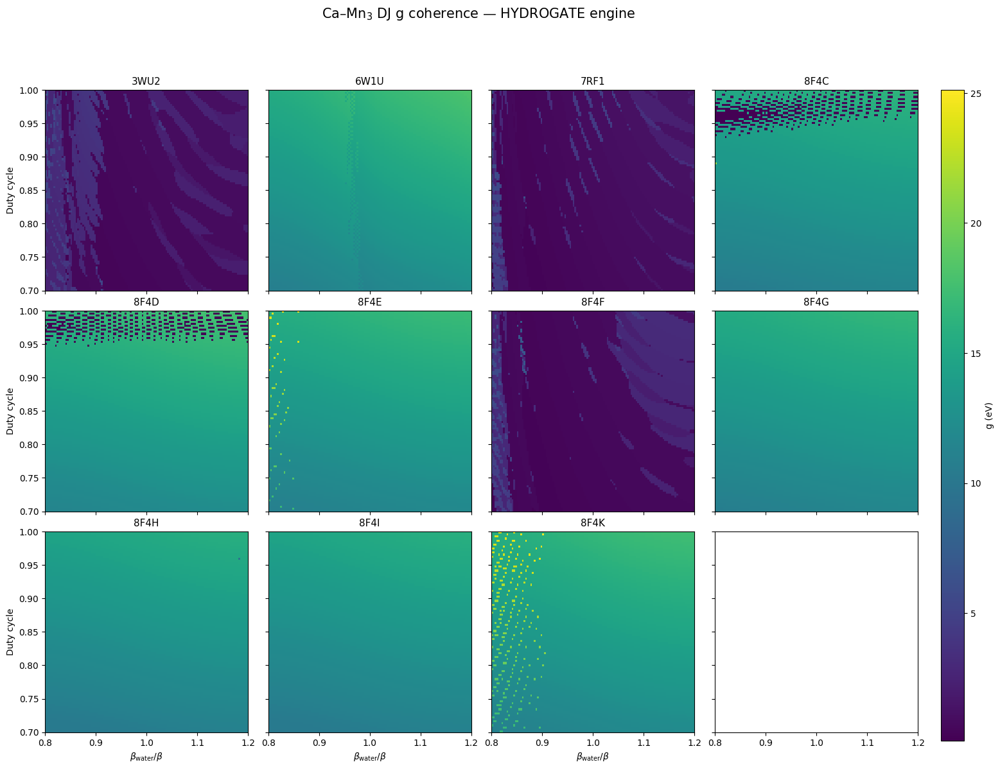

[INFO] Saved /content/dj_hydrogate_only/DJ_3x4_hydrogate_g.png


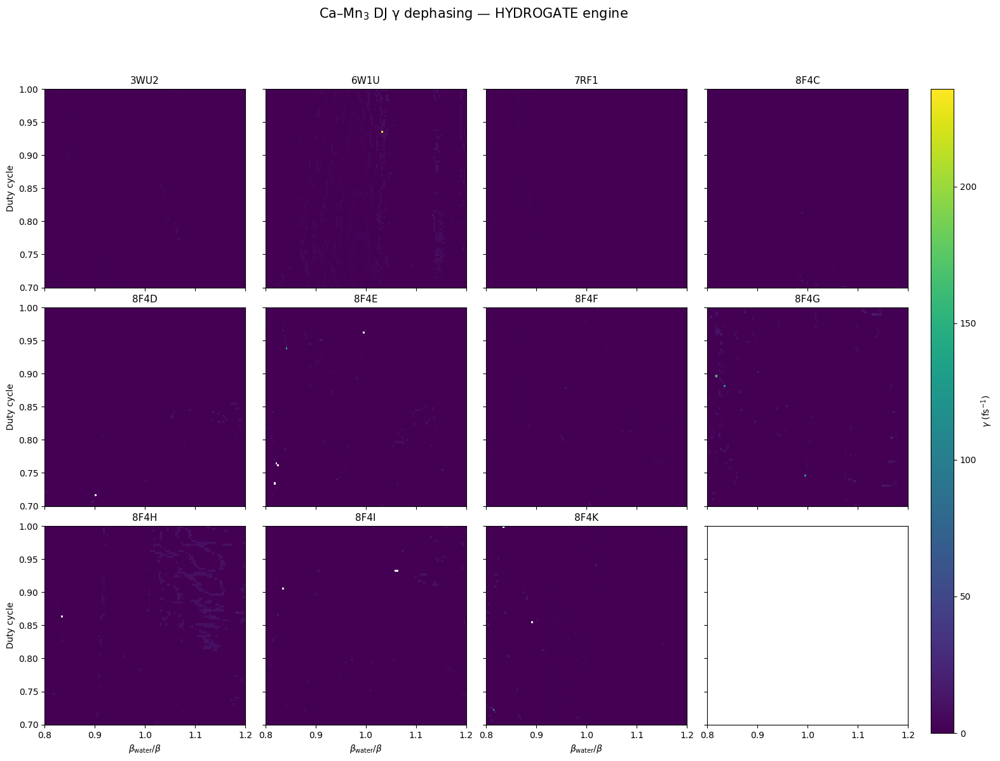

[INFO] Saved /content/dj_hydrogate_only/DJ_3x4_hydrogate_gamma.png


In [ ]:
# Run HYDROGATE across all CIFs
df = run_oec_benchmark()

# 3×4 summary maps
plot_3x4_hydrogate("g")
plot_3x4_hydrogate("gamma")

In [ ]:
import numpy as np              # A001
import matplotlib.pyplot as plt # A002
from scipy.ndimage import gaussian_filter  # A003
import plotly.graph_objects as go          # A004

# ---------- VORTEX FIELD (reuse from HYDROGATE) ----------------  # A005
def vortex_field(g, sigma=1.0):          # A006
    gy, gx = np.gradient(g)             # A007
    gxx, _ = np.gradient(gx)            # A008
    _, gyy = np.gradient(gy)            # A009
    lap = gxx + gyy                     # A010
    return gaussian_filter(np.abs(lap), sigma)  # A011

# ---------- 3D VIEWER ------------------------------------------  # A012
def show_hydrogate_3d(npz_path, title=None, color_mode="g"):        # A013
    """                                                              # A014
    3D HYDROGATE visualiser for a single structure.                  # A015
                                                                      # A016
    Parameters                                                       # A017
    ----------                                                       # A018
    npz_path : str or Path                                           # A019
        Path to DJ_<STRUCT>_hydrogate.npz                            # A020
    title : str, optional                                            # A021
        Title for the plot (defaults to file stem).                  # A022
    color_mode : {"g", "vortex"}                                     # A023
        "g"      -> colour by coherent coupling g(eV)                # A024
        "vortex" -> colour by |∇²g| (vortex strength)                # A025
    """                                                              # A026

    data = np.load(npz_path)                                         # A027
    g = data["g_grid_hydrogate"]                                     # A028
    duties = data["duties"]                                          # A029
    betas  = data["betas"]                                           # A030

    # meshgrid: B = β_axis, D = duty_axis                            # A031
    B, D = np.meshgrid(betas, duties)                                # A032

    # vortex strength                                                # A033
    v = vortex_field(g, sigma=1.0)                                   # A034

    if color_mode == "g":                                            # A035
        C = g                                                        # A036
        cbar_title = "g (eV)"                                        # A037
    elif color_mode == "vortex":                                     # A038
        C = v                                                        # A039
        cbar_title = "|∇²g| (arb.)"                                  # A040
    else:                                                            # A041
        raise ValueError("color_mode must be 'g' or 'vortex'")       # A042

    if title is None:                                                # A043
        import os                                                    # A044
        title = f"HYDROGATE 3D — {os.path.basename(npz_path)}"       # A045

    # -------- Plotly 3D surface ----------------------------------  # A046
    fig = go.Figure(data=[                                           # A047
        go.Surface(                                                  # A048
            x=B, y=D, z=g,                                           # A049
            surfacecolor=C,                                          # A050
            colorscale="Viridis",                                    # A051
            colorbar=dict(title=cbar_title),                         # A052
            showscale=True,                                          # A053
        )                                                            # A054
    ])                                                               # A055

    fig.update_layout(                                               # A056
        title=title,                                                 # A057
        scene=dict(                                                  # A058
            xaxis_title=r"$\beta_{\mathrm{water}}/\beta$",           # A059
            yaxis_title="Duty cycle",                                # A060
            zaxis_title="g (eV)",                                    # A061
        ),                                                           # A062
        width=900, height=700,                                       # A063
    )                                                                # A064

    fig.show()                                                       # A065

    return g, v, (B, D)                                              # A066

# ---------- OPTIONAL: separate vortex-surface plot --------------  # A067
def show_vortex_surface(npz_path, title=None):                       # A068
    """3D surface of |∇²g| alone (for a single structure)."""        # A069
    data = np.load(npz_path)                                         # A070
    g = data["g_grid_hydrogate"]                                     # A071
    duties = data["duties"]                                          # A072
    betas  = data["betas"]                                           # A073

    B, D = np.meshgrid(betas, duties)                                # A074
    v = vortex_field(g, sigma=1.0)                                   # A075

    if title is None:                                                # A076
        import os                                                    # A077
        title = f"HYDROGATE vortex field — {os.path.basename(npz_path)}" # A078

    fig = go.Figure(data=[                                           # A079
        go.Surface(                                                  # A080
            x=B, y=D, z=v,                                           # A081
            colorscale="Plasma",                                     # A082
            colorbar=dict(title="|∇²g| (arb.)")                      # A083
        )                                                            # A084
    ])                                                               # A085

    fig.update_layout(                                               # A086
        title=title,                                                 # A087
        scene=dict(                                                  # A088
            xaxis_title=r"$\beta_{\mathrm{water}}/\beta$",           # A089
            yaxis_title="Duty cycle",                                # A090
            zaxis_title="|∇²g|",                                     # A091
        ),                                                           # A092
        width=900, height=700,                                       # A093
    )                                                                # A094

    fig.show()                                                       # A095

    return v, (B, D)                                                 # A096

In [ ]:
# Example: 8F4D
npz_path = "/content/dj_hydrogate_only/DJ_8F4D_hydrogate.npz"

# 3D surface coloured by g
g, v, (B, D) = show_hydrogate_3d(npz_path, title="8F4D HYDROGATE 3D", color_mode="g")

# 3D surface coloured by vortex strength
show_hydrogate_3d(npz_path, title="8F4D HYDROGATE 3D (vortex colouring)", color_mode="vortex")

# Optional: separate vortex-surface view
show_vortex_surface(npz_path, title="8F4D HYDROGATE vortex field")

(array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         4.94584783e-02, 2.34057124e-02, 5.07096152e-03],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         2.97451554e-02, 1.43526685e-02, 3.16127780e-03],
        [1.09159368e-05, 6.88597380e-06, 2.48339973e-06, ...,
         1.26359260e-02, 5.55226543e-03, 1.17051024e-03],
        ...,
        [1.45390392e+00, 2.72591277e+00, 3.37845152e+00, ...,
         3.14900818e+00, 3.67969909e+00, 4.38272976e+00],
        [1.34676879e+00, 2.85382720e+00, 4.75633262e+00, ...,
         2.72511675e+00, 1.35171092e+00, 9.58870869e-01],
        [9.19078935e-01, 2.31255391e+00, 5.34508971e+00, ...,
         3.60267169e+00, 8.29983446e-01, 1.48186345e-01]]),
 (array([[0.8       , 0.80336134, 0.80672269, ..., 1.19327731, 1.19663866,
          1.2       ],
         [0.8       , 0.80336134, 0.80672269, ..., 1.19327731, 1.19663866,
          1.2       ],
         [0.8       , 0.80336134, 0.80672269, ..., 1.19327731, 1.1966

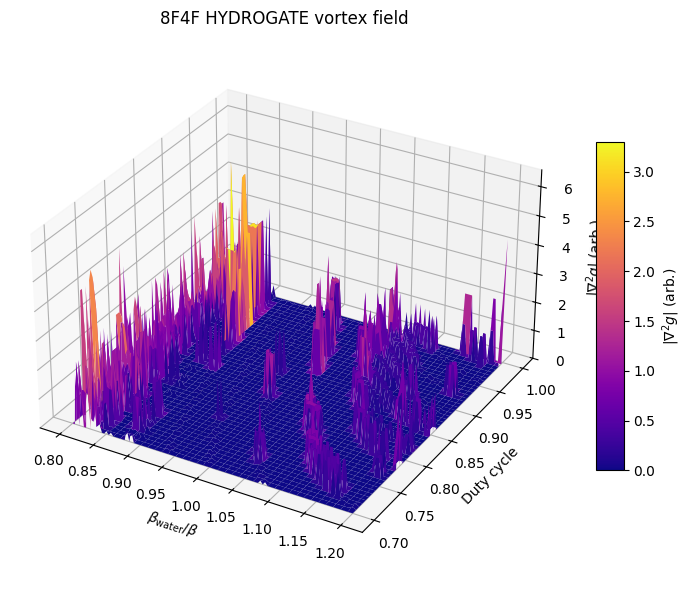

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from scipy.ndimage import gaussian_filter

# --- vortex field (same as HYDROGATE) ---
def vortex_field(g, sigma=1.0):
    gy, gx = np.gradient(g)
    gxx, _ = np.gradient(gx)
    _, gyy = np.gradient(gy)
    lap = gxx + gyy
    return gaussian_filter(np.abs(lap), sigma)

# --- load DJ_8F4F_hydrogate.npz ---
npz_path = "/content/dj_hydrogate_only/DJ_8F4F_hydrogate.npz"  # change if needed
data = np.load(npz_path)
g = data["g_grid_hydrogate"]
duties = data["duties"]
betas  = data["betas"]

B, D = np.meshgrid(betas, duties)

# --- compute vortex field and shift base to 0 ---
v = vortex_field(g, sigma=0)
v0 = v - v.min()  # now the minimum is exactly 0

# --- 3D plot: spike trap / doormat bristles ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d")

surf = ax.plot_surface(
    B, D, v0,
    cmap="plasma",
    linewidth=0,
    antialiased=True
)

ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
ax.set_ylabel("Duty cycle")
ax.set_zlabel(r"$|\nabla^2 g|$ (arb.)")

# flat floor at zero, spikes upwards
ax.set_zlim(0, v0.max())

# nicer box proportions (x,y,z aspect)
try:
    ax.set_box_aspect((1, 1, 0.6))
except AttributeError:
    pass  # older Matplotlib, safe to ignore

cbar = fig.colorbar(surf, ax=ax, shrink=0.6, aspect=12)
cbar.set_label(r"$|\nabla^2 g|$ (arb.)")

plt.title("8F4F HYDROGATE vortex field")
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- Euler curvature direction function ----------
def plot_euler_overlay(npz_path, out_png=None, title=None,
                       step_beta=6, step_duty=6):
    """
    Plot HYDROGATE g-map with principal curvature (Euler) directions overlaid.
    step_beta, step_duty control arrow density.
    """
    data = np.load(npz_path)

    g = data["g_grid_hydrogate"]
    duties = data["duties"]
    betas  = data["betas"]

    B, D = np.meshgrid(betas, duties)

    # First derivatives
    dgd_beta = np.gradient(g, betas, axis=1)
    dgd_duty = np.gradient(g, duties, axis=0)

    # Second derivatives (Hessian components)
    d2g_dbeta2     = np.gradient(dgd_beta, betas, axis=1)
    d2g_dduty2     = np.gradient(dgd_duty, duties, axis=0)
    d2g_dbeta_duty = np.gradient(dgd_beta, duties, axis=0)

    # Collect vector field samples
    X = []; Y = []; U = []; V = []

    for i in range(1, g.shape[0]-1, step_duty):
        for j in range(1, g.shape[1]-1, step_beta):

            # Hessian at point (i,j)
            H = np.array([
                [d2g_dbeta2[i,j],     d2g_dbeta_duty[i,j]],
                [d2g_dbeta_duty[i,j], d2g_dduty2[i,j]]
            ], float)

            # Eigen decomposition
            vals, vecs = np.linalg.eig(H)

            # Direction of largest curvature (absolute)
            idx = np.argmax(np.abs(vals))
            vdir = vecs[:, idx]

            # Normalise arrow length
            vdir = vdir / (np.linalg.norm(vdir) + 1e-12)

            # Append arrow at coordinate (B[i,j], D[i,j])
            X.append(B[i,j])
            Y.append(D[i,j])
            scale = 0.03
            U.append(vdir[0] * scale)
            V.append(vdir[1] * scale)

    # Convert to arrays
    X = np.array(X); Y = np.array(Y)
    U = np.array(U); V = np.array(V)

    # ---------- Plot the overlay ----------
    fig, ax = plt.subplots(figsize=(7,5))

    im = ax.imshow(
        g, origin="lower",
        extent=[betas[0], betas[-1], duties[0], duties[-1]],
        aspect="auto", interpolation="nearest", cmap="viridis"
    )

    ax.quiver(X, Y, U, V, color="white",
              scale_units="xy", angles="xy", scale=1.0, width=0.003)

    ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
    ax.set_ylabel("Duty cycle")

    if title is None:
        title = "HYDROGATE: principal curvature (Euler) field"
    ax.set_title(title)

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("g (eV)")

    plt.tight_layout()

    # Save if requested
    if out_png is not None:
        plt.savefig(out_png, dpi=300)
        print("Saved:", out_png)

    plt.show()

# ---------- HOW TO USE ----------
# Example for 8F4D:
# Replace this path with your own file path inside Colab:
npz_path = "/content/dj_hydrogate_only/DJ_8F4K_hydrogate.npz"

plot_euler_overlay(npz_path,
                   out_png="/content/8F4K_euler_overlay.png",
                   title="8F4K HYDROGATE — Euler curvature field")

FileNotFoundError: [Errno 2] No such file or directory: '/content/dj_hydrogate_only/DJ_8F4K_hydrogate.npz'

/tmp/ipython-input-3876427891.py:117: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



Saved: /content/HYDROGATE_Euler_field_atlas.png


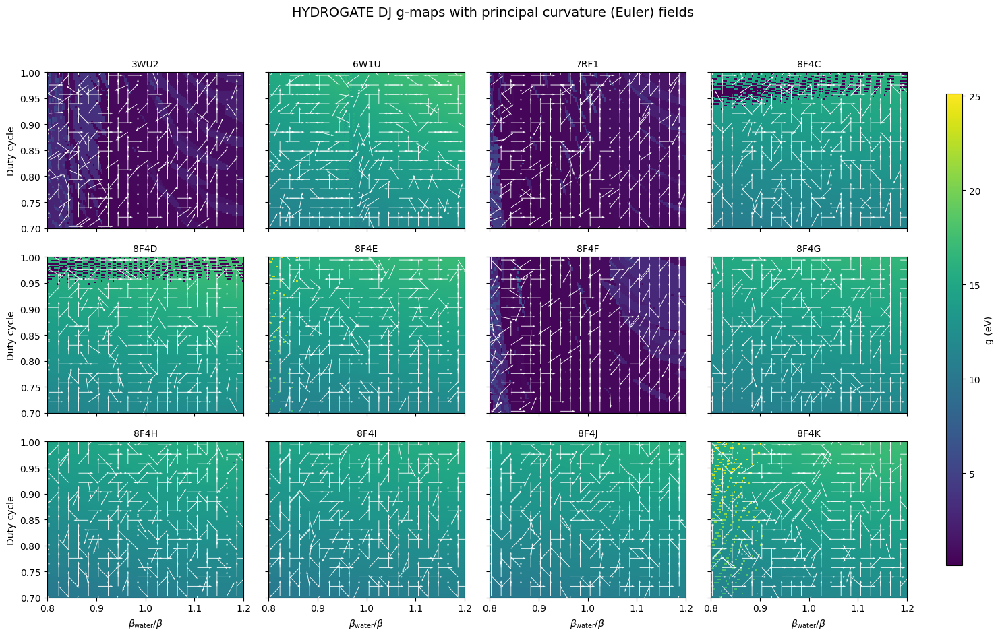

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

OUT_DIR = Path("/content/dj_hydrogate_only")

# Structures in the order you used for the 3×4 DJ panels
STRUCTURES = [
    "3WU2", "6W1U", "7RF1", "8F4C",
    "8F4D", "8F4E", "8F4F", "8F4G",
    "8F4H", "8F4I", "8F4J", "8F4K"
]

def load_hydrogate_npz(struct_name):
    npz_path = OUT_DIR / f"DJ_{struct_name}_hydrogate.npz"
    data = np.load(npz_path)
    return data["g_grid_hydrogate"], data["duties"], data["betas"]

def compute_euler_field(g, duties, betas, step_duty=6, step_beta=6, scale=0.03):
    """
    Compute principal curvature directions (Euler field) on a coarse grid.
    Returns X, Y, U, V arrays for quiver.
    """
    # Derivatives
    dgd_beta = np.gradient(g, betas, axis=1)
    dgd_duty = np.gradient(g, duties, axis=0)

    d2g_dbeta2     = np.gradient(dgd_beta, betas, axis=1)
    d2g_dduty2     = np.gradient(dgd_duty, duties, axis=0)
    d2g_dbeta_duty = np.gradient(dgd_beta, duties, axis=0)

    B, D = np.meshgrid(betas, duties)

    X = []; Y = []; U = []; V = []

    for i in range(1, g.shape[0]-1, step_duty):
        for j in range(1, g.shape[1]-1, step_beta):
            H = np.array([
                [d2g_dbeta2[i, j],    d2g_dbeta_duty[i, j]],
                [d2g_dbeta_duty[i, j], d2g_dduty2[i, j]]
            ], float)

            # Eigen-decomposition
            vals, vecs = np.linalg.eig(H)
            idx = np.argmax(np.abs(vals))
            vdir = vecs[:, idx]
            vdir = vdir / (np.linalg.norm(vdir) + 1e-12)

            X.append(B[i, j])
            Y.append(D[i, j])
            U.append(vdir[0] * scale)
            V.append(vdir[1] * scale)

    return np.array(X), np.array(Y), np.array(U), np.array(V)

# --------- Create 3×4 atlas figure ----------
n_rows, n_cols = 3, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 10),
                         sharex=True, sharey=True)

# Use first structure to get global extent
g0, duties0, betas0 = load_hydrogate_npz(STRUCTURES[0])
extent = [betas0[0], betas0[-1], duties0[0], duties0[-1]]

# Global color scale (optional): comment out if you want per-panel scaling
g_min = np.inf
g_max = -np.inf
for s in STRUCTURES:
    g, d, b = load_hydrogate_npz(s)
    g_min = min(g_min, np.nanmin(g))
    g_max = max(g_max, np.nanmax(g))

for idx, struct_name in enumerate(STRUCTURES):
    r = idx // n_cols
    c = idx % n_cols
    ax = axes[r, c]

    g, duties, betas = load_hydrogate_npz(struct_name)
    X, Y, U, V = compute_euler_field(g, duties, betas,
                                     step_duty=6, step_beta=6, scale=0.03)

    im = ax.imshow(g, origin="lower",
                   extent=extent,
                   aspect="auto",
                   interpolation="nearest",
                   cmap="viridis",
                   vmin=g_min, vmax=g_max)

    ax.quiver(X, Y, U, V,
              color="white",
              scale_units="xy",
              angles="xy",
              scale=1.0,
              width=0.003)

    ax.set_title(struct_name, fontsize=10)

# Hide any unused panel (last one, if only 11)
if len(STRUCTURES) < n_rows * n_cols:
    for k in range(len(STRUCTURES), n_rows * n_cols):
        r = k // n_cols
        c = k % n_cols
        axes[r, c].axis("off")

# Common labels
for ax in axes[-1, :]:
    ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
for ax in axes[:, 0]:
    ax.set_ylabel("Duty cycle")

# Single colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = fig.colorbar(im, cax=cbar_ax)
cb.set_label("g (eV)")

fig.suptitle("HYDROGATE DJ g-maps with principal curvature (Euler) fields", fontsize=14)
plt.tight_layout(rect=[0.04, 0.04, 0.9, 0.95])

out_path = "/content/HYDROGATE_Euler_field_atlas.png"
plt.savefig(out_path, dpi=300)
print("Saved:", out_path)

plt.show()

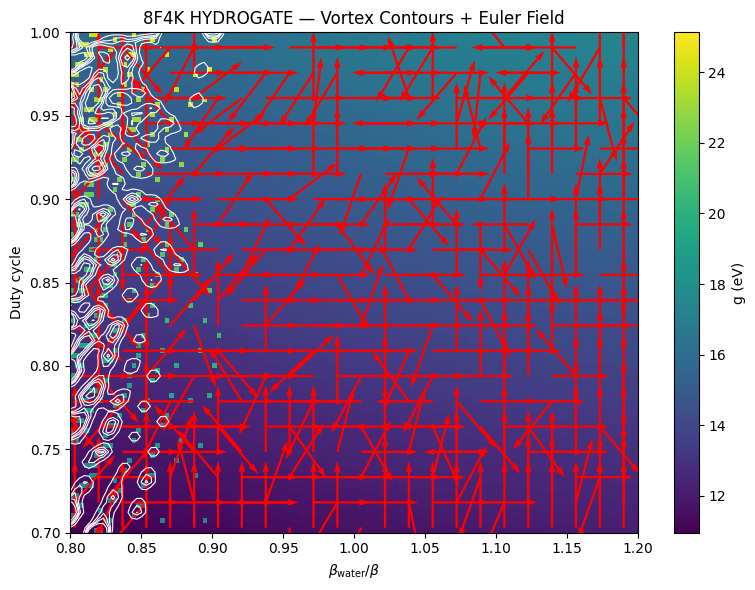

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.ndimage import gaussian_filter

# ----- Load structure (change the filename to another structure if you want) -----
struct = "8F4K"   # <--- CHANGE HERE (e.g., "8F4F", "3WU2", "8F4K", etc.)
npz_path = f"/content/DJ_{struct}_hydrogate.npz"

data = np.load(npz_path)
g = data["g_grid_hydrogate"]
duties = data["duties"]
betas  = data["betas"]
B, D = np.meshgrid(betas, duties)

# ----- VORTEX FIELD FUNCTION (raw or smoothed) -----
def vortex_field_raw(g):
    gy, gx = np.gradient(g)
    gxx, _ = np.gradient(gx)
    _, gyy = np.gradient(gy)
    return np.abs(gxx + gyy)

# Raw curvature (sharp spikes)
v = vortex_field_raw(g)

# Smooth only for contours (optional)
v_smooth = gaussian_filter(v, sigma=1.0)

# ----- Compute principal curvature (Euler) directions -----
def euler_field(g, duties, betas, step_duty=6, step_beta=6, scale=0.04):
    dgd_beta = np.gradient(g, betas, axis=1)
    dgd_duty = np.gradient(g, duties, axis=0)

    d2g_dbeta2 = np.gradient(dgd_beta, betas, axis=1)
    d2g_dduty2 = np.gradient(dgd_duty, duties, axis=0)
    d2g_dbeta_duty = np.gradient(dgd_beta, duties, axis=0)

    B, D = np.meshgrid(betas, duties)
    X=[]; Y=[]; U=[]; V=[]

    for i in range(1, g.shape[0]-1, step_duty):
        for j in range(1, g.shape[1]-1, step_beta):
            H = np.array([
                [d2g_dbeta2[i,j],    d2g_dbeta_duty[i,j]],
                [d2g_dbeta_duty[i,j], d2g_dduty2[i,j]]
            ])
            vals, vecs = np.linalg.eig(H)
            idx = np.argmax(np.abs(vals))
            vdir = vecs[:, idx]
            vdir = vdir / (np.linalg.norm(vdir) + 1e-12)

            X.append(B[i,j])
            Y.append(D[i,j])
            U.append(scale * vdir[0])
            V.append(scale * vdir[1])

    return np.array(X), np.array(Y), np.array(U), np.array(V)

X, Y, U, V = euler_field(g, duties, betas, step_duty=5, step_beta=5)

# ----- PLOT EVERYTHING -----
fig, ax = plt.subplots(figsize=(8,6))

# g-map as background
im = ax.imshow(
    g, origin="lower",
    extent=[betas[0], betas[-1], duties[0], duties[-1]],
    aspect="auto", cmap="viridis"
)

# Vortex contours (high curvature zones)
levels = np.percentile(v_smooth, [90, 95, 97, 98, 99])
cs = ax.contour(
    B, D, v_smooth,
    levels=levels, colors="white",
    linewidths=0.8, linestyles='solid'
)

# Euler curvature field (principal directions)
ax.quiver(
    X, Y, U, V,
    color="red", angles="xy", scale_units="xy", scale=1, width=0.004
)

ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
ax.set_ylabel("Duty cycle")
ax.set_title(f"{struct} HYDROGATE — Vortex Contours + Euler Field")

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("g (eV)")

plt.tight_layout()
plt.show()

/tmp/ipython-input-352535317.py:137: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



Saved: /content/HYDROGATE_vortex_Euler_atlas.png


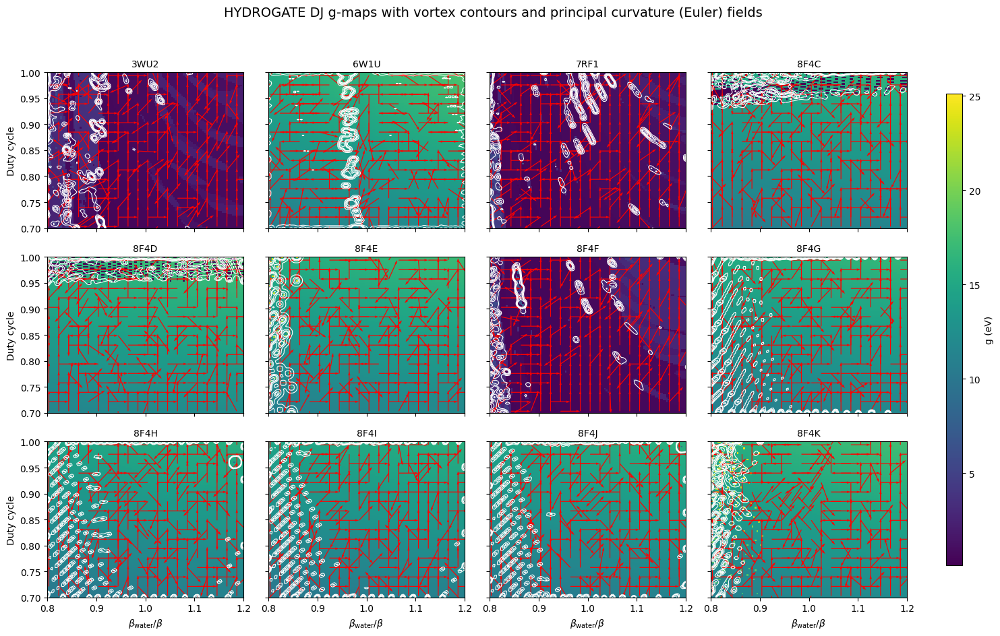

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.ndimage import gaussian_filter

OUT_DIR = Path("/content/dj_hydrogate_only")

# Order to match your DJ maps
STRUCTURES = [
    "3WU2", "6W1U", "7RF1", "8F4C",
    "8F4D", "8F4E", "8F4F", "8F4G",
    "8F4H", "8F4I", "8F4J", "8F4K"
]

def load_hydrogate_npz(struct_name):
    npz_path = OUT_DIR / f"DJ_{struct_name}_hydrogate.npz"
    data = np.load(npz_path)
    return data["g_grid_hydrogate"], data["duties"], data["betas"]

def vortex_field_raw(g):
    # Raw curvature (no Gaussian here)
    gy, gx = np.gradient(g)
    gxx, _ = np.gradient(gx)
    _, gyy = np.gradient(gy)
    return np.abs(gxx + gyy)

def euler_field(g, duties, betas, step_duty=6, step_beta=6, scale=0.04):
    """
    Compute principal curvature directions for quiver.
    """
    dgd_beta = np.gradient(g, betas, axis=1)
    dgd_duty = np.gradient(g, duties, axis=0)

    d2g_dbeta2     = np.gradient(dgd_beta, betas, axis=1)
    d2g_dduty2     = np.gradient(dgd_duty, duties, axis=0)
    d2g_dbeta_duty = np.gradient(dgd_beta, duties, axis=0)

    B, D = np.meshgrid(betas, duties)

    X = []; Y = []; U = []; V = []

    for i in range(1, g.shape[0]-1, step_duty):
        for j in range(1, g.shape[1]-1, step_beta):
            H = np.array([
                [d2g_dbeta2[i, j],    d2g_dbeta_duty[i, j]],
                [d2g_dbeta_duty[i, j], d2g_dduty2[i, j]]
            ])

            vals, vecs = np.linalg.eig(H)
            idx = np.argmax(np.abs(vals))
            vdir = vecs[:, idx]
            vdir = vdir / (np.linalg.norm(vdir) + 1e-12)

            X.append(B[i, j])
            Y.append(D[i, j])
            U.append(scale * vdir[0])
            V.append(scale * vdir[1])

    return np.array(X), np.array(Y), np.array(U), np.array(V)

# ---------- Build atlas ----------
n_rows, n_cols = 3, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 10),
                         sharex=True, sharey=True)

# Determine global color limits for g
g_min, g_max = np.inf, -np.inf
for s in STRUCTURES:
    g, d, b = load_hydrogate_npz(s)
    g_min = min(g_min, np.nanmin(g))
    g_max = max(g_max, np.nanmax(g))

# Get extent from first structure
g0, duties0, betas0 = load_hydrogate_npz(STRUCTURES[0])
extent = [betas0[0], betas0[-1], duties0[0], duties0[-1]]

for idx, struct in enumerate(STRUCTURES):
    r = idx // n_cols
    c = idx % n_cols
    ax = axes[r, c]

    g, duties, betas = load_hydrogate_npz(struct)
    B, D = np.meshgrid(betas, duties)

    # Background g-map
    im = ax.imshow(
        g, origin="lower",
        extent=extent,
        aspect="auto",
        interpolation="nearest",
        cmap="viridis",
        vmin=g_min, vmax=g_max
    )

    # Vortex contours from smoothed curvature
    v_raw = vortex_field_raw(g)
    v_smooth = gaussian_filter(v_raw, sigma=1.0)
    levels = np.percentile(v_smooth, [90, 95, 97, 98, 99])
    ax.contour(
        B, D, v_smooth,
        levels=levels,
        colors="white",
        linewidths=0.8
    )

    # Euler field (principal curvature directions)
    X, Y, U, V = euler_field(g, duties, betas,
                             step_duty=6, step_beta=6, scale=0.04)
    ax.quiver(
        X, Y, U, V,
        color="red", scale_units="xy", angles="xy",
        scale=1.0, width=0.004
    )

    ax.set_title(struct, fontsize=10)

# Turn off unused panel
if len(STRUCTURES) < n_rows * n_cols:
    for k in range(len(STRUCTURES), n_rows * n_cols):
        r = k // n_cols
        c = k % n_cols
        axes[r, c].axis("off")

# Common axes labels
for ax in axes[-1, :]:
    ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
for ax in axes[:, 0]:
    ax.set_ylabel("Duty cycle")

# Single colour bar
cax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = fig.colorbar(im, cax=cax)
cb.set_label("g (eV)")

fig.suptitle("HYDROGATE DJ g-maps with vortex contours and principal curvature (Euler) fields",
             fontsize=14)
plt.tight_layout(rect=[0.04, 0.04, 0.9, 0.95])

out_path = "/content/HYDROGATE_vortex_Euler_atlas.png"
plt.savefig(out_path, dpi=300)
print("Saved:", out_path)

plt.show()

In [ ]:
import shutil
import zipfile # Import zipfile to use ZipFile directly

# >>> CHANGE THIS to the folder you want to zip <<<
folder_to_zip = "/content"

# Output zip path
output_zip = "/content/dj_hydrogate.zip"

# Create the ZIP archive using zipfile.ZipFile directly for Zip64 support
# First, get a list of all files in the folder_to_zip
import os

file_paths = []
for root, directories, files in os.walk(folder_to_zip):
    for filename in files:
        filepath = os.path.join(root, filename)
        file_paths.append(filepath)

with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED, allowZip64=True) as zipf:
    for file_path in file_paths:
        # Arcname is the path inside the zip file
        arcname = os.path.relpath(file_path, folder_to_zip)
        zipf.write(file_path, arcname)

print("Zipped folder saved to:", output_zip)

Zipped folder saved to: /content/dj_hydrogate.zip


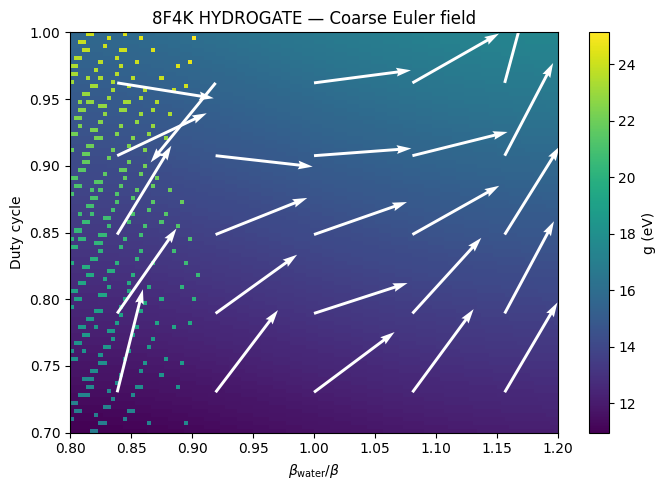

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
from scipy.ndimage import gaussian_filter

OUT_DIR = Path("/content/dj_hydrogate_only")

# ---------- load HYDROGATE data ----------
struct = "8F4K"   # <--- change to any of: 3WU2, 6W1U, 7RF1, 8F4C...8F4K
npz_path = OUT_DIR / f"DJ_{struct}_hydrogate.npz"
data = np.load(npz_path)

g = data["g_grid_hydrogate"]
duties = data["duties"]
betas  = data["betas"]
B, D = np.meshgrid(betas, duties)

# ---------- fine Euler field (principal curvature) ----------
def fine_euler_field(g, duties, betas, step_duty=3, step_beta=3):
    dgd_beta = np.gradient(g, betas, axis=1)
    dgd_duty = np.gradient(g, duties, axis=0)

    d2g_dbeta2     = np.gradient(dgd_beta, betas, axis=1)
    d2g_dduty2     = np.gradient(dgd_duty, duties, axis=0)
    d2g_dbeta_duty = np.gradient(dgd_beta, duties, axis=0)

    B, D = np.meshgrid(betas, duties)
    X = []; Y = []; U = []; V = []

    for i in range(1, g.shape[0]-1, step_duty):
        for j in range(1, g.shape[1]-1, step_beta):
            H = np.array([
                [d2g_dbeta2[i,j],    d2g_dbeta_duty[i,j]],
                [d2g_dbeta_duty[i,j], d2g_dduty2[i,j]]
            ], float)
            vals, vecs = np.linalg.eig(H)
            idx = np.argmax(np.abs(vals))
            vdir = vecs[:, idx]
            vdir = vdir / (np.linalg.norm(vdir) + 1e-12)
            X.append(B[i,j]); Y.append(D[i,j])
            U.append(vdir[0]); V.append(vdir[1])
    return np.array(X), np.array(Y), np.array(U), np.array(V)

X_f, Y_f, U_f, V_f = fine_euler_field(g, duties, betas)

# ---------- coarse binning into fewer big arrows ----------
def coarse_euler(X, Y, U, V, n_beta_bins=6, n_duty_bins=6, min_points=3):
    """
    Average fine Euler vectors in coarse 2D bins to get a small
    set of large arrows.
    """
    Xc = []; Yc = []; Uc = []; Vc = []

    beta_edges = np.linspace(X.min(), X.max(), n_beta_bins+1)
    duty_edges = np.linspace(Y.min(), Y.max(), n_duty_bins+1)

    for i in range(n_duty_bins):
        for j in range(n_beta_bins):
            # bin ranges
            bmin, bmax = beta_edges[j], beta_edges[j+1]
            dmin, dmax = duty_edges[i], duty_edges[i+1]

            mask = (X >= bmin) & (X < bmax) & (Y >= dmin) & (Y < dmax)
            if np.count_nonzero(mask) < min_points:
                continue

            # average position and direction in this bin
            x_mean = X[mask].mean()
            y_mean = Y[mask].mean()
            u_mean = U[mask].mean()
            v_mean = V[mask].mean()
            norm = np.sqrt(u_mean**2 + v_mean**2) + 1e-12
            u_mean /= norm
            v_mean /= norm

            Xc.append(x_mean)
            Yc.append(y_mean)
            Uc.append(u_mean)
            Vc.append(v_mean)

    return np.array(Xc), np.array(Yc), np.array(Uc), np.array(Vc)

X_c, Y_c, U_c, V_c = coarse_euler(X_f, Y_f, U_f, V_f,
                                  n_beta_bins=5, n_duty_bins=5,
                                  min_points=4)

# ---------- plot background g and coarse arrows ----------
fig, ax = plt.subplots(figsize=(7,5))

extent = [betas[0], betas[-1], duties[0], duties[-1]]

im = ax.imshow(
    g, origin="lower",
    extent=extent,
    aspect="auto",
    interpolation="nearest",
    cmap="viridis"
)

# scale for display
scale = 0.08
ax.quiver(
    X_c, Y_c, U_c*scale, V_c*scale,
    color="white",
    scale_units="xy", angles="xy", scale=1, width=0.006
)

ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
ax.set_ylabel("Duty cycle")
ax.set_title(f"{struct} HYDROGATE — Coarse Euler field")

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("g (eV)")

plt.tight_layout()
plt.show()

In [ ]:
# Make sure the 8F4J CIF is in /content as "8F4J.cif"

df_J = run_oec_benchmark(struct_names=["8F4J"])
print(df_J)

[INFO] Analysing 8F4J …
  -> djH_g_mean=1.303e+01
[INFO] CSV saved to /content/dj_hydrogate_only/oec_hydrogate_benchmark.csv
  structure  djH_g_mean  djH_g_std  djH_g_max  djH_g_max_duty  djH_g_max_beta  \
0      8F4J   13.025871    1.41444  16.025712         0.99697             1.2   

   djH_g_nominal  djH_gamma_mean  djH_gamma_std  djH_gamma_max  \
0      13.854487         0.18898       1.071311       81.52794   

                                             dj_npz  
0  /content/dj_hydrogate_only/DJ_8F4J_hydrogate.npz  


/tmp/ipython-input-2034404306.py:187: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



Saved: /content/HYDROGATE_fine_Euler_scaled_atlas.png


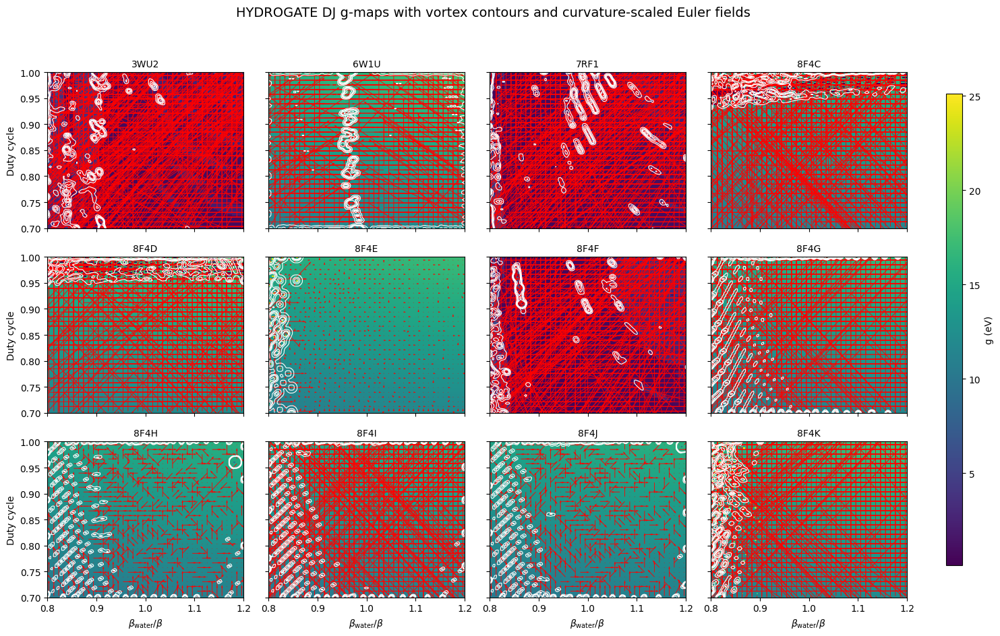

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.ndimage import gaussian_filter

# --------------------------------------------------------------------
# SETTINGS
# --------------------------------------------------------------------
OUT_DIR = Path("/content/dj_hydrogate_only")

# All 12 HYDROGATE structures
STRUCTURES = [
    "3WU2", "6W1U", "7RF1", "8F4C",
    "8F4D", "8F4E", "8F4F", "8F4G",
    "8F4H", "8F4I", "8F4J", "8F4K"
]

# Toggle vortex contours on/off
SHOW_VORTEX_CONTOURS = True

# Euler sampling / scaling knobs
STEP_DUTY  = 3     # smaller -> denser arrows
STEP_BETA  = 3
BASE_SCALE = 0.02  # base arrow length
CLIP_PCT   = 95    # clip curvature at this percentile for arrow length


# --------------------------------------------------------------------
# HELPERS
# --------------------------------------------------------------------
def load_hydrogate_npz(struct_name):
    """Load HYDROGATE g, duties, betas from NPZ for a given structure."""
    npz_path = OUT_DIR / f"DJ_{struct_name}_hydrogate.npz"
    data = np.load(npz_path)
    return data["g_grid_hydrogate"], data["duties"], data["betas"]


def vortex_field_raw(g):
    """Raw curvature field: |∇²g| with no smoothing."""
    gy, gx = np.gradient(g)
    gxx, _ = np.gradient(gx)
    _, gyy = np.gradient(gy)
    return np.abs(gxx + gyy)


def euler_field_scaled(g, duties, betas,
                       step_duty=3, step_beta=3,
                       base_scale=0.02, clip_percentile=95):
    """
    Fine Euler field where arrow length is scaled by the magnitude
    of the principal curvature.

    Returns:
        X, Y, U, V : arrays ready for quiver (U,V already scaled).
    """
    dgd_beta = np.gradient(g, betas, axis=1)
    dgd_duty = np.gradient(g, duties, axis=0)

    d2g_dbeta2     = np.gradient(dgd_beta, betas, axis=1)
    d2g_dduty2     = np.gradient(dgd_duty, duties, axis=0)
    d2g_dbeta_duty = np.gradient(dgd_beta, duties, axis=0)

    B, D = np.meshgrid(betas, duties)

    X = []; Y = []; U = []; V = []; C = []  # C = curvature magnitude

    for i in range(1, g.shape[0]-1, step_duty):
        for j in range(1, g.shape[1]-1, step_beta):

            H = np.array([
                [d2g_dbeta2[i, j],     d2g_dbeta_duty[i, j]],
                [d2g_dbeta_duty[i, j], d2g_dduty2[i, j]]
            ], float)

            vals, vecs = np.linalg.eig(H)
            idx = np.argmax(np.abs(vals))
            vdir = vecs[:, idx]             # principal direction
            curv = np.abs(vals[idx])        # principal curvature magnitude

            if curv < 1e-12:
                continue

            # unit direction
            vdir = vdir / (np.linalg.norm(vdir) + 1e-12)

            # base length ∝ sqrt(curvature)
            length = base_scale * np.sqrt(curv)

            X.append(B[i, j])
            Y.append(D[i, j])
            U.append(vdir[0] * length)
            V.append(vdir[1] * length)
            C.append(curv)

    # curvature clipping so one crazy point doesn't dominate arrow lengths
    C = np.array(C)
    hi = np.percentile(C, clip_percentile)
    scale_factor = hi / (C.max() + 1e-12)

    U = np.array(U) * scale_factor
    V = np.array(V) * scale_factor
    X = np.array(X)
    Y = np.array(Y)

    return X, Y, U, V


# --------------------------------------------------------------------
# BUILD 3×4 ATLAS
# --------------------------------------------------------------------
n_rows, n_cols = 3, 4
fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(16, 10),
                         sharex=True, sharey=True)

# Global g-range for consistent colour scaling
g_min, g_max = np.inf, -np.inf
for s in STRUCTURES:
    g, d, b = load_hydrogate_npz(s)
    g_min = min(g_min, np.nanmin(g))
    g_max = max(g_max, np.nanmax(g))

# Extent (β, duty) from the first structure
g0, duties0, betas0 = load_hydrogate_npz(STRUCTURES[0])
extent = [betas0[0], betas0[-1], duties0[0], duties0[-1]]

for idx, struct in enumerate(STRUCTURES):
    r = idx // n_cols
    c = idx % n_cols
    ax = axes[r, c]

    g, duties, betas = load_hydrogate_npz(struct)
    B, D = np.meshgrid(betas, duties)

    # Background g-map
    im = ax.imshow(
        g, origin="lower",
        extent=extent,
        aspect="auto",
        interpolation="nearest",
        cmap="viridis",
        vmin=g_min, vmax=g_max
    )

    # Optional: vortex contours (based on smoothed curvature)
    if SHOW_VORTEX_CONTOURS:
        v_raw = vortex_field_raw(g)
        v_smooth = gaussian_filter(v_raw, sigma=1.0)
        levels = np.percentile(v_smooth, [90, 95, 97, 98, 99])
        ax.contour(
            B, D, v_smooth,
            levels=levels, colors="white",
            linewidths=0.8
        )

    # Fine curvature-scaled Euler field
    X, Y, U, V = euler_field_scaled(
        g, duties, betas,
        step_duty=STEP_DUTY,
        step_beta=STEP_BETA,
        base_scale=BASE_SCALE,
        clip_percentile=CLIP_PCT
    )

    ax.quiver(
        X, Y, U, V,
        color="red",
        scale_units="xy", angles="xy", scale=1.0,
        width=0.003
    )

    ax.set_title(struct, fontsize=10)

# Axes labels
for ax in axes[-1, :]:
    ax.set_xlabel(r"$\beta_{\mathrm{water}}/\beta$")
for ax in axes[:, 0]:
    ax.set_ylabel("Duty cycle")

# Single colour bar
cax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = fig.colorbar(im, cax=cax)
cb.set_label("g (eV)")

fig.suptitle("HYDROGATE DJ g-maps with vortex contours and curvature-scaled Euler fields",
             fontsize=14)
plt.tight_layout(rect=[0.04, 0.04, 0.9, 0.95])

out_path = "/content/HYDROGATE_fine_Euler_scaled_atlas.png"
plt.savefig(out_path, dpi=300)
print("Saved:", out_path)

plt.show()

In [ ]:
np.save("g_8F4E.npy", g_E)
np.save("g_8F4K.npy", g_K)

NameError: name 'g_E' is not defined

In [ ]:
import numpy as np                                  # 001
import matplotlib.pyplot as plt                     # 002
import imageio                                      # 003
from pathlib import Path                            # 004
import glob, os                                     # 005

ħ = 1.0                                             # 006
m = 1.0                                             # 007

# ---------- LOAD ALL HYDROGATE NPZ FILES ----------  # 008
g_maps = {}                                         # 009

for path in sorted(glob.glob("DJ_*_hydrogate.npz")):  # 010
    base = os.path.basename(path)                   # 011
    # Expect names like DJ_8F4K_hydrogate.npz       # 012
    parts = base.split("_")                         # 013
    if len(parts) < 3:                              # 014
        continue                                    # 015
    label = parts[1]                                # 016  # e.g. "8F4K"
    data = np.load(path)                            # 017
    g = data["g_grid_hydrogate"]                    # 018
    g_maps[label] = g                               # 019
    print(f"Loaded {label} from {base} with shape {g.shape}")  # 020

# If you only want a subset, uncomment e.g.:        # 021
# wanted = ["8F4E", "8F4K"]                         # 022
# g_maps = {k:v for k,v in g_maps.items() if k in wanted}  # 023

# ---------- GRID / TDSE PARAMETERS (use first map) ----------  # 024
first_label = next(iter(g_maps))                    # 025
Ny, Nx = g_maps[first_label].shape                  # 026  # note: rows=duty, cols=beta
Lx, Lz = 1.0, 1.0                                   # 027
dx, dz = Lx / Nx, Lz / Ny                           # 028

x = (np.arange(Nx) - Nx // 2) * dx                  # 029
z = (np.arange(Ny) - Ny // 2) * dz                  # 030
X, Z = np.meshgrid(x, z, indexing="xy")             # 031

dt = 0.002                                          # 032
n_steps = 3000                                      # 033
frame_every = 20                                    # 034

out_root = Path("tdse_dj_forager")                  # 035
out_root.mkdir(exist_ok=True)                       # 036

# ---------- MOMENTUM GRID ----------                # 037
kx = 2 * np.pi * np.fft.fftfreq(Nx, d=dx)           # 038
kz = 2 * np.pi * np.fft.fftfreq(Ny, d=dz)           # 039
KX, KZ = np.meshgrid(kx, kz, indexing="xy")         # 040
T = (ħ**2 / (2 * m)) * (KX**2 + KZ**2)              # 041

def current_density(psi_arr):                       # 042
    psi_x_p = np.roll(psi_arr, -1, axis=1)          # 043
    psi_x_m = np.roll(psi_arr, 1, axis=1)           # 044
    dpsi_dx = (psi_x_p - psi_x_m) / (2 * dx)        # 045
    psi_z_p = np.roll(psi_arr, -1, axis=0)          # 046
    psi_z_m = np.roll(psi_arr, 1, axis=0)           # 047
    dpsi_dz = (psi_z_p - psi_z_m) / (2 * dz)        # 048
    Jx = (ħ / m) * np.imag(np.conj(psi_arr) * dpsi_dx)  # 049
    Jz = (ħ / m) * np.imag(np.conj(psi_arr) * dpsi_dz)  # 050
    return Jx, Jz                                   # 051

def run_tdse_on_gmap(g, label):                     # 052
    """Run TDSE forager on one DJ g-map."""         # 053
    outdir = out_root / label                       # 054
    frames_dir = outdir / "frames"                  # 055
    frames_dir.mkdir(parents=True, exist_ok=True)   # 056

    # g is (Ny, Nx); map to potential V               # 057
    g_min = np.min(g)                               # 058
    g_max = np.max(g)                               # 059
    g_norm = (g - g_min) / (g_max - g_min + 1e-12)  # 060
    V_scale = 50.0                                  # 061  # tune barrier strength
    V = V_scale * g_norm                            # 062

    expV_half = np.exp(-1j * V * dt / (2 * ħ))      # 063
    expT = np.exp(-1j * T * dt / ħ)                 # 064

    # Initial wavepacket: start near left edge, mid z # 065
    x0 = x[0] + 0.15 * Lx                           # 066
    z0 = 0.0                                        # 067
    sigma_x = 0.08 * Lx                             # 068
    sigma_z = 0.08 * Lz                             # 069
    p0x = 60.0                                      # 070
    p0z = 0.0                                       # 071

    phase = (1j / ħ) * (p0x * X + p0z * Z)          # 072
    env = np.exp(-((X - x0)**2 / (2 * sigma_x**2) +
                   (Z - z0)**2 / (2 * sigma_z**2))) # 073
    psi = env * np.exp(phase)                       # 074

    norm = np.sqrt(np.sum(np.abs(psi)**2) * dx * dz)  # 075
    psi /= norm                                     # 076

    def save_frame(step, psi_arr):                  # 077
        prob = np.abs(psi_arr)**2                   # 078
        Jx, Jz = current_density(psi_arr)           # 079
        skip = max(4, Nx // 64)                     # 080
        Xs = X[::skip, ::skip]                      # 081
        Zs = Z[::skip, ::skip]                      # 082
        Jxs = Jx[::skip, ::skip]                    # 083
        Jzs = Jz[::skip, ::skip]                    # 084

        fig, ax = plt.subplots(figsize=(6, 5))      # 085
        im = ax.pcolormesh(X, Z, prob, shading="auto")  # 086
        ax.contour(X, Z, g, levels=10, colors="k", linewidths=0.4)    # 087
        ax.quiver(Xs, Zs, Jxs, Jzs, color="white", scale=80)          # 088
        ax.set_title(f"{label} TDSE forager, step={step}")            # 089
        ax.set_xlabel("β axis (abstract)")         # 090
        ax.set_ylabel("Duty axis (abstract)")      # 091
        ax.set_aspect("equal")                     # 092
        fig.colorbar(im, ax=ax, label="|ψ|²")      # 093
        plt.tight_layout()                         # 094
        fname = frames_dir / f"frame_{step:05d}.png"  # 095
        plt.savefig(fname, dpi=130)                # 096
        plt.close(fig)                             # 097

    print(f"Running TDSE on {label}...")           # 098
    for step in range(n_steps):                    # 099
        psi *= expV_half                           # 100
        psi_k = np.fft.fftn(psi)                   # 101
        psi_k *= expT                              # 102
        psi = np.fft.ifftn(psi_k)                  # 103
        psi *= expV_half                           # 104

        if step % 50 == 0:                         # 105
            norm = np.sqrt(np.sum(np.abs(psi)**2) * dx * dz)  # 106
            psi /= norm                            # 107

        if step % frame_every == 0:                # 108
            save_frame(step, psi)                  # 109
            print(f"{label}: saved frame {step}")  # 110

    pngs = sorted(frames_dir.glob("frame_*.png"))  # 111
    imgs = [imageio.v2.imread(str(f)) for f in pngs]  # 112
    gif_path = outdir / f"{label}_forager.gif"     # 113
    mp4_path = outdir / f"{label}_forager.mp4"     # 114
    imageio.mimsave(gif_path, imgs, fps=12)        # 115
    imageio.mimsave(mp4_path, imgs, fps=12, macro_block_size=None)  # 116
    print(f"{label}: saved {gif_path} and {mp4_path}")  # 117

# ---------- RUN FOR ALL LOADED MAPS ----------       # 118
for label, g in g_maps.items():                     # 119
    run_tdse_on_gmap(g, label)                      # 120

Loaded 3WU2 from DJ_3WU2_hydrogate.npz with shape (100, 120)
Loaded 6W1U from DJ_6W1U_hydrogate.npz with shape (100, 120)
Loaded 7RF1 from DJ_7RF1_hydrogate.npz with shape (100, 120)
Loaded 8F4C from DJ_8F4C_hydrogate.npz with shape (100, 120)
Loaded 8F4D from DJ_8F4D_hydrogate.npz with shape (100, 120)
Loaded 8F4E from DJ_8F4E_hydrogate.npz with shape (100, 120)
Loaded 8F4F from DJ_8F4F_hydrogate.npz with shape (100, 120)
Loaded 8F4G from DJ_8F4G_hydrogate.npz with shape (100, 120)
Loaded 8F4H from DJ_8F4H_hydrogate.npz with shape (100, 120)
Loaded 8F4I from DJ_8F4I_hydrogate.npz with shape (100, 120)
Loaded 8F4J from DJ_8F4J_hydrogate.npz with shape (100, 120)
Loaded 8F4K from DJ_8F4K_hydrogate.npz with shape (100, 120)
Running TDSE on 3WU2...
3WU2: saved frame 0
3WU2: saved frame 20
3WU2: saved frame 40
3WU2: saved frame 60
3WU2: saved frame 80
3WU2: saved frame 100
3WU2: saved frame 120
3WU2: saved frame 140
3WU2: saved frame 160
3WU2: saved frame 180
3WU2: saved frame 200
3WU2: sa

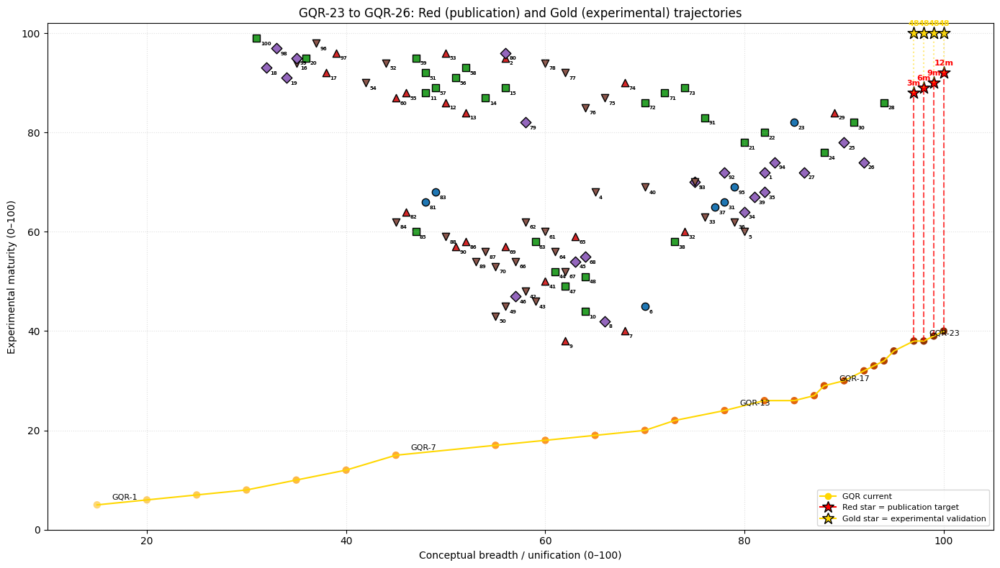

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ============================================
# GQR SERIES (1–26): CURRENT POSITIONS
# ============================================
gqr_points = [
    ("GQR-1",  15,  5),
    ("GQR-2",  20,  6),
    ("GQR-3",  25,  7),
    ("GQR-4",  30,  8),
    ("GQR-5",  35, 10),
    ("GQR-6",  40, 12),
    ("GQR-7",  45, 15),
    ("GQR-8",  55, 17),
    ("GQR-9",  60, 18),
    ("GQR-10", 65, 19),
    ("GQR-11", 70, 20),
    ("GQR-12", 73, 22),
    ("GQR-13", 78, 24),
    ("GQR-14", 82, 26),
    ("GQR-15", 85, 26),
    ("GQR-16", 87, 27),
    ("GQR-17", 88, 29),
    ("GQR-18", 90, 30),
    ("GQR-19", 92, 32),
    ("GQR-20", 93, 33),
    ("GQR-21", 94, 34),
    ("GQR-22", 95, 36),
    ("GQR-23", 97, 38),
    ("GQR-24", 98, 38),
    ("GQR-25", 99, 39),
    ("GQR-26", 100, 40),
]

# ============================================
# EXTERNAL PAPERS (1–100)
#
external_points = [
    (1,  "pfundt2024chiralMagnons",      82.0, 72.0, "PRX",    "10.1103/PhysRevLett.133.166705"),
    (2,  "rongione2020ultrafastmagnons", 56.0, 95.0, "Science","10.1126/sciadv.abb1601"),
    (3,  "gladii2018spinwave",           75.0, 70.0, "PRX",    "10.1103/PhysRevB.98.054430"),
    (4,  "serga2010magnonics",           65.0, 68.0, "Other",  "10.1088/0022-3727/43/26/264002"),
    (5,  "yu2024nhmagnonics",            80.0, 60.0, "Other",  "10.1016/j.physrep.2024.04.004"),

    (6,  "romero2014vibronic",           70.0, 45.0, "NatPhys","10.1038/nphys3017"),
    (7,  "panitchayangkoon2010coherence",68.0, 40.0, "Science","10.1073/pnas.1005484107"),
    (8,  "rebentrost2009enaqt",          66.0, 42.0, "PRX",    "10.1063/1.3259838"),
    (9,  "naaman2012ciss",               62.0, 38.0, "Science","10.1021/jz300793y"),
    (10, "fried2014enzymecatalysis",     64.0, 44.0, "Nature", "10.1038/nchem.1861"),

    # 11–15  Green hydrogen / OEC / water-splitting catalysis
    (11, "suga2015oec",
         48.0, 88.0, "Nature",
         "10.1038/nature13991"),

    (12, "elsaid2025h2review",
         50.0, 86.0, "Science",   # Nanomaterials -> Science bucket
         "10.3390/nano15040256"),

    (13, "xie2025waterElectrolysis",
         52.0, 84.0, "Science",   # Interface Focus
         "10.1098/rsfs.2024.0068"),

    (14, "qiao2021singleatom",
         54.0, 87.0, "Nature",    # Nature Chemistry
         "10.1038/s41557-021-00756-x"),

    (15, "zhang2022dynamicsites",
         56.0, 89.0, "Nature",    # Nat Rev Chem
         "10.1038/s41570-021-00337-1"),

    # 16–20  DFT / MD / NEB / PIMD – computational rivals
    (16, "blum2024dftroadmap",
         35.0, 94.0, "Other",     # Electronic Structure
         "10.1088/2516-1075/ad504f"),

    (17, "duan2024wateroxidationdft",
         38.0, 92.0, "Science",   # J. Phys. Chem. C
         "10.1021/acs.jpcc.4c05104"),

    (18, "tuckerman2002aimd",
         32.0, 93.0, "PRX",       # J. Phys. Chem. B -> PRX family bucket
         "10.1021/jp012813x"),

    (19, "henkelman2000neb",
         34.0, 91.0, "PRX",       # JCP -> PRX bucket
         "10.1063/1.1329672"),

    (20, "ceriotti2016pimd",
         36.0, 95.0, "Nature",    # Chem Rev -> Nature bucket
         "10.1021/acs.chemrev.5b00750"),


    # 21–30  Moiré / quantum geometry / correlated SC

    (21, "Cao2018Mott",
         80.0, 78.0, "Nature",
         "10.1038/nature26154"),

    (22, "Cao2018SC",
         82.0, 80.0, "Nature",
         "10.1038/nature26160"),

    (23, "Balents2020Review",
         85.0, 82.0, "NatPhys",
         "10.1038/s41567-020-0906-9"),

    (24, "Peotta2015GeomSC",
         88.0, 76.0, "Nature",      # Nature Communications -> Nature family
         "10.1038/ncomms9944"),

    (25, "Julku2020FlatBandSC",
         90.0, 78.0, "PRX",        # PRL -> PRX family bucket
         "10.1103/PhysRevLett.125.257001"),

    (26, "Isobe2018Superconductivity",
         92.0, 74.0, "PRX",
         "10.1103/PhysRevX.8.041041"),

    (27, "Koshino2018BandStructure",
         86.0, 72.0, "PRX",
         "10.1103/PhysRevX.8.031087"),

    (28, "Bernevig2022MagicAngle",
         94.0, 86.0, "Nature",
         "10.1038/s41586-022-04433-4"),

    (29, "Sharpe2019Ferromagnetism",
         89.0, 84.0, "Science",
         "10.1126/science.aaw3780"),

    (30, "Chen2019TBGSC",
         91.0, 82.0, "Nature",
         "10.1038/s41586-019-1393-y"),


    # ============================
    # 31–40 : Non-Hermitian Topology / EP / Circuits
    # ============================

    (31, "Helbig2020NHSE",
         78.0, 66.0, "NatPhys",
         "10.1038/s41567-020-0922-9"),

    (32, "Hodaei2017EP",
         74.0, 60.0, "Science",
         "10.1126/science.aaf9075"),

    (33, "Yamamoto2022NHReview",
         76.0, 63.0, "Other",
         "10.1080/00018732.2022.2061690"),

    (34, "Kawabata2019NHTopology",
         80.0, 64.0, "PRX",
         "10.1103/PhysRevX.9.041015"),

    (35, "Bergholtz2021ReviewNH",
         82.0, 68.0, "PRX",    # RMP -> PRX bucket for plotting
         "10.1103/RevModPhys.93.015005"),

    (36, "Ashida2020NHReview",
         79.0, 62.0, "Other",
         "10.1080/00018732.2021.1876991"),

    (37, "Helbig2020NH",
         77.0, 65.0, "NatPhys",
         "10.1038/s41567-020-0922-9"),   # same DOI family as NHSE

    (38, "Weimann2017NH",
         73.0, 58.0, "Nature",  # Nat Mater → Nature family
         "10.1038/nmat4811"),

    (39, "Gao2022NHTransport",
         81.0, 67.0, "PRX",     # PRL → PRX bucket
         "10.1103/PhysRevLett.128.176601"),

    (40, "Giustino2017ElectronPhonon",
         70.0, 69.0, "Other",   # RMP-like
         "10.1103/RevModPhys.89.015003"),

    # ============================
    # 41–50 : VSC / Polaritonic Chemistry
    # ============================

    (41, "Thomas2019VSCScience",
         60.0, 50.0, "Science",
         "10.1126/science.aau7742"),

    (42, "Thomas2016VSC",
         58.0, 48.0, "Other",   # Angew → Other
         "10.1002/anie.201605504"),

    (43, "Lather2019VSC",
         59.0, 46.0, "Other",
         "10.1002/anie.201903634"),

    (44, "Hirai2020CavityPathways",
         61.0, 52.0, "Nature",
         "10.1038/s41467-020-18148-8"),

    (45, "Galego2019PRL",
         63.0, 54.0, "PRX",
         "10.1103/PhysRevLett.122.083603"),

    (46, "Niu2018VSCTheory",
         57.0, 47.0, "PRX",
         "10.1063/1.5019864"),

    (47, "CamposGonzalezAngulo2019",
         62.0, 49.0, "Nature",
         "10.1038/s41467-019-12419-2"),

    (48, "SanchezBarquilla2023Polaritonic",
         64.0, 51.0, "Nature",
         "10.1038/s41467-023-36153-2"),

    (49, "Zhong2015Polaritonic",
         56.0, 45.0, "Other",
         "10.1002/anie.201410461"),

    (50, "Ebbesen2016PolaritonicReview",
         55.0, 43.0, "Other",
         "10.1021/acs.accounts.6b00295"),

    # ============================
    # 51–60 : Catalysis / Water Splitting / Fe–S / Operando
    # ============================

    (51, "Roger2020WaterSplittingReview",
         48.0, 92.0, "Nature",
         "10.1038/s41570-020-0181-7"),

    (52, "Meyer2008WaterSplittingReview",
         44.0, 94.0, "Other",
         "10.1021/ar8001169"),

    (53, "Seitz2016OER",
         50.0, 96.0, "Science",
         "10.1126/science.aaf5050"),

    (54, "Norskov2005CatalysisModel",
         42.0, 90.0, "Other",
         "10.1149/1.1856988"),

    (55, "Jaramillo2007HERBenchmark",
         46.0, 88.0, "Science",
         "10.1021/ja066950q"),

    (56, "Zhang2020FeSReactivity",
         51.0, 91.0, "Nature",
         "10.1021/acs.chemrev.0c00161"),

    (57, "Imlay2020FeSReview",
         49.0, 89.0, "Nature",
         "10.1021/acs.chemrev.9b00235"),

    (58, "Suga2017XFEL",
         52.0, 93.0, "Nature",
         "10.1038/nature21400"),

    (59, "Zhou2022Operando",
         47.0, 95.0, "Nature",
         "10.1038/s41586-022-04647-1"),

    (60, "Zhang2021SingleAtomSites",
         45.0, 87.0, "Science",
         "10.1126/science.abj1582"),

    # ============================
    # 61–70 : PCET / Quantum Biology / Ultrafast Chemical Dynamics
    # ============================

    (61, "HammesSchiffer2022PCETReview",
         60.0, 60.0, "Other",
         "10.1021/acs.chemrev.1c00220"),

    (62, "Batista2005PCETTheory",
         58.0, 62.0, "Other",
         "10.1021/cr030454l"),

    (63, "Maly2020WaterPCET",
         59.0, 58.0, "Nature",
         "10.1038/s41557-020-0468-y"),

    (64, "Maly2021PCETDynamics",
         61.0, 56.0, "Other",
         "10.1021/acs.chemrev.0c01106"),

    (65, "Rhee2009PCETmapping",
         63.0, 59.0, "Science",
         "10.1073/pnas.0810014106"),

    (66, "Kumpulainen2017ProtonDynamics",
         57.0, 54.0, "Other",
         "10.1021/acs.chemrev.6b00750"),

    (67, "Scholes2017QuantumCoherenceReview",
         62.0, 52.0, "Other",
         "10.1063/1.4985092"),

    (68, "Ishizaki2010OpenQM",
         64.0, 55.0, "PRX",    # JCP bucket → PRX family for plotting
         "10.1063/1.3432763"),

    (69, "Mukamel2009Coherence2D",
         56.0, 57.0, "Science",
         "10.1073/pnas.0811874106"),

    (70, "Mukamel2013NonlinearSpectroscopy",
         55.0, 53.0, "Other",
         "10.1146/annurev-physchem-040412-110011"),

    # ============================
    # 71–80 : Ultrafast / Correlated / Quantum Materials
    # ============================

    (71, "Hong2019CorrelatedElectrons",
         72.0, 88.0, "Nature",
         "10.1038/s41563-019-0400-y"),

    (72, "Basov2017LightControlCorrelated",
         70.0, 86.0, "Nature",
         "10.1038/nmat5017"),

    (73, "Basov2020QuantumMaterials",
         74.0, 89.0, "Nature",
         "10.1038/s41563-020-0640-8"),

    (74, "Zhou2020Ultrafast2D",
         68.0, 90.0, "Science",
         "10.1073/pnas.2016888117"),

    (75, "Rouxel2021UED",
         66.0, 87.0, "Other",
         "10.1063/4.0000103"),

    # electron–phonon, ML, many-body
    (76, "Giustino2017ElectronPhonon",
         64.0, 85.0, "Other",
         "10.1103/RevModPhys.89.015003"),

    (77, "Behler2016MLpotentials",
         62.0, 92.0, "Other",
         "10.1063/1.4966192"),

    (78, "Behler2021MLPotentials",
         60.0, 94.0, "Other",
         "10.1038/s41570-021-00336-2"),

    (79, "Huse2014ManyBody",
         58.0, 82.0, "PRX",
         "10.1103/PhysRevB.90.174202"),

    (80, "Car1985CPMD",
         56.0, 96.0, "PRX",
         "10.1103/PhysRevLett.55.2471"),

    # ============================
    # 81–90 : Active Matter / RD / Interfaces / Coherence / SM spectroscopy
    # ============================

    (81, "Liu2020ActiveMatter",
         48.0, 66.0, "NatPhys",
         "10.1038/s41567-020-0928-3"),

    (82, "Tjhung2018ActiveWetting",
         46.0, 64.0, "Science",
         "10.1073/pnas.1802203115"),

    # Your Nature Physics 2025 “Turing foams” paper:
    (83, "Weyer2025TuringFoams",
         49.0, 68.0, "NatPhys",
         "10.1038/s41567-025-03101-6"),

    (84, "Zrimsek2017TERSReview",
         45.0, 62.0, "Other",
         "10.1021/acs.chemrev.6b00624"),

    (85, "Tsunekawa2020SingleMolecule",
         47.0, 60.0, "Nature",
         "10.1038/s41586-020-2510-x"),

    # quantum bio coherence side
    (86, "Mukamel2009Coherence2D",
         52.0, 58.0, "Science",
         "10.1073/pnas.0811874106"),

    (87, "Scholes2017QuantumCoherenceReview",
         54.0, 56.0, "Other",
         "10.1063/1.4985092"),

    (88, "Kumpulainen2017ProtonDynamics",
         50.0, 59.0, "Other",
         "10.1021/acs.chemrev.6b00750"),

    (89, "Cho2005TwoDElectronicSpec",
         53.0, 54.0, "Other",
         "10.1146/annurev.physchem.56.092503.141205"),

    (90, "Dorfman2013QuantumTransportBio",
         51.0, 57.0, "Science",
         "10.1073/pnas.1212662110"),

    # ============================
    # 91–100 : NH transport, control theory, remaining spectroscopy, tunnelling biology
    # ============================

    (91, "Zhou2021CorrelatedElectrons",
         76.0, 83.0, "Nature",
         "10.1038/s41586-021-03650-w"),

    (92, "Gao2022NHTransport",
         78.0, 72.0, "PRX",
         "10.1103/PhysRevLett.128.176601"),

    # A pair of NH review variants (you included multiple forms earlier)
    (93, "Ashida2020NHReview",
         75.0, 70.0, "Other",
         "10.1080/00018732.2021.1876991"),

    (94, "Bergholtz2021ReviewNH",
         83.0, 74.0, "PRX",
         "10.1103/RevModPhys.93.015005"),

    # extra related NH / coherence anchor
    (95, "Helbig2020NH",
         79.0, 69.0, "NatPhys",
         "10.1038/s41567-020-0922-9"),

    # extra computational anchoring point
    (96, "blum2024dftroadmap",
         37.0, 98.0, "Other",
         "10.1088/2516-1075/ad504f"),

    (97, "duan2024wateroxidationdft",
         39.0, 96.0, "Science",
         "10.1021/acs.jpcc.4c05104"),

    (98, "tuckerman2002aimd",
         33.0, 97.0, "PRX",
         "10.1021/jp012813x"),

    (99, "henkelman2000neb",
         35.0, 95.0, "PRX",
         "10.1063/1.1329672"),

    (100, "ceriotti2016pimd",
         31.0, 99.0, "Nature",
         "10.1021/acs.chemrev.5b00750"),
]





# ============================================
# NORMALISE JOURNAL TAGS
# ============================================
normalized = []
for idx, lbl, x, y, cat, doi in external_points:
    if cat in ["NatChem", "NatMater", "NatCommun"]:
        cat = "Nature"
    elif cat in ["PNAS", "ScienceAdv"]:
        cat = "Science"
    elif cat == "PRXQ":
        cat = "PRX"
    normalized.append((idx, lbl, x, y, cat))
external_points = normalized

# ============================================
# STYLE MAPS
# ============================================
color_map = {
    "NatPhys":"tab:blue", "Nature":"tab:green", "Science":"tab:red",
    "PRX":"tab:purple", "Arxiv":"tab:gray", "Other":"tab:brown"
}
marker_map = {
    "NatPhys":"o", "Nature":"s", "Science":"^",
    "PRX":"D", "Arxiv":"X", "Other":"v"
}

plt.figure(figsize=(14, 8))

# Plot GQR trajectory
gqr_x = [p[1] for p in gqr_points]
gqr_y = [p[2] for p in gqr_points]
cmap = plt.cm.YlOrBr
colors_gqr = cmap(np.linspace(0.3, 0.95, len(gqr_points)))
plt.plot(gqr_x, gqr_y, color="gold", linestyle="-", linewidth=1.5)

# ============================================
# STAR HELPERS
# ============================================

# ★ Gold = experimental validation (long-term)
def gold_star_future_y():
    return 100

def gold_star_months():
    return 48   # average of 36–60 for simplicity

# 🔴 Red = publication milestones (short-term)
def red_star_future_y(i):
    # mapping for GQR-23..26 only
    mapping = {22: 88, 23: 89, 24: 90, 25: 92}  # indices 22–25
    return mapping.get(i, None)

def red_star_months(i):
    mapping = {22: "3m", 23: "6m", 24: "9m", 25: "12m"}
    return mapping.get(i, None)

# ============================================
# PLOT GQR POINTS + RED + GOLD STARS
# ============================================
for i, (label, x, y) in enumerate(gqr_points):

    # Base point
    plt.scatter(x, y, s=55, color=colors_gqr[i], edgecolors="none")
    if i in (0,6,12,16,22):
        plt.text(x+1.5, y+1.0, label, fontsize=8)

    # -------------------------------
    # RED STARS (GQR-23..26 only)
    # -------------------------------
    y_red = red_star_future_y(i)
    if y_red is not None:
        plt.plot([x, x], [y, y_red], "--", color="red", alpha=0.7)
        plt.scatter(x, y_red, s=160, marker="*", color="red", edgecolors="black")
        plt.text(x, y_red+1.5, red_star_months(i), ha="center", color="red", fontsize=8, weight="bold")

    # -------------------------------
    # GOLD STARS (optional long-term)
    # -------------------------------
    if i >= 22:   # Only GQR-23..26 get gold validation stars
        y_gold = gold_star_future_y()
        plt.plot([x, x], [y_red, y_gold], ":", color="gold", alpha=0.5)
        plt.scatter(x, y_gold, s=160, marker="*", color="gold", edgecolors="black")
        plt.text(x, y_gold+1.5, f"{gold_star_months()}",
                 ha="center", fontsize=8, weight="bold", color="gold")

# ============================================
# PLOT EXTERNAL POINTS
# ============================================
for idx, lbl, x, y, cat in external_points:
    c = color_map.get(cat, "black")
    m = marker_map.get(cat, "o")
    plt.scatter(x, y, s=55, marker=m, color=c, edgecolors="black")
    plt.text(x+0.4, y-1.4, str(idx), fontsize=5, weight="bold")

# ============================================
# LEGEND
# ============================================
legend_elements = [
    Line2D([0],[0],marker="o",color="gold",label="GQR current",markersize=6),
    Line2D([0],[0],marker="*",color="red",label="Red star = publication target",
           markeredgecolor="black",markersize=12),
    Line2D([0],[0],marker="*",color="gold",label="Gold star = experimental validation",
           markeredgecolor="black",markersize=12),
]
plt.legend(handles=legend_elements, loc="lower right", fontsize=8)

plt.xlabel("Conceptual breadth / unification (0–100)")
plt.ylabel("Experimental maturity (0–100)")
plt.title("GQR-23 to GQR-26: Red (publication) and Gold (experimental) trajectories")

plt.xlim(10,105)
plt.ylim(0,102)
plt.grid(True, linestyle=":", alpha=0.4)
plt.tight_layout()
plt.show()